# Statistical learning for sectoral equity allocation

This notebook offers the necessary code to replicate the research findings discussed in the Macrosynergy research post "Statistical learning for sectoral equity allocation". Its primary objective is to inspire readers to explore and conduct additional investigations whilst also providing a foundation for testing their own unique ideas.

On the back of our initial exploration of the [relationship between macroeconomic trends and sectoral equity indices](https://macrosynergy.com/research/macro-trends-and-equity-allocation-a-brief-introduction/), we continue the analysis of sectoral rotation signals using macro trends as well as macro and financial conditions. We take advantage of previous data ingestion and transformations of JPMaQS macro quantamental indicators, as shown in [Sectoral equity indicators](https://macrosynergy.com/research/macro-factors-and-sectoral-equity-allocation/), structuring the notebook as follows:

- Get Packages and JPMaQS Data: This section is responsible for installing and importing the necessary Python packages used throughout the analysis, as well as loading all the required data

- Feature filtering and imputation: We apply common sense in determining which categories should be part of the panel in the learning exercise. We look for consistency of feature availability across cross sections, as well as maximum coverage. Therefore we opt to discard some categories while imputing others in specific cross sections in the early period.

- Sectoral signals and naive PnLs: We proceed with statistical learning on vol-targeted relative returns, using common pipeline across sectors. This combines a feature selection mechanism based upon LARS and linear models, as we opt for simplicity.

It is important to note that while the notebook covers a selection of indicators and strategies used for the post’s main findings, users can explore countless other possible indicators and approaches. Users can modify the code to test different hypotheses and strategies based on their research and ideas. Best of luck with your research!

## Get packages and JPMaQS data

### Packages

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from macrosynergy.download import JPMaQSDownload
import macrosynergy.management as msm
import macrosynergy.panel as msp
import macrosynergy.pnl as msn
import macrosynergy.signal as mss
import macrosynergy.learning as msl
import macrosynergy.visuals as msv

from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import make_scorer

from timeit import default_timer as timer
from datetime import timedelta, date, datetime

import warnings

from IPython.display import HTML

warnings.filterwarnings("ignore")

### Previously prepared quantamental categories

In [2]:
# Import data from csv file created preparation notebook
# https://macrosynergy.com/academy/notebooks/sectoral-equity-indicators/

INPUT_PATH = os.path.join(os.getcwd(), r"../../../equity_sectoral_notebook_data.csv")

df_csv = pd.read_csv(INPUT_PATH, index_col=0)
df_csv["real_date"] = pd.to_datetime(df_csv["real_date"]).dt.date

df_csv = msm.utils.standardise_dataframe(df_csv)
df_csv = df_csv.sort_values(["cid", "xcat", "real_date"])

In [3]:
# Equity sector labels and cross sections

sector_labels = {
    "ALL": "All sectors",
    "COD": "Cons. discretionary",
    "COS": "Cons. staples",
    "CSR": "Communication services",
    "ENR": "Energy",
    "FIN": "Financials",
    "HLC": "Healthcare",
    "IND": "Industrials",
    "ITE": "Information tech",
    "MAT": "Materials",
    "REL": "Real estate",
    "UTL": "Utilities",
}
cids_secs = list(sector_labels.keys())

# Equity countries cross sections

cids_eq = [
    "AUD",
    "CAD",
    "CHF",
    "EUR",
    "GBP",
    "ILS",
    "JPY",
    "NOK",
    "NZD",
    "SEK",
    "SGD",
    "USD",
]

In [4]:
# Base category tickes of quantamental categories created by data preparation notebook:
# https://macrosynergy.com/academy/notebooks/sectoral-equity-indicators/

output_growth = [
    # industrial prod
    "XIP_SA_P1M1ML12_3MMA",
    "XIP_SA_P1M1ML12_3MMA_WG",
    # construction
    "XCSTR_SA_P1M1ML12_3MMA",
    "XCSTR_SA_P1M1ML12_3MMA_WG",
    # Excess GDP growth
    "XRGDPTECH_SA_P1M1ML12_3MMA",
    "XRGDPTECH_SA_P1M1ML12_3MMA_WG",
]
private_consumption = [
    # Consumer surveys
    "CCSCORE_SA",
    "CCSCORE_SA_D3M3ML3",
    "CCSCORE_SA_WG",
    "CCSCORE_SA_D3M3ML3_WG",
    
    "XNRSALES_SA_P1M1ML12_3MMA",
    "XRRSALES_SA_P1M1ML12_3MMA",
    "XNRSALES_SA_P1M1ML12_3MMA_WG",
    "XRRSALES_SA_P1M1ML12_3MMA_WG",
    "XRPCONS_SA_P1M1ML12_3MMA",
    "XRPCONS_SA_P1M1ML12_3MMA_WG",    
]
export = [
    "XEXPORTS_SA_P1M1ML12_3MMA",
]
labour_market = [
    "UNEMPLRATE_NSA_3MMA_D1M1ML12",
    "UNEMPLRATE_SA_3MMAv5YMA",
    "UNEMPLRATE_NSA_3MMA_D1M1ML12_WG",
    "UNEMPLRATE_SA_3MMAv5YMA_WG",
    "XEMPL_NSA_P1M1ML12_3MMA",
    "XEMPL_NSA_P1M1ML12_3MMA_WG",
    "XRWAGES_NSA_P1M1ML12",
]
business_surveys = [
    # Manufacturing
    "MBCSCORE_SA",
    "MBCSCORE_SA_D3M3ML3",
    "MBCSCORE_SA_WG",
    "MBCSCORE_SA_D3M3ML3_WG",
    # Services
    "SBCSCORE_SA",
    "SBCSCORE_SA_D3M3ML3",
    "SBCSCORE_SA_WG",
    "SBCSCORE_SA_D3M3ML3_WG",
    # Construction
    "CBCSCORE_SA",
    "CBCSCORE_SA_D3M3ML3",
    "CBCSCORE_SA_WG",
    "CBCSCORE_SA_D3M3ML3_WG",
]
private_credit = [
    "XPCREDITBN_SJA_P1M1ML12",
    "XPCREDITBN_SJA_P1M1ML12_WG",
    # liquidity conditions
    "INTLIQGDP_NSA_D1M1ML1",
    "INTLIQGDP_NSA_D1M1ML6",
]
broad_inflation = [
    # Inflation
    "XCPIC_SA_P1M1ML12",
    "XCPIH_SA_P1M1ML12",
    "XPPIH_NSA_P1M1ML12",    
]
specific_inflation = [
    "XCPIE_SA_P1M1ML12",
    "XCPIF_SA_P1M1ML12",
    "XCPIE_SA_P1M1ML12_WG",
    "XCPIF_SA_P1M1ML12_WG",
]
private_and_public_debt = [
    "HHINTNETGDP_SA_D1M1ML12",
    "HHINTNETGDP_SA_D1M1ML12_WG",
    "CORPINTNETGDP_SA_D1Q1QL4",
    "CORPINTNETGDP_SA_D1Q1QL4_WG",
    "XGGDGDPRATIOX10_NSA",
]
commodity_inventories = [
    "BMLXINVCSCORE_SA",
    "REFIXINVCSCORE_SA",
    "BASEXINVCSCORE_SA",
]
commodity_markets = [
    "BMLCOCRY_SAVT10_21DMA",
    "COXR_VT10vWTI_21DMA"    
]
real_appreciation_tot = [
    "CXPI_NSA_P1M12ML1",
    "CMPI_NSA_P1M12ML1",
    "CTOT_NSA_P1M12ML1",
    "REEROADJ_NSA_P1M12ML1",
]
interest_rates = [
    "RIR_NSA",
    "RYLDIRS02Y_NSA",
    "RYLDIRS05Y_NSA",
    "RSLOPEMIDDLE_NSA",
]

# All economic categories
ecos = output_growth + private_consumption + export + labour_market + business_surveys + private_credit + broad_inflation + specific_inflation + private_and_public_debt + commodity_inventories + commodity_markets + real_appreciation_tot + interest_rates

# Equity categories
eqrets = [
    "EQC" + sec + ret for sec in cids_secs for ret in ["XR_NSA", "R_NSAvALL", "R_VT10vALL"]
]

# All categories
all_xcats = [x + suff for x in ecos + ecos for suff in ["_ZN", "_ZN_NEG"]] + eqrets 

# Resultant tickers

tickers = [cid + "_" + xcat for cid in cids_eq for xcat in all_xcats]
print(f"Maximum number of tickers is {len(tickers)}")

Maximum number of tickers is 3552


### Download additional data from JPMaQS

In [5]:
# Additional tickers for download from JPMaQS

untradeable = [
    "EQCCODUNTRADABLE_NSA",
    "EQCCOSUNTRADABLE_NSA",
    "EQCCSRUNTRADABLE_NSA",
    "EQCENRUNTRADABLE_NSA",
    "EQCFINUNTRADABLE_NSA",
    "EQCHLCUNTRADABLE_NSA",
    "EQCINDUNTRADABLE_NSA",
    "EQCITEUNTRADABLE_NSA",
    "EQCMATUNTRADABLE_NSA",
    "EQCRELUNTRADABLE_NSA",
    "EQCUTLUNTRADABLE_NSA",   
]  # dummy variables for dates where certain sectors were untradeable

bmrs = [
    "USD_EQXR_NSA",
    "USD_EQXR_VT10"
]  # U.S. equity returns for correlation analysis

xtickers = [cid + "_" + xcat for cid in cids_eq for xcat in untradeable] + bmrs
print(f"Maximum number of tickers is {len(xtickers)}")

Maximum number of tickers is 134


In [6]:
# Download series from J.P. Morgan DataQuery by tickers
start_date = "2000-01-01"

# Retrieve credentials

client_id: str = os.getenv("DQ_CLIENT_ID")
client_secret: str = os.getenv("DQ_CLIENT_SECRET")

# Download from DataQuery
with JPMaQSDownload(client_id=client_id, client_secret=client_secret) as downloader:
    start = timer()
    assert downloader.check_connection()
    df_jpmaqs = downloader.download(
        tickers=xtickers,
        start_date=start_date,
        metrics=["value"],
        suppress_warning=True,
        show_progress=True,
    )
    end = timer()

print("Download time from DQ: " + str(timedelta(seconds=end - start)))

Timestamp UTC:  2024-12-03 17:35:50
Connection successful!


Requesting data: 100%|███████████████████████████████████████████████████████████████████| 7/7 [00:01<00:00,  4.61it/s]


Some expressions are missing from the downloaded data. Check logger output for complete list.
1 out of 134 expressions are missing. To download the catalogue of all available expressions and filter the unavailable expressions, set `get_catalogue=True` in the call to `JPMaQSDownload.download()`.
Some dates are missing from the downloaded data. 
3 out of 6504 dates are missing.
Download time from DQ: 0:00:10.911803


In [7]:
df = msm.update_df(df_csv, df_jpmaqs)

In [8]:
# Dictionary of featire category labels

cat_labels = {
    "BASEXINVCSCORE_SA_ZN": {
        "Group": "Commodity inventories",
        "Label": "Excess crude inventory score",
        "Description": "Crude oil excess inventory z-score, seasonally adjusted",
        "Geography": "global",
    },
    "BMLCOCRY_SAVT10_21DMA_ZN": {
        "Group": "Market metrics",
        "Label": "Base metals carry",
        "Description": "Nominal carry for base metals basket, seasonally and vol-adjusted, 21 days moving average",
        "Geography": "global",
    },
    "BMLXINVCSCORE_SA_ZN": {
        "Group": "Commodity inventories",
        "Label": "Excess metal inventory score",
        "Description": "Base metal excess inventory z-score, seasonally adjusted",
        "Geography": "global",
    },
    "CBCSCORE_SA_D3M3ML3_WG_ZN": {
        "Group": "Business surveys",
        "Label": "Construction confidence, q/q",
        "Description": "Construction business confidence score, seas. adjusted, change q/q",
        "Geography": "weighted",
    },
    "CBCSCORE_SA_D3M3ML3_ZN": {
        "Group": "Business surveys",
        "Label": "Construction confidence, q/q",
        "Description": "Construction business confidence score, seas. adjusted, change q/q",
        "Geography": "local",
    },
    "CBCSCORE_SA_WG_ZN": {
        "Group": "Business surveys",
        "Label": "Construction confidence",
        "Description": "Construction business confidence score, seas. adjusted",
        "Geography": "weighted",
    },
    "CBCSCORE_SA_ZN": {
        "Group": "Business surveys",
        "Label": "Construction confidence",
        "Description": "Construction business confidence score, seas. adjusted",
        "Geography": "local",
    },
    "CCSCORE_SA_D3M3ML3_WG_ZN": {
        "Group": "Private consumption",
        "Label": "Consumer confidence, q/q",
        "Description": "Consumer confidence score, seasonally adjusted, change q/q",
        "Geography": "weighted",
    },
    "CCSCORE_SA_D3M3ML3_ZN": {
        "Group": "Private consumption",
        "Label": "Consumer confidence, q/q",
        "Description": "Consumer confidence score, seasonally adjusted, change q/q",
        "Geography": "local",
    },
    "CCSCORE_SA_WG_ZN": {
        "Group": "Private consumption",
        "Label": "Consumer confidence",
        "Description": "Consumer confidence score, seasonally adjusted",
        "Geography": "weighted",
    },
    "CCSCORE_SA_ZN": {
        "Group": "Private consumption",
        "Label": "Consumer confidence",
        "Description": "Consumer confidence score, seasonally adjusted",
        "Geography": "local",
    },
    "CMPI_NSA_P1M12ML1_ZN": {
        "Group": "Real appreciation",
        "Label": "Import prices, %oya",
        "Description": "Commodity-based import price index, %oya",
        "Geography": "local",
    },
    "CTOT_NSA_P1M12ML1_ZN": {
        "Group": "Real appreciation",
        "Label": "Terms-of-trade, %oya",
        "Description": "Commodity-based terms-of-trade, %oya",
        "Geography": "local",
    },
    "CXPI_NSA_P1M12ML1_ZN": {
        "Group": "Real appreciation",
        "Label": "Export prices, %oya",
        "Description": "Commodity-based export price index, %oya",
        "Geography": "local",
    },
    "COXR_VT10vWTI_21DMA_ZN": {
        "Group": "Market metrics",
        "Label": "Refined vs crude oil returns",
        "Description": "Refined oil products vs crude oil vol-targeted return differential, 21 days moving average",
        "Geography": "global",
    },
    "INTLIQGDP_NSA_D1M1ML1_ZN": {
        "Group": "Private credit",
        "Label": "Intervention liquidity, diff m/m",
        "Description": "Intervention liquidity to GDP ratio, change over the last month",
        "Geography": "local",
    },
    "INTLIQGDP_NSA_D1M1ML6_ZN": {
        "Group": "Private credit",
        "Label": "Intervention liquidity, diff 6m",
        "Description": "Intervention liquidity to GDP ratio, change overlast 6 months",
        "Geography": "local",
    },
    "MBCSCORE_SA_D3M3ML3_WG_ZN": {
        "Group": "Business surveys",
        "Label": "Manufacturing confidence, q/q",
        "Description": "Manufacturing business confidence score, seas. adj., change q/q",
        "Geography": "weighted",
    },
    "MBCSCORE_SA_D3M3ML3_ZN": {
        "Group": "Business surveys",
        "Label": "Manufacturing confidence, q/q",
        "Description": "Manufacturing business confidence score, seas. adj., change q/q",
        "Geography": "local",
    },
    "MBCSCORE_SA_WG_ZN": {
        "Group": "Business surveys",
        "Label": "Manufacturing confidence",
        "Description": "Manufacturing business confidence score, seasonally adjusted",
        "Geography": "weighted",
    },
    "MBCSCORE_SA_ZN": {
        "Group": "Business surveys",
        "Label": "Manufacturing confidence",
        "Description": "Manufacturing business confidence score, seasonally adjusted",
        "Geography": "local",
    },
    "REEROADJ_NSA_P1M12ML1_ZN": {
        "Group": "Real appreciation",
        "Label": "Open-adj REER, %oya",
        "Description": "Openness-adjusted real effective exchange rate, %oya",
        "Geography": "local",
    },
    "REFIXINVCSCORE_SA_ZN": {
        "Group": "Commodity inventories",
        "Label": "Excess refined oil inventory score",
        "Description": "Refined oil product excess inventory z-score, seas. adjusted",
        "Geography": "global",
    },
    "RIR_NSA_ZN": {
        "Group": "Market metrics",
        "Label": "Real 1-month rate",
        "Description": "Real 1-month interest rate",
        "Geography": "local",
    },
    "RSLOPEMIDDLE_NSA_ZN": {
        "Group": "Market metrics",
        "Label": "Real 5y-2y yield",
        "Description": "Real IRS yield differentials, 5-years versus 2-years",
        "Geography": "local",
    },
    "RYLDIRS02Y_NSA_ZN": {
        "Group": "Market metrics",
        "Label": "Real 2-year yield",
        "Description": "Real 2-year IRS yield",
        "Geography": "local",
    },
    "RYLDIRS05Y_NSA_ZN": {
        "Group": "Market metrics",
        "Label": "Real 5-year yield",
        "Description": "Real 5-year IRS yield",
        "Geography": "local",
    },
    "SBCSCORE_SA_D3M3ML3_WG_ZN": {
        "Group": "Business surveys",
        "Label": "Service confidence, q/q",
        "Description": "Services business confidence score, seas. adjusted, change q/q",
        "Geography": "weighted",
    },
    "SBCSCORE_SA_D3M3ML3_ZN": {
        "Group": "Business surveys",
        "Label": "Service confidence, q/q",
        "Description": "Services business confidence score, seas. adjusted, change q/q",
        "Geography": "local",
    },
    "SBCSCORE_SA_WG_ZN": {
        "Group": "Business surveys",
        "Label": "Service confidence",
        "Description": "Services business confidence score, seasonally adjusted",
        "Geography": "weighted",
    },
    "SBCSCORE_SA_ZN": {
        "Group": "Business surveys",
        "Label": "Service confidence",
        "Description": "Services business confidence score, seasonally adjusted",
        "Geography": "local",
    },
    "UNEMPLRATE_NSA_3MMA_D1M1ML12_WG_ZN": {
        "Group": "Labour market",
        "Label": "Unemployment rate, diff oya",
        "Description": "Unemployment rate, change oya",
        "Geography": "weighted",
    },
    "UNEMPLRATE_NSA_3MMA_D1M1ML12_ZN": {
        "Group": "Labour market",
        "Label": "Unemployment rate, diff oya",
        "Description": "Unemployment rate, change oya",
        "Geography": "local",
    },
    "UNEMPLRATE_SA_3MMAv5YMA_WG_ZN": {
        "Group": "Labour market",
        "Label": "Unemployment rate, diff vs 5yma",
        "Description": "Unemployment rate, difference vs 5-year moving average",
        "Geography": "weighted",
    },
    "UNEMPLRATE_SA_3MMAv5YMA_ZN": {
        "Group": "Labour market",
        "Label": "Unemployment rate, diff vs 5yma",
        "Description": "Unemployment rate, difference vs 5-year moving average",
        "Geography": "local",
    },
    "XCPIC_SA_P1M1ML12_ZN": {
        "Group": "Inflation - broad",
        "Label": "Excess core CPI, %oya",
        "Description": "Core CPI, %oya, in excess of effective inflation target",
        "Geography": "local",
    },
    "XCPIE_SA_P1M1ML12_WG_ZN": {
        "Group": "Inflation - specific",
        "Label": "Excess energy CPI, %oya",
        "Description": "Energy CPI, %oya, in excess of effective inflation target",
        "Geography": "weighted",
    },
    "XCPIE_SA_P1M1ML12_ZN": {
        "Group": "Inflation - specific",
        "Label": "Excess energy CPI, %oya",
        "Description": "Energy CPI, %oya, in excess of effective inflation target",
        "Geography": "local",
    },
    "XCPIF_SA_P1M1ML12_WG_ZN": {
        "Group": "Inflation - specific",
        "Label": "Excess food CPI, %oya",
        "Description": "Food CPI, %oya, in excess of effective inflation target",
        "Geography": "weighted",
    },
    "XCPIF_SA_P1M1ML12_ZN": {
        "Group": "Inflation - specific",
        "Label": "Excess food CPI, %oya",
        "Description": "Food CPI, %oya, in excess of effective inflation target",
        "Geography": "local",
    },
    "XCPIH_SA_P1M1ML12_ZN": {
        "Group": "Inflation - broad",
        "Label": "Excess headline CPI, %oya",
        "Description": "Headline CPI, %oya, in excess of effective inflation target",
        "Geography": "local",
    },
    "XCSTR_SA_P1M1ML12_3MMA_WG_ZN": {
        "Group": "Output growth",
        "Label": "Excess construction growth",
        "Description": "Construction output, %oya, 3mma, in excess of 5-y median GDP growth",
        "Geography": "weighted",
    },
    "XCSTR_SA_P1M1ML12_3MMA_ZN": {
        "Group": "Output growth",
        "Label": "Excess construction growth",
        "Description": "Construction output, %oya, 3mma, in excess of 5-y median GDP growth",
        "Geography": "local",
    },
    "XEMPL_NSA_P1M1ML12_3MMA_WG_ZN": {
        "Group": "Labour market",
        "Label": "Excess employment growth",
        "Description": "Employment growth, %oya, 3mma, in excess of population growth",
        "Geography": "weighted",
    },
    "XEMPL_NSA_P1M1ML12_3MMA_ZN": {
        "Group": "Labour market",
        "Label": "Excess employment growth",
        "Description": "Employment growth, %oya, 3mma, in excess of population growth",
        "Geography": "local",
    },
    "XEXPORTS_SA_P1M1ML12_3MMA_ZN": {
        "Group": "Exports",
        "Label": "Excess export growth",
        "Description": "Exports growth, %oya, 3mma, in excess of 5-year median GDP growth",
        "Geography": "local",
    },
    "XGGDGDPRATIOX10_NSA_ZN": {
        "Group": "Debt",
        "Label": "Excess projected gov. debt",
        "Description": "Government debt-to-GDP ratio proj. in 10 years, in excess of 100%",
        "Geography": "local",
    },
    "CORPINTNETGDP_SA_D1Q1QL4_WG_ZN": {
        "Group": "Debt",
        "Label": "Corporate debt servicing, %oya",
        "Description": "Corporate net debt servicing-to-GDP ratio, seasonally-adjusted, %oya",
        "Geography": "weighted",
    },
    "CORPINTNETGDP_SA_D1Q1QL4_ZN": {
        "Group": "Debt",
        "Label": "Corporate debt servicing, %oya",
        "Description": "Corporate net debt servicing-to-GDP ratio, seasonally-adjusted, %oya",
        "Geography": "local",
    },
    "HHINTNETGDP_SA_D1M1ML12_WG_ZN": {
        "Group": "Debt",
        "Label": "Households debt servicing, %oya",
        "Description": "Households net debt servicing-to-GDP ratio, seasonally-adjusted, %oya",
        "Geography": "weighted",
    },
    "HHINTNETGDP_SA_D1M1ML12_ZN": {
        "Group": "Debt",
        "Label": "Households debt servicing, %oya",
        "Description": "Households net debt servicing-to-GDP ratio, seasonally-adjusted, %oya",
        "Geography": "local",
    },
    "XIP_SA_P1M1ML12_3MMA_WG_ZN": {
        "Group": "Output growth",
        "Label": "Excess industry growth",
        "Description": "Industrial output, %oya, 3mma, in excess of 5-y median GDP growth",
        "Geography": "weighted",
    },
    "XIP_SA_P1M1ML12_3MMA_ZN": {
        "Group": "Output growth",
        "Label": "Excess industry growth",
        "Description": "Industrial output, %oya, 3mma, in excess of 5-y median GDP growth",
        "Geography": "local",
    },
    "XNRSALES_SA_P1M1ML12_3MMA_WG_ZN": {
        "Group": "Private consumption",
        "Label": "Excess retail sales growth",
        "Description": "Nominal retail sales, %oya, 3mma, in excess of 5-y median GDP growth",
        "Geography": "weighted",
    },
    "XNRSALES_SA_P1M1ML12_3MMA_ZN": {
        "Group": "Private consumption",
        "Label": "Excess retail sales growth",
        "Description": "Nominal retail sales, %oya, 3mma, in excess of 5-y median GDP growth",
        "Geography": "local",
    },
    "XRRSALES_SA_P1M1ML12_3MMA_WG_ZN": {
        "Group": "Private consumption",
        "Label": "Excess real retail growth",
        "Description": "Real retail sales, %oya, 3mma, in excess of 5-y median GDP growth",
        "Geography": "weighted",
    },
    "XRRSALES_SA_P1M1ML12_3MMA_ZN": {
        "Group": "Private consumption",
        "Label": "Excess real retail growth",
        "Description": "Real retail sales, %oya, 3mma, in excess of 5-y median GDP growth",
        "Geography": "local",
    },
    "XPCREDITBN_SJA_P1M1ML12_WG_ZN": {
        "Group": "Private credit",
        "Label": "Excess credit growth",
        "Description": "Private credit, %oya, 3mma, in excess of 5-y median GDP growth",
        "Geography": "weighted",
    },
    "XPCREDITBN_SJA_P1M1ML12_ZN": {
        "Group": "Private credit",
        "Label": "Excess credit growth",
        "Description": "Private credit, %oya, 3mma, in excess of 5-y median GDP growth",
        "Geography": "local",
    },
    "XPPIH_NSA_P1M1ML12_ZN": {
        "Group": "Inflation - broad",
        "Label": "Excess PPI, %oya",
        "Description": "Producer price inflation, %oya, in excess of eff. inflation target",
        "Geography": "local",
    },
    "XRGDPTECH_SA_P1M1ML12_3MMA_WG_ZN": {
        "Group": "Output growth",
        "Label": "Excess GDP growth",
        "Description": "Real GDP, %oya, 3mma, using HF data, in excess of 5-y med. GDP growth",
        "Geography": "weighted",
    },
    "XRGDPTECH_SA_P1M1ML12_3MMA_ZN": {
        "Group": "Output growth",
        "Label": "Excess GDP growth",
        "Description": "Real GDP, %oya, 3mma, using HF data, in excess of 5-y med. GDP growth",
        "Geography": "local",
    },
    "XRPCONS_SA_P1M1ML12_3MMA_WG_ZN": {
        "Group": "Private consumption",
        "Label": "Excess consumption growth",
        "Description": "Real private consumption, %oya, 3mma, in excess of 5-y median GDP growth",
        "Geography": "weighted",
    },
    "XRPCONS_SA_P1M1ML12_3MMA_ZN": {
        "Group": "Private consumption",
        "Label": "Excess real consum growth",
        "Description": "Real private consumption, %oya, 3mma, in excess of 5-y median GDP growth",
        "Geography": "local",
    },
    "XRWAGES_NSA_P1M1ML12_ZN": {
        "Group": "Labour market",
        "Label": "Excess real wage growth",
        "Description": "Real wage growth, %oya, in excess of medium-term productivity growth",
        "Geography": "local",
    },
}

cat_labels = pd.DataFrame(cat_labels).T
cat_alllabel_dict = cat_labels[["Label", "Geography"]].agg(", ".join, axis=1).to_dict()

cat_labels = (
    cat_labels
    .reset_index(drop=False)
    .rename(columns={"index": "Category"})
    .set_index(["Group", "Category"])
    .sort_index()
)

[]

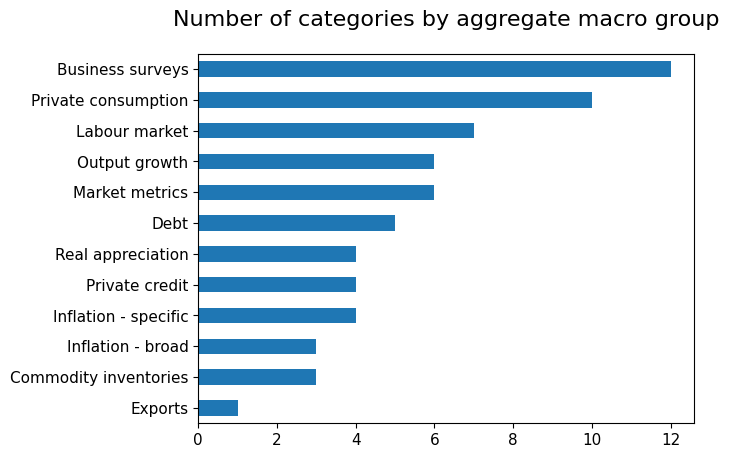

In [9]:
cat_groups_count = (
    cat_labels.index.to_frame()
    .reset_index(drop=True)
    .groupby("Group")["Category"].count()
    .sort_values(ascending=True)
)

fig = cat_groups_count.plot.barh(
    ylabel="",
    fontsize=11
)
fig.set_title(label="Number of categories by aggregate macro group", pad=20)
fig.title.set_size(16)

plt.plot()

## Feature filtering and imputation

### Cross-section availability requirement

In [10]:
# All normalized macroeconomic categories
all_macroz = [x + "_ZN" for x in ecos] 

# Identify categories with less than 10 cross sections
df_macro = df[df["xcat"].isin(all_macroz)]
cid_counts = df_macro.groupby('xcat')['cid'].nunique()
xcatx_low_cid = cid_counts[cid_counts < 10].index.tolist()
print("Categories with less than 10 cross sections:\n")
for xcat in xcatx_low_cid:
    print(xcat)

# Remove categories with less than 10 cross sections
macroz = [x for x in all_macroz if not x in xcatx_low_cid]

# Identify categories that have short history

df_macro = df[df["xcat"].isin(macroz)]
cutoff_date = pd.Timestamp("2003-01-01")
min_dates = df_macro.groupby('xcat')['real_date'].min()
xcatx_late_start = min_dates[min_dates >= cutoff_date].index.tolist()
print("\nCategories that start after 2002:\n")
for xcat in xcatx_late_start:
    print(xcat)

# Remove categories that start late
macroz = [x for x in macroz if not x in xcatx_late_start]

Categories with less than 10 cross sections:

CBCSCORE_SA_D3M3ML3_WG_ZN
CBCSCORE_SA_D3M3ML3_ZN
CBCSCORE_SA_WG_ZN
CBCSCORE_SA_ZN
CORPINTNETGDP_SA_D1Q1QL4_WG_ZN
CORPINTNETGDP_SA_D1Q1QL4_ZN
HHINTNETGDP_SA_D1M1ML12_WG_ZN
HHINTNETGDP_SA_D1M1ML12_ZN

Categories that start after 2002:

COXR_VT10vWTI_21DMA_ZN


In [11]:
# Reduce label dictionary

cat_label_dict = {k:v for k, v in cat_alllabel_dict.items() if k in macroz}


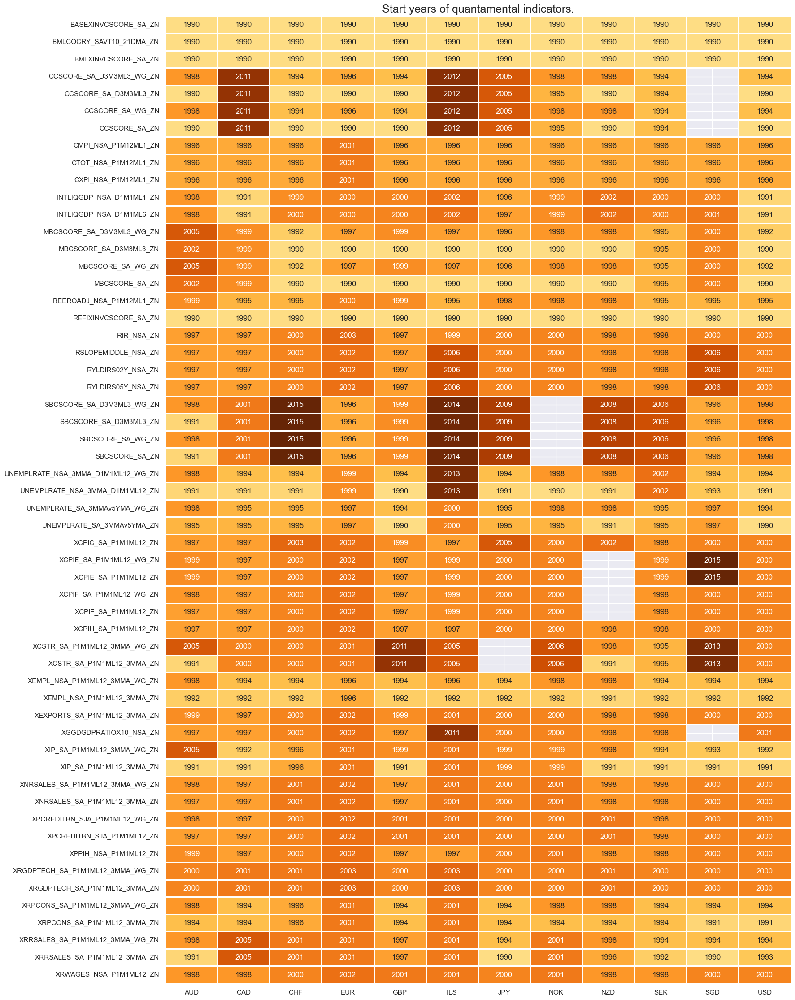

In [12]:
# Visualize remaining macroeconomic categories
msm.check_availability(df, xcats=macroz, cids=cids_eq, missing_recent=False)

### Conditional imputation of missing cross-sections

In [13]:
# Impute cross-sectional values if majority of cross sections are available

# Set parameters
impute_missing_cids = True
min_ratio_cids = 0.4

# Exclude categories than cannot logically be imputed
non_imputables = [
    "CXPI_NSA_P1M12ML1_ZN",
    "CMPI_NSA_P1M12ML1_ZN",
    "CTOT_NSA_P1M12ML1_ZN",
    "REEROADJ_NSA_P1M12ML1_ZN",
]
imputables = list(set(macroz) - set(non_imputables))

if impute_missing_cids:
    df_impute = msp.impute_panel(
        df=df, xcats=imputables, cids=cids_eq, threshold=min_ratio_cids
    )
    dfx = msm.update_df(df, df_impute)
else:
    dfx = df.copy()

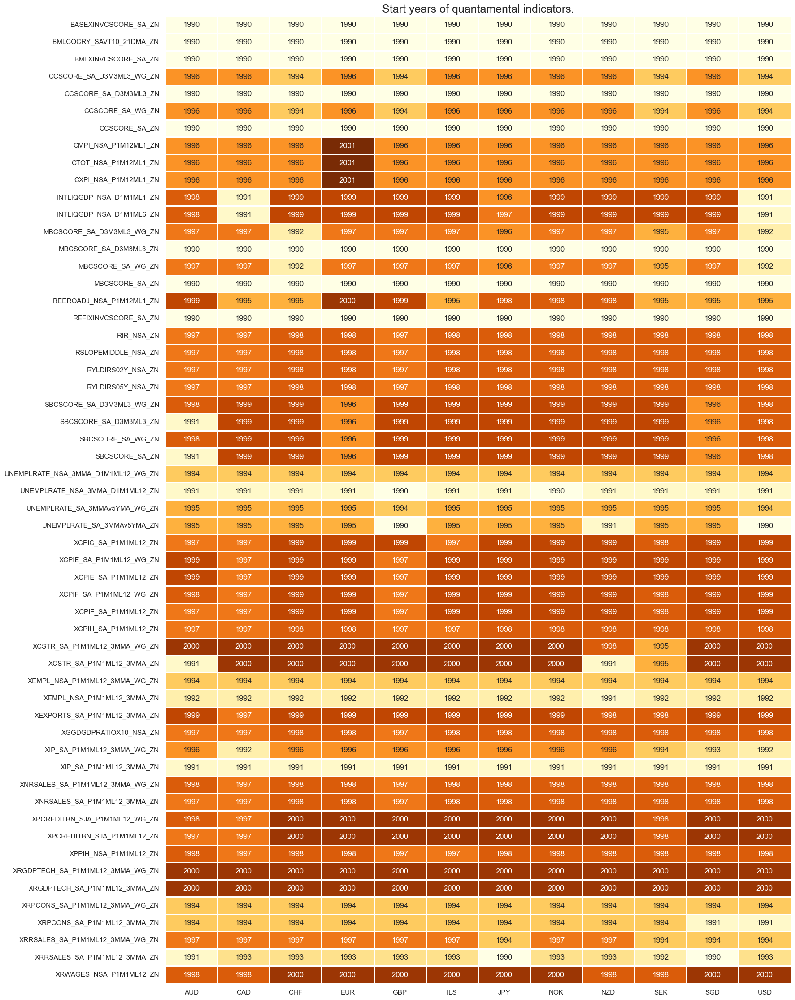

In [14]:
# Visualize imputed macroeconomic categories
msm.check_availability(dfx, xcats=macroz, cids=cids_eq, missing_recent=False)

### Equity sectoral return blacklisting

In [15]:
sector_blacklist = {}

for sec in list(set(cids_secs) - {"ALL"}):
    
    dfb = df[df["xcat"] == f"EQC{sec}UNTRADABLE_NSA"].loc[:, ["cid", "xcat", "real_date", "value"]]
    dfba = (
        dfb.groupby(["cid", "real_date"])
        .aggregate(value=pd.NamedAgg(column="value", aggfunc="max"))
        .reset_index()
    )
    dfba["xcat"] = f"EQC{sec}BLACK"
    
    sector_blacklist[sec] = msp.make_blacklist(dfba, f"EQC{sec}BLACK")

## Visualize target availability

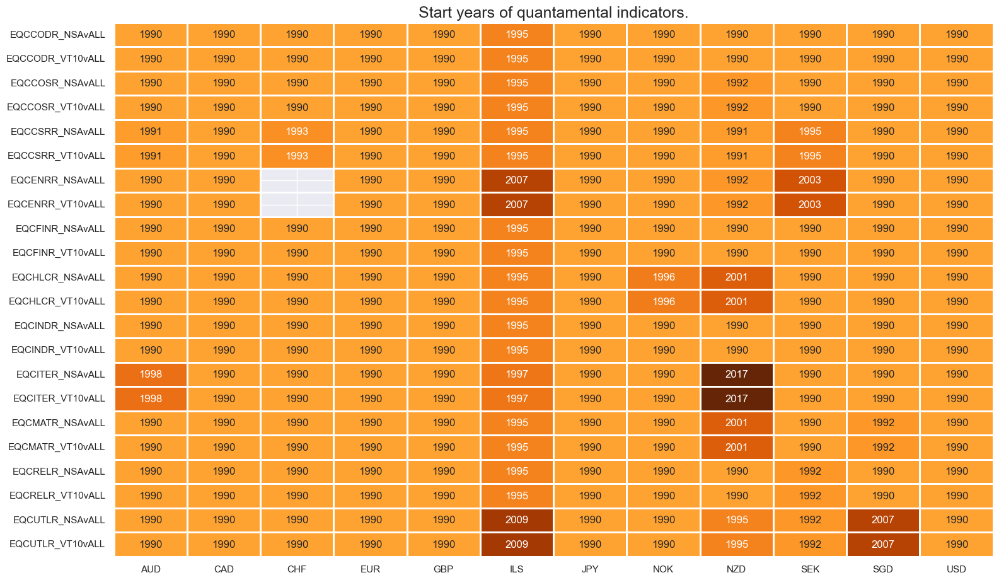

In [16]:
targets = [
    x for x in eqrets if x.endswith(("R_NSAvALL", "R_VT10vALL"))
]
msm.check_availability(dfx, targets, missing_recent=False)

## Sectoral signals and naive PnLs

### Common pipeline for all sectors

In [17]:
default_target_type = "R_VT10vALL"

default_splitter = {"Expanding": msl.ExpandingKFoldPanelSplit(n_splits=3)}
default_metric = {"Sharpe": make_scorer(msl.sharpe_ratio, greater_is_better=True)}

# Model dictionary
default_models = {
        "ols": Pipeline(
          [
              ("selector", msl.LarsSelector()),
              ("predictor", msl.ModifiedLinearRegression(method = "analytic")),
          ]
        ),
        "swls": Pipeline(
          [
              ("selector", msl.LarsSelector()),
              ("predictor", msl.ModifiedSignWeightedLinearRegression(method = "analytic")),
          ]
        ),
        "twls": Pipeline(
          [
              ("selector", msl.LarsSelector()),
              ("predictor", msl.ModifiedTimeWeightedLinearRegression(method = "analytic")),
          ]
        ),
    }

# Hyperparameter grid   
default_hparam_grid = {
    "ols": {
        "selector__n_factors": [3, 5, 10],
        "predictor__fit_intercept": [True, False]
    },
    "swls": {
        "selector__n_factors": [3, 5, 10],
        "predictor__fit_intercept": [True, False]
    },
    "twls": {
       "selector__n_factors": [3, 5, 10],
       "predictor__fit_intercept": [True, False],
       "predictor__half_life": [12, 24, 36, 60],
    },
}


# Default parameters
default_test_size = 3  # retraining interval in months
default_min_cids = 2  # minimum number of cids to start predicting
default_min_periods = 24  # minimum number of periods to start predicting
default_split_functions = {"Expanding": lambda n: n // 24}
#default_threshold_ndates = 24 # number of rebalancing dates to pass before incrementing the number of CV splits
#default_initial_nsplits = 3 # initial number of cross-validation splits
default_start_date = "2003-01-31"  # start date for the analysis

### Energy

#### Factor selection and signal generation

In [18]:
sector = "ENR"

enr_dict = {
    "sector_name": sector_labels[sector],
    "signal_name": f"{sector}SOL",
    "pnl_name": f"{sector_labels[sector]} learning-based signal",
    "xcatx": macroz,
    "cidx": list(set(cids_eq)-set(["CHF"])), # CHF has no energy companies
    "ret": f"EQC{sector}{default_target_type}",
    "freq": "M",
    "black": sector_blacklist[sector],
    "srr": None,
    "pnls": None,
}

In [19]:
xcatx = enr_dict["xcatx"] + [enr_dict["ret"]]
cidx = enr_dict["cidx"]

so_enr = msl.SignalOptimizer(
    df = dfx,
    xcats = xcatx,
    cids = cidx,
    blacklist = enr_dict["black"],
    freq = enr_dict["freq"],
    lag = 1,
    xcat_aggs=["last", "sum"],
)

  0%|          | 0/89 [00:00<?, ?it/s]

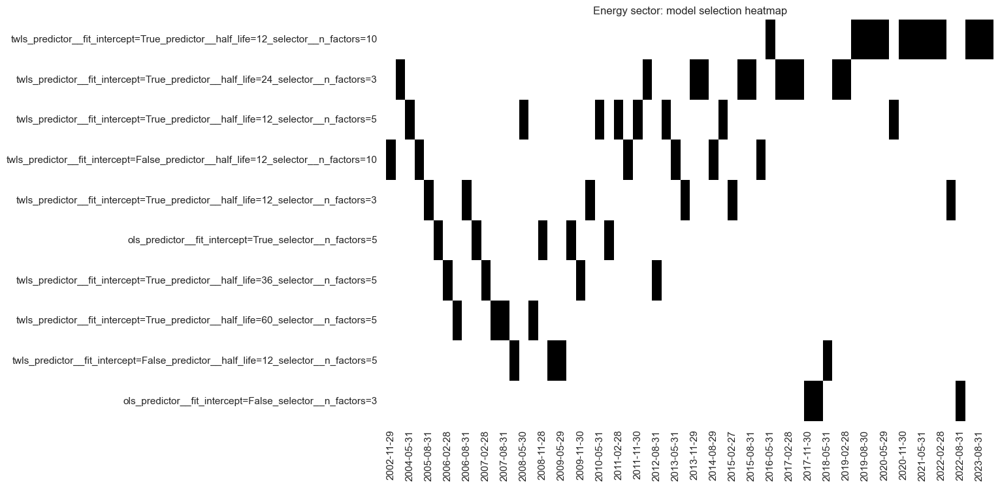

In [20]:
secname = enr_dict["sector_name"]
signal_name = enr_dict["signal_name"]


so_enr.calculate_predictions(
    name=signal_name,
    models=default_models,
    scorers=default_metric,
    hyperparameters=default_hparam_grid,
    inner_splitters = default_splitter,
    test_size=default_test_size,
    min_cids=default_min_cids, 
    min_periods=default_min_periods,
    n_jobs_outer=-1,
    split_functions=default_split_functions,
)
so_enr.models_heatmap(
    signal_name,
    cap=10,
    title=f"{secname} sector: model selection heatmap",
)

# Store signals
dfa = so_enr.get_optimized_signals()
dfx = msm.update_df(dfx, dfa)

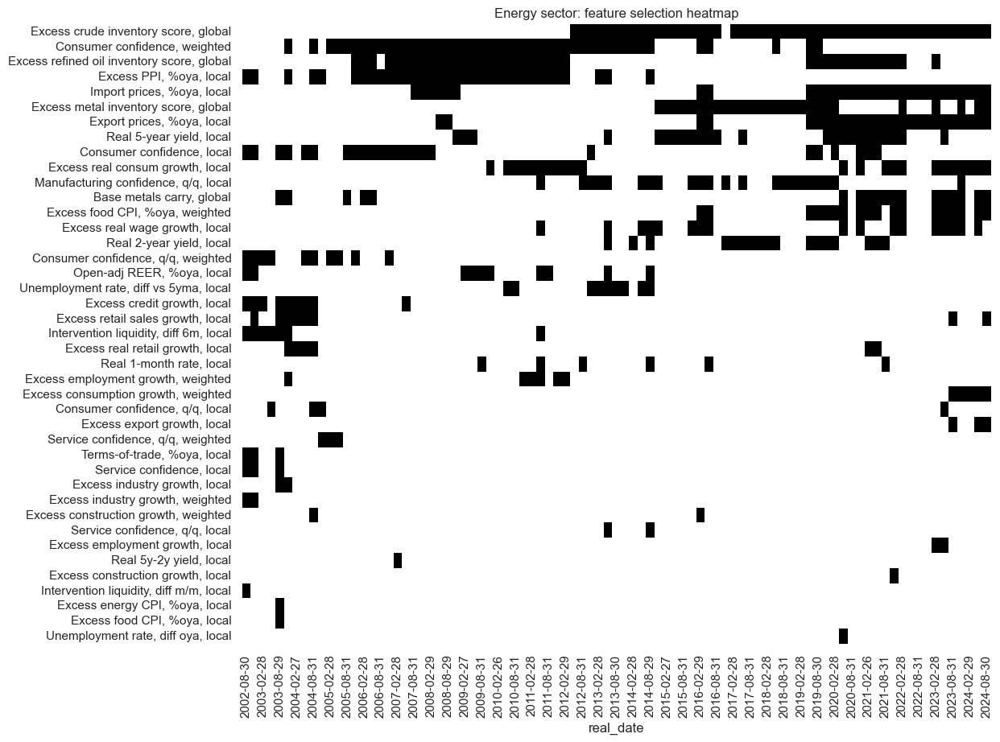

In [21]:
xcatx = enr_dict["signal_name"]
secname = enr_dict["sector_name"]

so_enr.feature_selection_heatmap(
    xcatx,
    remove_blanks=True,
    title=f"{secname} sector: feature selection heatmap",
    ftrs_renamed=cat_label_dict,
    figsize=(12, 10),
)

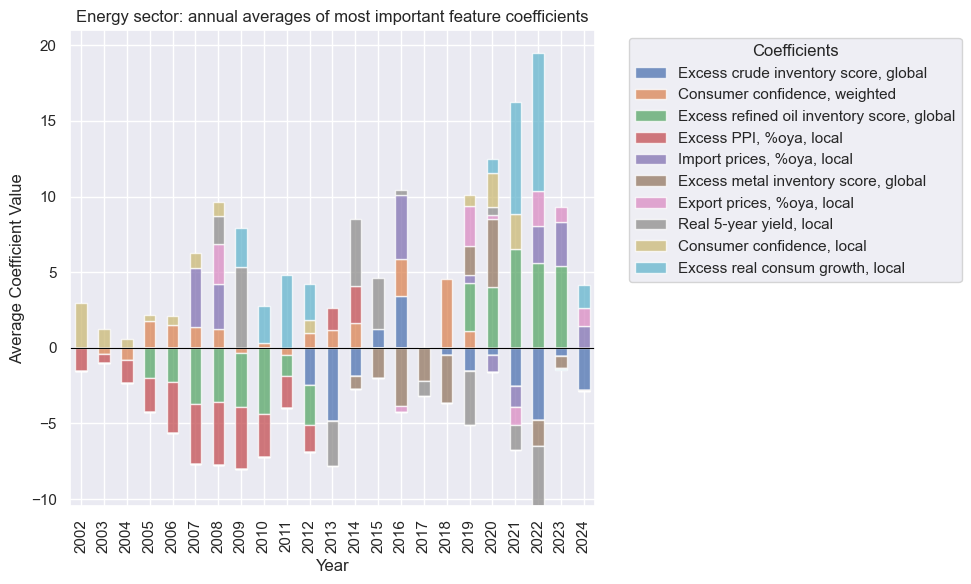

In [22]:
xcatx = enr_dict["signal_name"]
secname = enr_dict["sector_name"]

so_enr.coefs_stackedbarplot(
    name=xcatx,
    ftrs_renamed=cat_label_dict,
    title=f"{secname} sector: annual averages of most important feature coefficients",
)

#### Signal quality check

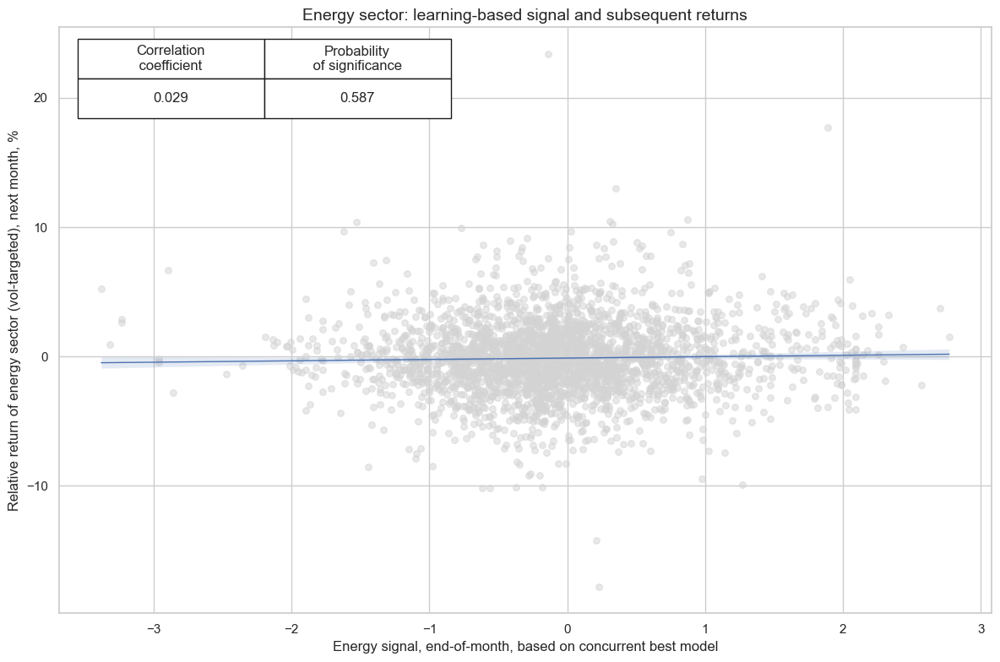

In [23]:
xcatx = [enr_dict["signal_name"], enr_dict["ret"]]
cidx = enr_dict["cidx"]
secname = enr_dict["sector_name"]

cr_enr = msp.CategoryRelations(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    freq=enr_dict["freq"],
    lag=1,
    blacklist = enr_dict["black"],
    xcat_aggs=["last", "sum"],
    slip=1,
    xcat_trims=[30, 30],  # trim dodgy data point
)

cr_enr.reg_scatter(
    title=f"{secname} sector: learning-based signal and subsequent returns",
    labels=False,
    prob_est="map",
    xlab=f"{secname} signal, end-of-month, based on concurrent best model",
    ylab=f"Relative return of {secname.lower()} sector (vol-targeted), next month, %",
    coef_box="upper left",
    size=(12, 8),
)

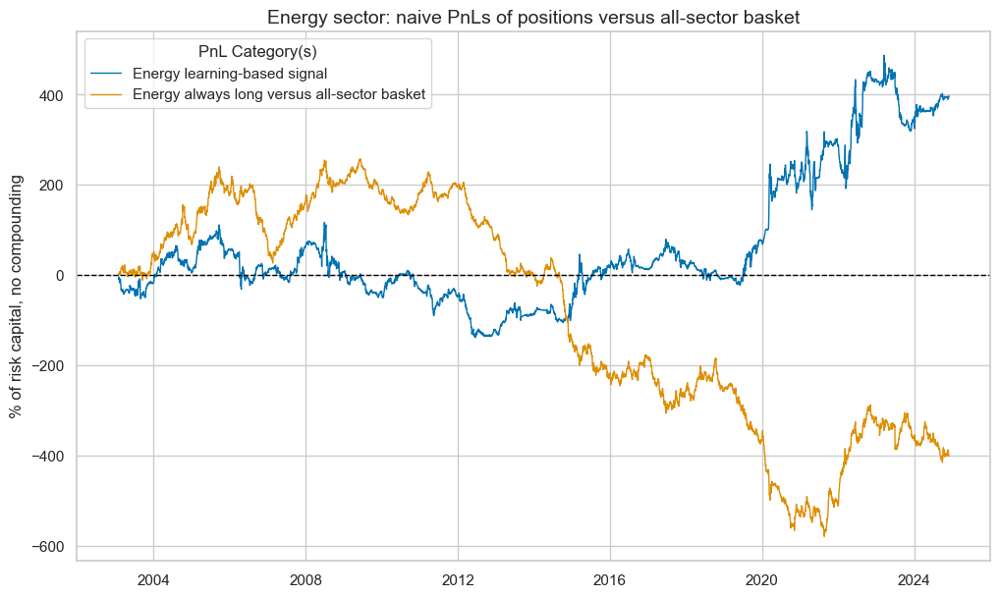

xcat,Energy learning-based signal,Energy always long versus all-sector basket
Return %,18.193195,-18.406846
St. Dev. %,67.730761,52.984726
Sharpe Ratio,0.268611,-0.347399
Sortino Ratio,0.385311,-0.47721
Max 21-Day Draw %,-123.365164,-78.404808
Max 6-Month Draw %,-152.180947,-186.69396
Peak to Trough Draw %,-255.149725,-837.214078
Top 5% Monthly PnL Share,1.77158,-1.418463
USD_EQXR_NSA correl,-0.080132,-0.046463
Traded Months,263,263


In [24]:
xcatx = [enr_dict["signal_name"]]
cidx = enr_dict["cidx"]
secname = enr_dict["sector_name"]

pnl_enr = msn.NaivePnL(
    df=dfx,
    ret=enr_dict["ret"],
    sigs=xcatx,
    cids=cidx,
    start=default_start_date,
    blacklist=enr_dict["black"],
    bms=["USD_EQXR_NSA"],
)

for xcat in xcatx:
    pnl_enr.make_pnl(
        sig=xcat,
        sig_op="zn_score_pan",
        rebal_freq="monthly",
        neutral="zero",
        rebal_slip=1,
        vol_scale = None,
        thresh=3,
        pnl_name=enr_dict["pnl_name"],
    )
pnl_enr.make_long_pnl(
    vol_scale=None, label=f"{secname} always long versus all-sector basket"
)

pnl_enr.plot_pnls(
    pnl_cats=pnl_enr.pnl_names,
    title=f"{secname} sector: naive PnLs of positions versus all-sector basket",
    title_fontsize=14
)

enr_dict["pnls"] = pnl_enr
pnl_enr.evaluate_pnls(pnl_cats=pnl_enr.pnl_names)

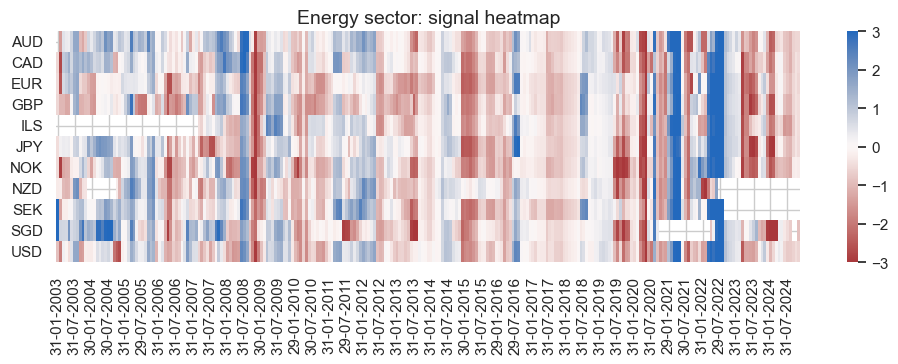

In [25]:
secname = enr_dict["sector_name"]

pnl_enr.signal_heatmap(
    pnl_name=enr_dict["pnl_name"],
    figsize=(12, 3),
    title=f"{secname} sector: signal heatmap",
)

### Materials

#### Factor selection and signal generation

In [26]:
sector = "MAT"

mat_dict = {
    "sector_name": sector_labels[sector],
    "signal_name": f"{sector}SOL",
    "pnl_name": f"{sector_labels[sector]} learning-based signal",
    "xcatx": macroz,
    "cidx": cids_eq, 
    "ret": f"EQC{sector}{default_target_type}",
    "freq": "M",
    "black": sector_blacklist[sector],
    "srr": None,
    "pnls": None,
}

In [27]:
xcatx = mat_dict["xcatx"] + [mat_dict["ret"]]
cidx = mat_dict["cidx"]

so_mat = msl.SignalOptimizer(
    df = dfx,
    xcats = xcatx,
    cids = cidx,
    blacklist = mat_dict["black"],
    freq = mat_dict["freq"],
    lag = 1,
    xcat_aggs=["last", "sum"],
)

  0%|          | 0/89 [00:00<?, ?it/s]

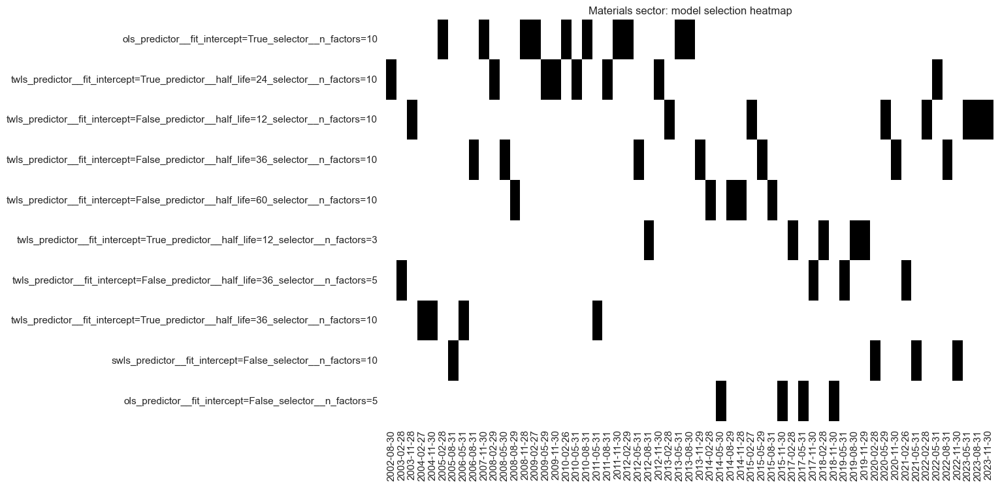

In [28]:
secname = mat_dict["sector_name"]
signal_name = mat_dict["signal_name"]


so_mat.calculate_predictions(
    name=signal_name,
    models=default_models,
    scorers=default_metric,
    hyperparameters=default_hparam_grid,
    inner_splitters = default_splitter,
    test_size=default_test_size,
    min_cids=default_min_cids, 
    min_periods=default_min_periods,
    n_jobs_outer=-1,
    split_functions=default_split_functions,
)
so_mat.models_heatmap(
    signal_name,
    cap=10,
    title=f"{secname} sector: model selection heatmap",
)

# Store signals
dfa = so_mat.get_optimized_signals()
dfx = msm.update_df(dfx, dfa)

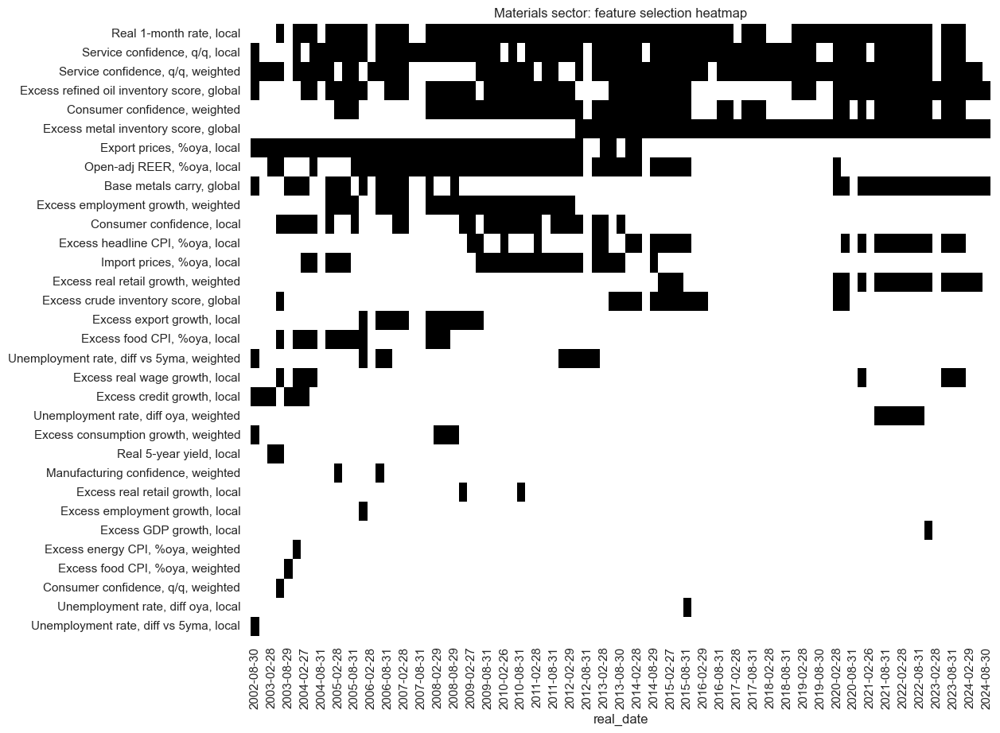

In [29]:
xcatx = mat_dict["signal_name"]
secname = mat_dict["sector_name"]

so_mat.feature_selection_heatmap(
    xcatx,
    remove_blanks=True,
    title=f"{secname} sector: feature selection heatmap",
    ftrs_renamed=cat_label_dict,
    figsize=(12, 10),
)

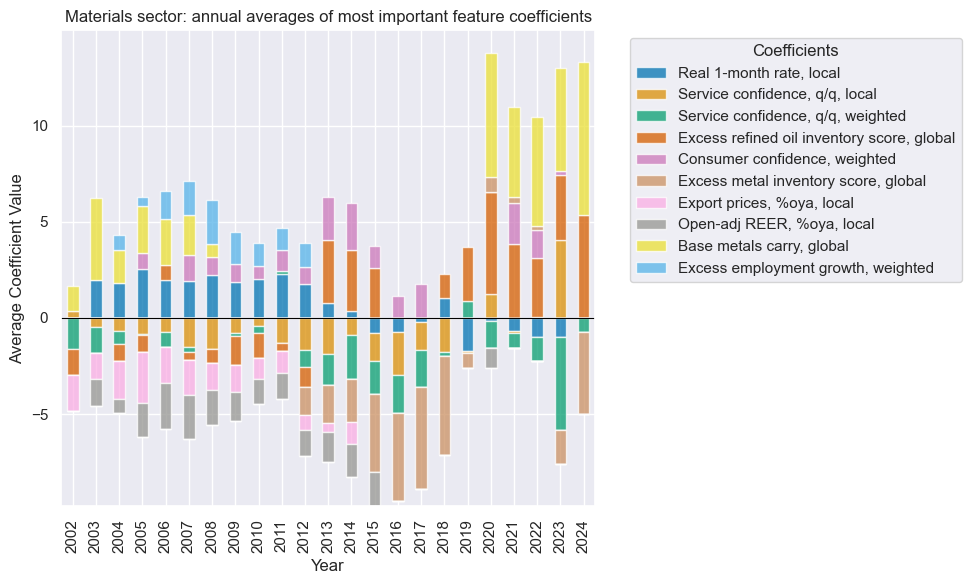

In [30]:
xcatx = mat_dict["signal_name"]
secname = mat_dict["sector_name"]

so_mat.coefs_stackedbarplot(
    name=xcatx,
    ftrs_renamed=cat_label_dict,
    title=f"{secname} sector: annual averages of most important feature coefficients",
)

#### Signal quality check

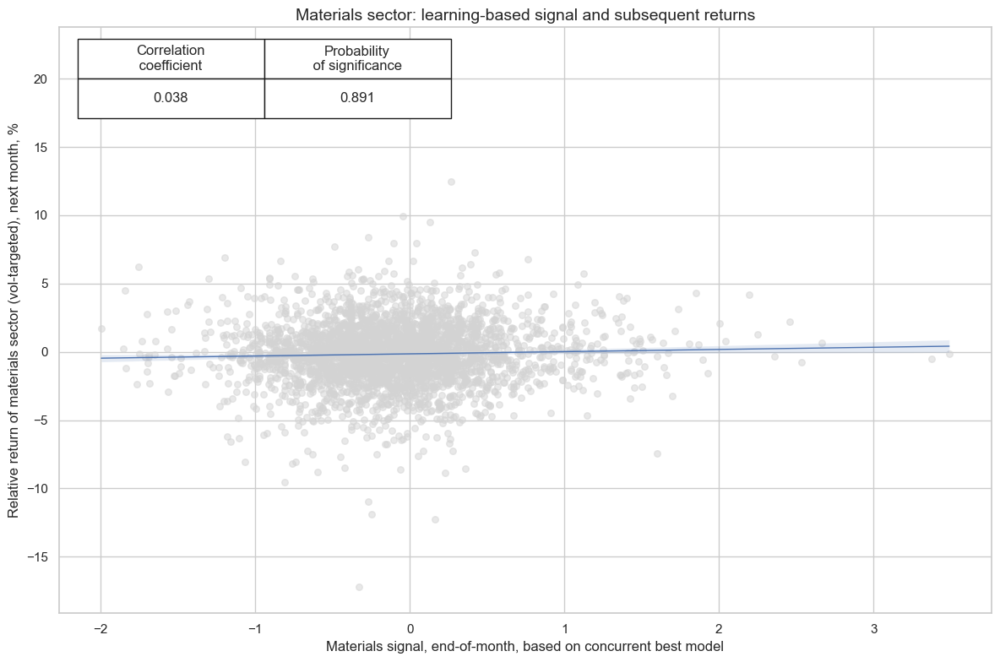

In [31]:
xcatx = [mat_dict["signal_name"], mat_dict["ret"]]
cidx = mat_dict["cidx"]
secname = mat_dict["sector_name"]

cr_mat = msp.CategoryRelations(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    freq=mat_dict["freq"],
    blacklist=mat_dict["black"],
    lag=1,
    xcat_aggs=["last", "sum"],
    slip=1,
)

cr_mat.reg_scatter(
    title=f"{secname} sector: learning-based signal and subsequent returns",
    labels=False,
    prob_est="map",
    xlab=f"{secname} signal, end-of-month, based on concurrent best model",
    ylab=f"Relative return of {secname.lower()} sector (vol-targeted), next month, %",
    coef_box="upper left",
    size=(12, 8),
)

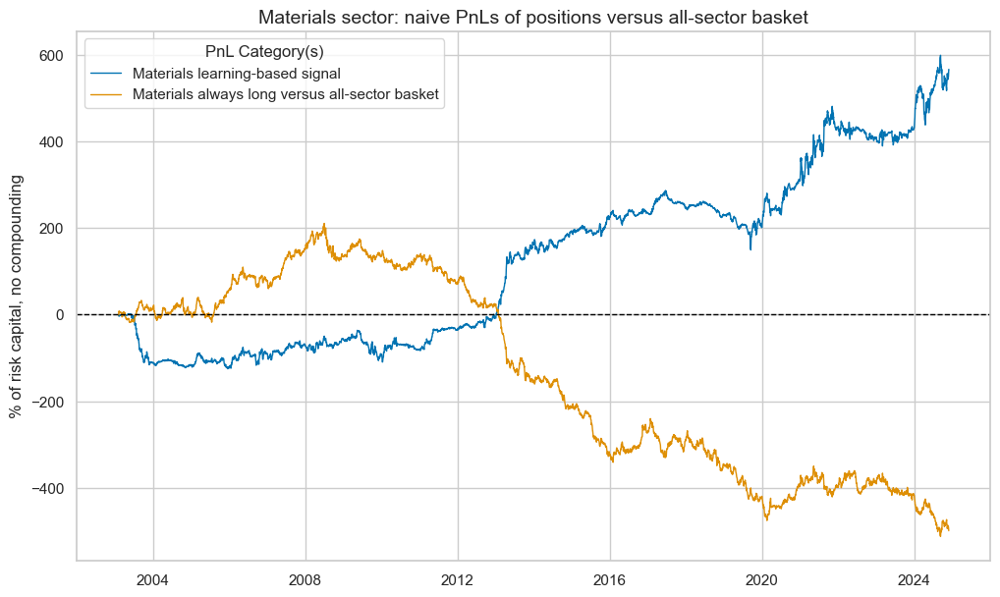

xcat,Materials learning-based signal,Materials always long versus all-sector basket
Return %,25.973199,-22.888695
St. Dev. %,47.2663,40.064396
Sharpe Ratio,0.549508,-0.571298
Sortino Ratio,0.809036,-0.783012
Max 21-Day Draw %,-73.752503,-61.657388
Max 6-Month Draw %,-117.635772,-152.838949
Peak to Trough Draw %,-137.181085,-723.482521
Top 5% Monthly PnL Share,0.961768,-0.710606
USD_EQXR_NSA correl,-0.018983,0.025908
Traded Months,263,263


In [32]:
xcatx = [mat_dict["signal_name"]]
cidx = mat_dict["cidx"]
secname = mat_dict["sector_name"]
pnl_name=mat_dict["pnl_name"]

pnl_mat = msn.NaivePnL(
    df=dfx,
    ret=mat_dict["ret"],
    sigs=xcatx,
    cids=cidx,
    start=default_start_date,
    blacklist=mat_dict["black"],
    bms=["USD_EQXR_NSA"],
)

for xcat in xcatx:
    pnl_mat.make_pnl(
        sig=xcat,
        sig_op="zn_score_pan",
        rebal_freq="monthly",
        neutral="zero",
        rebal_slip=1,
        vol_scale=None,
        thresh=3,
        pnl_name=pnl_name,
    )
pnl_mat.make_long_pnl(
    vol_scale=None, label=f"{secname} always long versus all-sector basket"
)

pnl_mat.plot_pnls(
    pnl_cats=pnl_mat.pnl_names,
    title=f"{secname} sector: naive PnLs of positions versus all-sector basket",
    title_fontsize=14
)

mat_dict["pnls"] = pnl_mat
pnl_mat.evaluate_pnls(pnl_cats=pnl_mat.pnl_names)

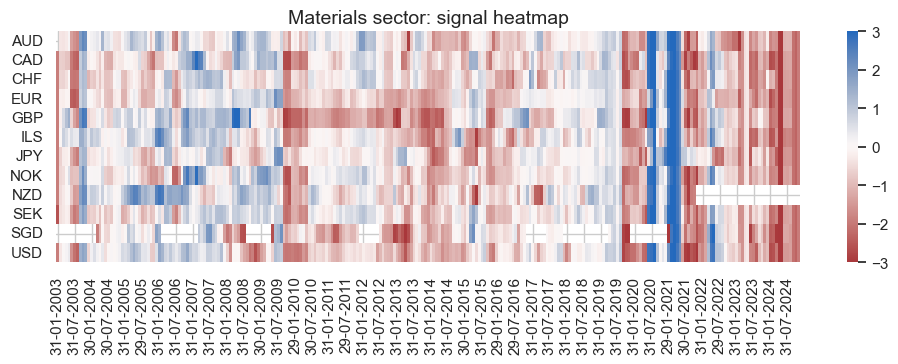

In [33]:
secname = mat_dict["sector_name"]
xcatx = mat_dict["signal_name"]

pnl_mat.signal_heatmap(
    pnl_name=f"{secname} learning-based signal",
    figsize=(12, 3),
    title=f"{secname} sector: signal heatmap",
)

### Industrials

#### Factor selection and signal generation

In [34]:
sector = "IND"

ind_dict = {
    "sector_name": sector_labels[sector],
    "signal_name": f"{sector}SOL",
    "pnl_name": f"{sector_labels[sector]} learning-based signal",
    "xcatx": macroz,
    "cidx": cids_eq,
    "ret": f"EQC{sector}{default_target_type}",
    "freq": "M",
    "black": sector_blacklist[sector],
    "srr": None,
    "pnls": None,
}

In [35]:
xcatx = ind_dict["xcatx"] + [ind_dict["ret"]]
cidx = ind_dict["cidx"]

so_ind = msl.SignalOptimizer(
    df = dfx,
    xcats = xcatx,
    cids = cidx,
    blacklist = ind_dict["black"],
    freq = ind_dict["freq"],
    lag = 1,
    xcat_aggs=["last", "sum"],
)

  0%|          | 0/89 [00:00<?, ?it/s]

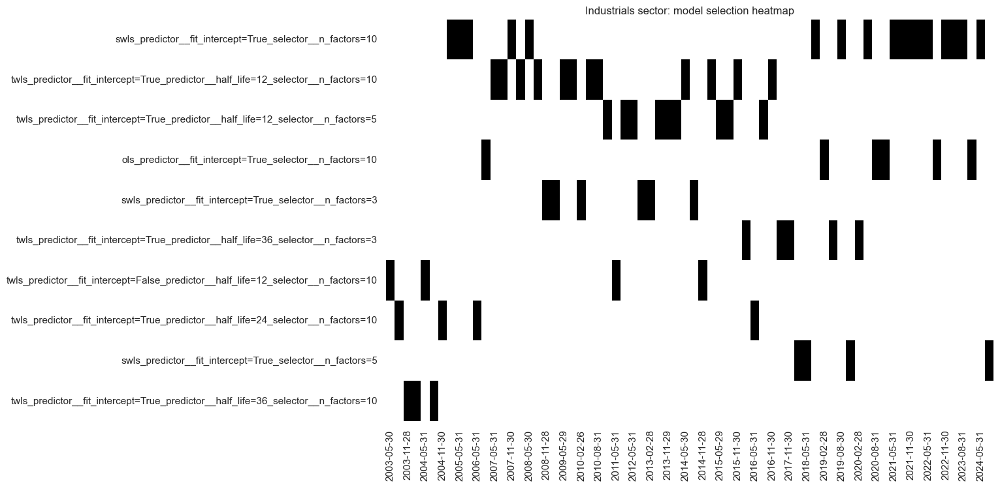

In [36]:
secname = ind_dict["sector_name"]
signal_name = ind_dict["signal_name"]


so_ind.calculate_predictions(
    name=signal_name,
    models=default_models,
    scorers=default_metric,
    hyperparameters=default_hparam_grid,
    inner_splitters = default_splitter,
    test_size=default_test_size,
    min_cids=default_min_cids, 
    min_periods=default_min_periods,
    n_jobs_outer=-1,
    split_functions=default_split_functions,
)
so_ind.models_heatmap(
    signal_name,
    cap=10,
    title=f"{secname} sector: model selection heatmap",
)

# Store signals
dfa = so_ind.get_optimized_signals()
dfx = msm.update_df(dfx, dfa)

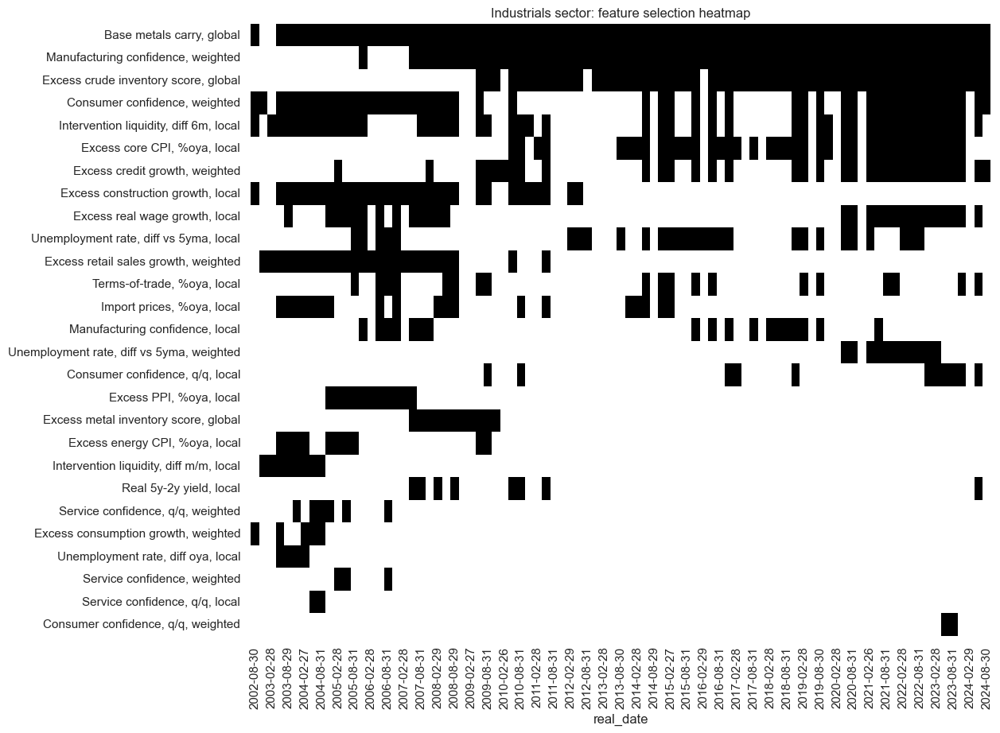

In [37]:
secname = ind_dict["sector_name"]
xcatx = ind_dict["signal_name"]

so_ind.feature_selection_heatmap(
    xcatx,
    remove_blanks=True,
    title=f"{secname} sector: feature selection heatmap",
    ftrs_renamed=cat_label_dict,
    figsize=(12, 10),
)

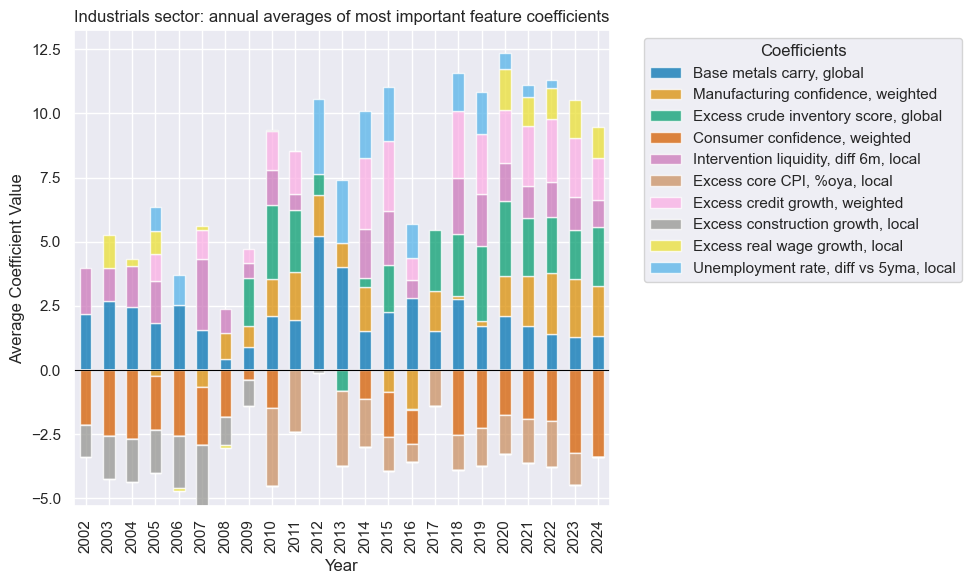

In [38]:
secname = ind_dict["sector_name"]
xcatx = ind_dict["signal_name"]

so_ind.coefs_stackedbarplot(
    name=xcatx,
    ftrs_renamed=cat_label_dict,
    title=f"{secname} sector: annual averages of most important feature coefficients",
)

#### Signal quality check

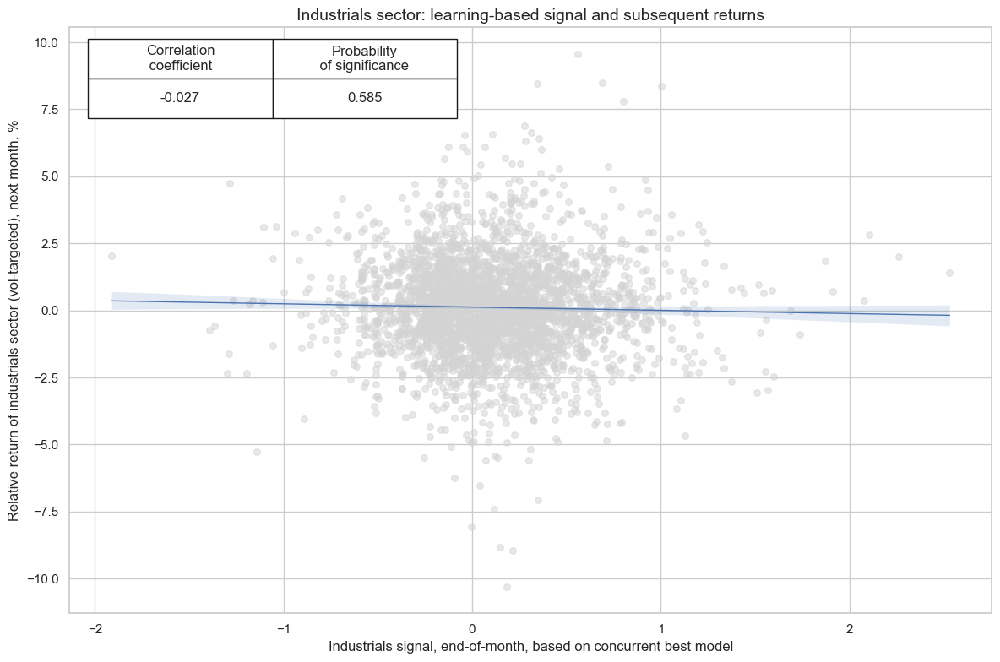

In [39]:
xcatx = [ind_dict["signal_name"], ind_dict["ret"]]
cidx = ind_dict["cidx"]
secname = ind_dict["sector_name"]

cr_ind = msp.CategoryRelations(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    freq=ind_dict["freq"],
    blacklist=ind_dict["black"],
    lag=1,
    xcat_aggs=["last", "sum"],
    slip=1,
)

cr_ind.reg_scatter(
    title=f"{secname} sector: learning-based signal and subsequent returns",
    labels=False,
    prob_est="map",
    xlab=f"{secname} signal, end-of-month, based on concurrent best model",
    ylab=f"Relative return of {secname.lower()} sector (vol-targeted), next month, %",
    coef_box="upper left",
    size=(12, 8),
)

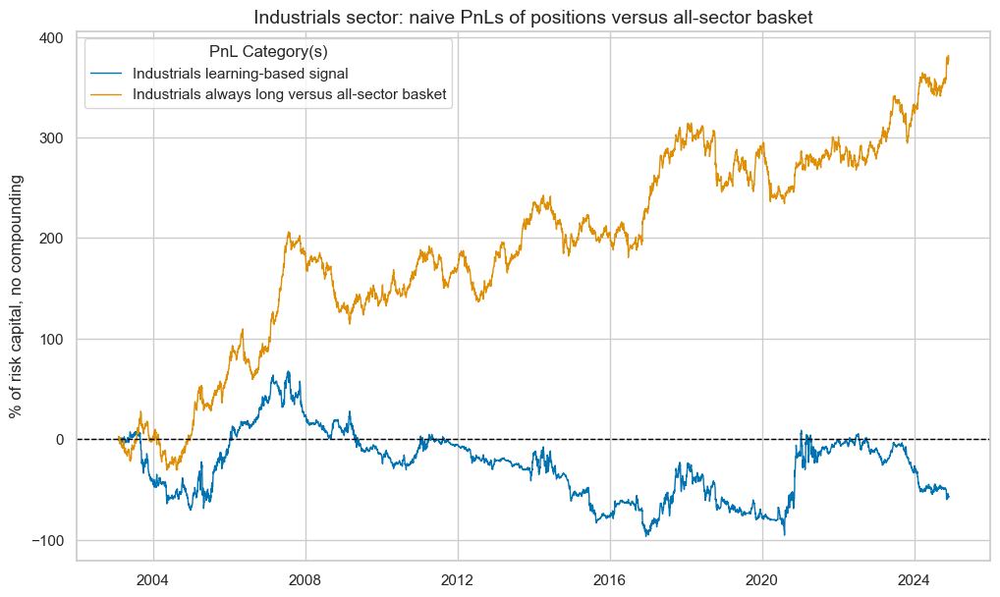

xcat,Industrials learning-based signal,Industrials always long versus all-sector basket
Return %,-2.619157,17.250604
St. Dev. %,28.243689,31.670945
Sharpe Ratio,-0.092734,0.544682
Sortino Ratio,-0.13157,0.775381
Max 21-Day Draw %,-39.076913,-54.172009
Max 6-Month Draw %,-55.204975,-63.203195
Peak to Trough Draw %,-164.488694,-91.886853
Top 5% Monthly PnL Share,-5.457844,0.854147
USD_EQXR_NSA correl,0.014874,0.266474
Traded Months,263,263


In [40]:
xcatx = [ind_dict["signal_name"]]
cidx = ind_dict["cidx"]
secname = ind_dict["sector_name"]
pnl_name = ind_dict["pnl_name"]

pnl_ind = msn.NaivePnL(
    df=dfx,
    ret=ind_dict["ret"],
    sigs=xcatx,
    cids=cidx,
    start=default_start_date,
    bms=["USD_EQXR_NSA"],
    blacklist = ind_dict["black"],
)

for xcat in xcatx:
    pnl_ind.make_pnl(
        sig=xcat,
        sig_op="zn_score_pan",
        rebal_freq="monthly",
        neutral="zero",
        rebal_slip=1,
        vol_scale = None,
        thresh=3,
        pnl_name=pnl_name,
    )

    pnl_ind.make_long_pnl(
    vol_scale=None, label=f"{secname} always long versus all-sector basket"
)

pnl_ind.plot_pnls(
    pnl_cats=pnl_ind.pnl_names,
    title=f"{secname} sector: naive PnLs of positions versus all-sector basket",
    title_fontsize=14
)

ind_dict["pnls"] = pnl_ind
pnl_ind.evaluate_pnls(pnl_cats=pnl_ind.pnl_names)

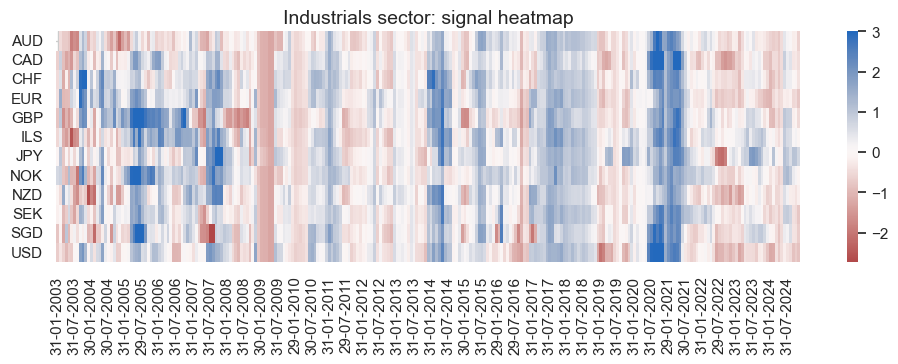

In [41]:
xcatx = ind_dict["signal_name"]
pnl_ind.signal_heatmap(
    pnl_name=f"{secname} learning-based signal",
    figsize=(12, 3),
    title=f"{secname} sector: signal heatmap",
)

### Consumer discretionary

#### Factor selection and signal generation

In [42]:
sector = "COD"

cod_dict = {
    "sector_name": sector_labels[sector],
    "signal_name": f"{sector}SOL",
    "pnl_name": f"{sector_labels[sector]} learning-based signal",
    "xcatx": macroz,
    "cidx": cids_eq,
    "ret": f"EQC{sector}{default_target_type}",
    "freq": "M",
    "black": sector_blacklist[sector],
    "srr": None,
    "pnls": None,
}

In [43]:
xcatx = cod_dict["xcatx"] + [cod_dict["ret"]]
cidx = cod_dict["cidx"]

so_cod = msl.SignalOptimizer(
    df = dfx,
    xcats = xcatx,
    cids = cidx,
    blacklist = cod_dict["black"],
    freq = cod_dict["freq"],
    lag = 1,
    xcat_aggs=["last", "sum"],
)

  0%|          | 0/89 [00:00<?, ?it/s]

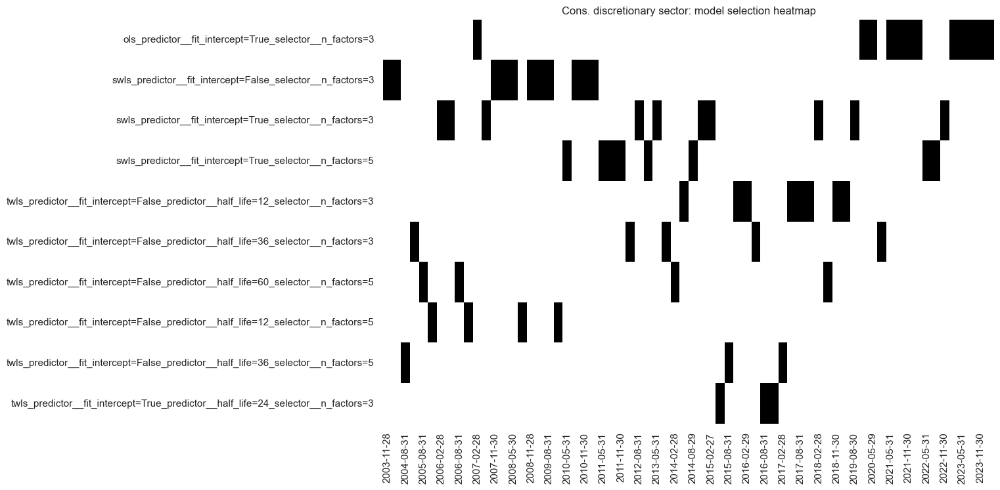

In [44]:
secname = cod_dict["sector_name"]
signal_name = cod_dict["signal_name"]


so_cod.calculate_predictions(
    name=signal_name,
    models=default_models,
    scorers=default_metric,
    hyperparameters=default_hparam_grid,
    inner_splitters = default_splitter,
    test_size=default_test_size,
    min_cids=default_min_cids, 
    min_periods=default_min_periods,
    n_jobs_outer=-1,
    split_functions=default_split_functions,
)
so_cod.models_heatmap(
    signal_name,
    cap=10,
    title=f"{secname} sector: model selection heatmap",
)

# Store signals
dfa = so_cod.get_optimized_signals()
dfx = msm.update_df(dfx, dfa)

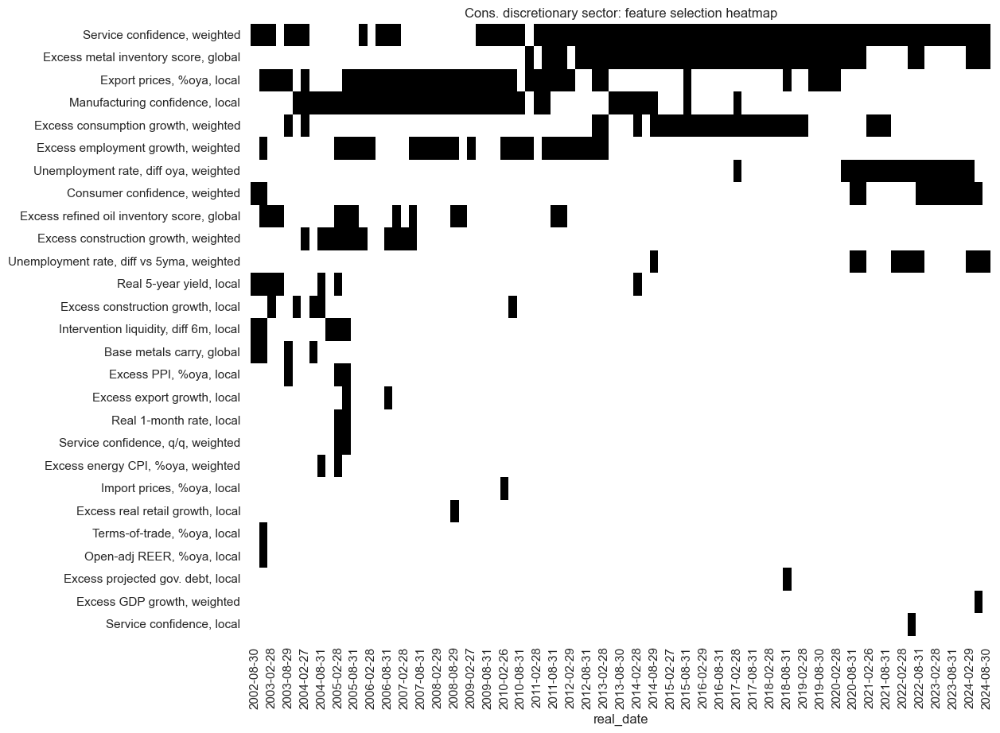

In [45]:
xcatx = cod_dict["signal_name"]
secname = cod_dict["sector_name"]

so_cod.feature_selection_heatmap(
    xcatx,
    remove_blanks=True,
    title=f"{secname} sector: feature selection heatmap",
    ftrs_renamed=cat_label_dict,
    figsize=(12, 10),
)

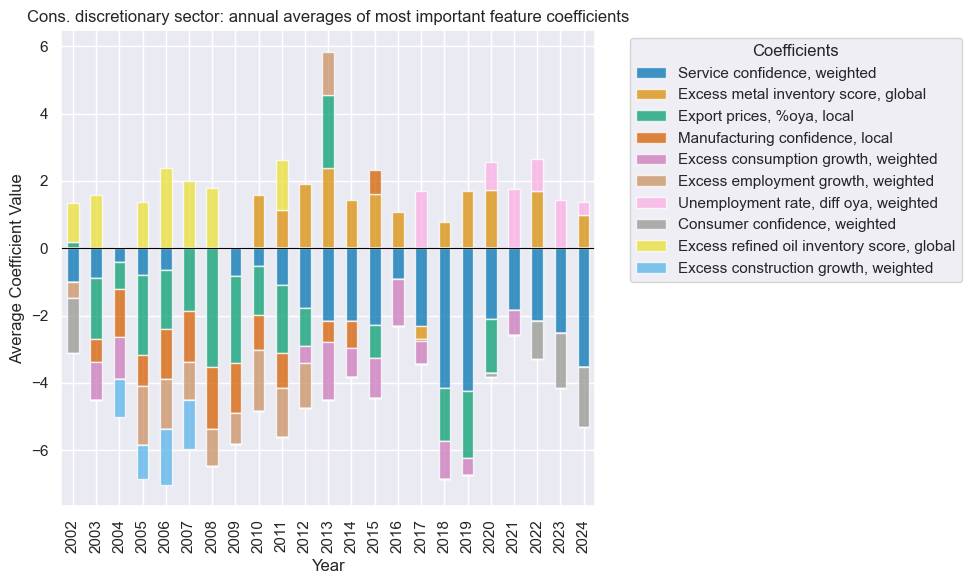

In [46]:
xcatx = cod_dict["signal_name"]
secname = cod_dict["sector_name"]

so_cod.coefs_stackedbarplot(
    name=xcatx,
    ftrs_renamed=cat_label_dict,
    title=f"{secname} sector: annual averages of most important feature coefficients",
)

#### Signal quality check

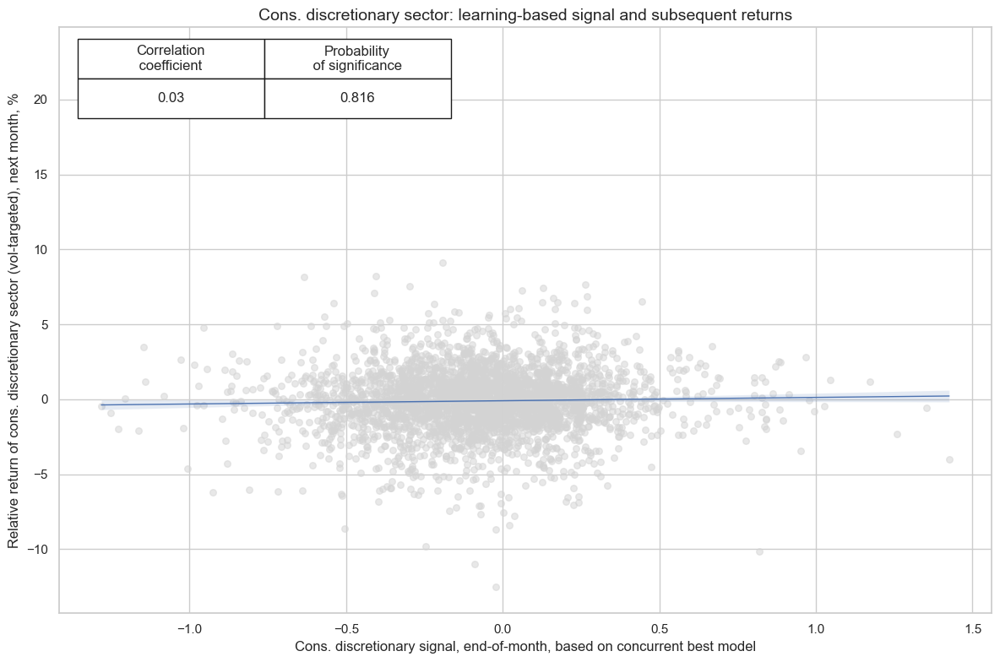

In [47]:
xcatx = [cod_dict["signal_name"], cod_dict["ret"]]
cidx = cod_dict["cidx"]
signal_name = cod_dict["signal_name"]

cr_cod = msp.CategoryRelations(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    freq=cod_dict["freq"],
    blacklist = cod_dict["black"],
    lag=1,
    xcat_aggs=["last", "sum"],
    slip=1,
)

cr_cod.reg_scatter(
    title=f"{secname} sector: learning-based signal and subsequent returns",
    labels=False,
    prob_est="map",
    xlab=f"{secname} signal, end-of-month, based on concurrent best model",
    ylab=f"Relative return of {secname.lower()} sector (vol-targeted), next month, %",
    coef_box="upper left",
    size=(12, 8),
)

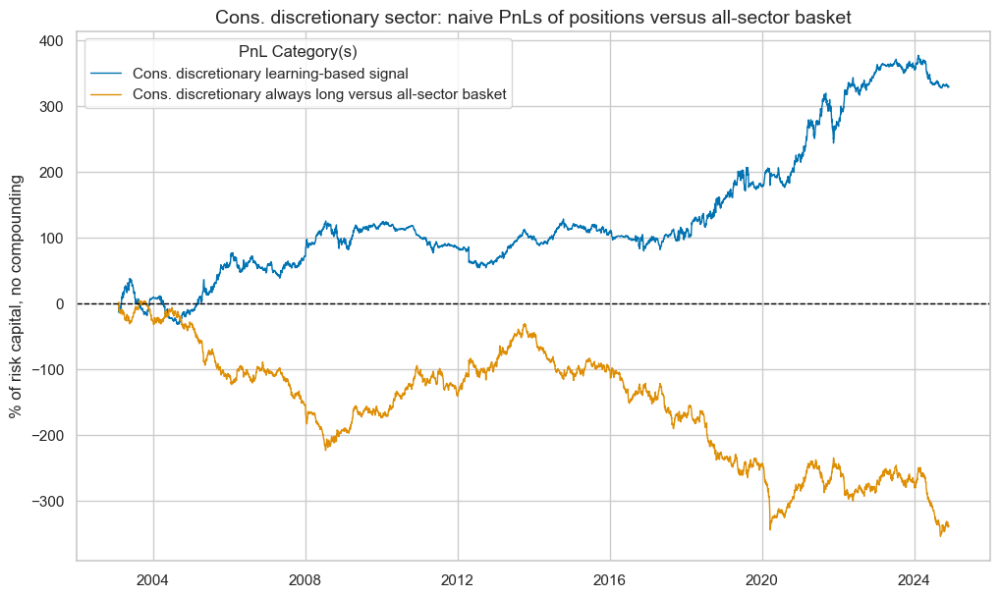

xcat,Cons. discretionary learning-based signal,Cons. discretionary always long versus all-sector basket
Return %,15.116939,-15.540605
St. Dev. %,29.846915,31.260424
Sharpe Ratio,0.506482,-0.497134
Sortino Ratio,0.715244,-0.687177
Max 21-Day Draw %,-50.727988,-68.480798
Max 6-Month Draw %,-49.162342,-96.360886
Peak to Trough Draw %,-75.936448,-358.531109
Top 5% Monthly PnL Share,0.90696,-0.755639
USD_EQXR_NSA correl,-0.020859,0.095807
Traded Months,263,263


In [48]:
xcatx = [cod_dict["signal_name"]]
cidx = cod_dict["cidx"]
secname = cod_dict["sector_name"]
signal_name = cod_dict["signal_name"]
pnl_name = cod_dict["pnl_name"]

pnl_cod = msn.NaivePnL(
    df=dfx,
    ret=cod_dict["ret"],
    sigs=xcatx,
    cids=cidx,
    start=default_start_date,
    blacklist = cod_dict["black"],
    bms=["USD_EQXR_NSA"],
)

for xcat in xcatx:
    pnl_cod.make_pnl(
        sig=xcat,
        sig_op="zn_score_pan",
        rebal_freq="monthly",
        neutral="zero",
        rebal_slip=1,
        vol_scale = None,
        thresh=3,
        pnl_name=pnl_name,

    )
pnl_cod.make_long_pnl(
    vol_scale=None, label=f"{secname} always long versus all-sector basket"
)

pnl_cod.plot_pnls(
    pnl_cats=pnl_cod.pnl_names,
    title=f"{secname} sector: naive PnLs of positions versus all-sector basket",
    title_fontsize=14
)

cod_dict["pnls"] = pnl_cod
pnl_cod.evaluate_pnls(pnl_cats=pnl_cod.pnl_names)

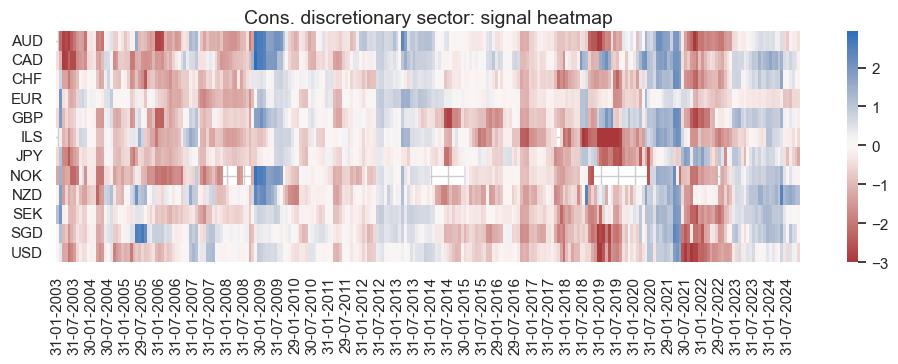

In [49]:
pnl_name = cod_dict["pnl_name"]
secname = cod_dict["sector_name"]

pnl_cod.signal_heatmap(
    pnl_name=f"{secname} learning-based signal",
    figsize=(12, 3),
    title=f"{secname} sector: signal heatmap",
)

### Consumer staples

#### Factor selection and signal generation

In [50]:
sector = "COS"

cos_dict = {
    "sector_name": sector_labels[sector],
    "signal_name": f"{sector}SOL",
    "pnl_name": f"{sector_labels[sector]} learning-based signal",
    "xcatx": macroz,
    "cidx": cids_eq,
    "ret": f"EQC{sector}{default_target_type}",
    "freq": "M",
    "black": sector_blacklist[sector],
    "srr": None,
    "pnls": None,
}

In [51]:
xcatx = cos_dict["xcatx"] + [cos_dict["ret"]]
cidx = cos_dict["cidx"]

so_cos = msl.SignalOptimizer(
    df = dfx,
    xcats = xcatx,
    cids = cidx,
    blacklist = cos_dict["black"],
    freq = cos_dict["freq"],
    lag = 1,
    xcat_aggs=["last", "sum"],
)

  0%|          | 0/89 [00:00<?, ?it/s]

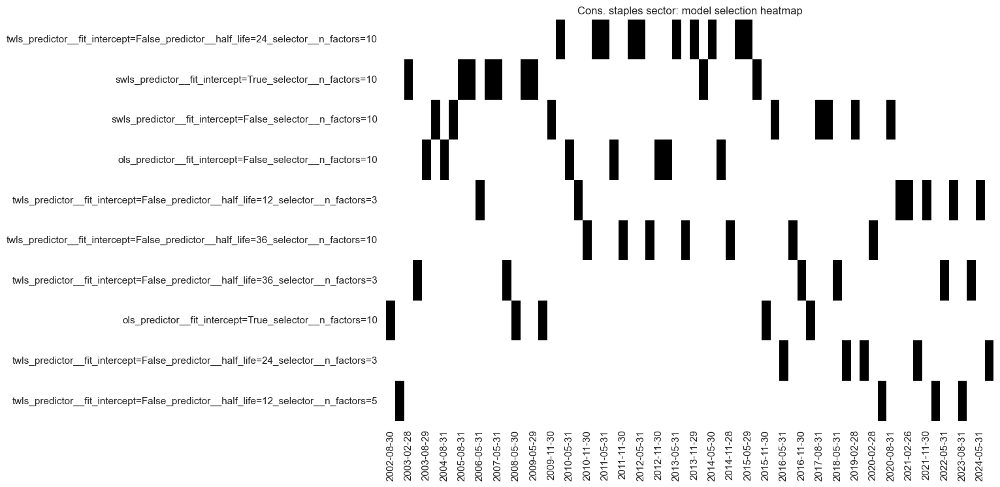

In [52]:
secname = cos_dict["sector_name"]
signal_name = cos_dict["signal_name"]


so_cos.calculate_predictions(
    name=signal_name,
    models=default_models,
    scorers=default_metric,
    hyperparameters=default_hparam_grid,
    inner_splitters = default_splitter,
    test_size=default_test_size,
    min_cids=default_min_cids, 
    min_periods=default_min_periods,
    n_jobs_outer=-1,
    split_functions=default_split_functions,
)
so_cos.models_heatmap(
    signal_name,
    cap=10,
    title=f"{secname} sector: model selection heatmap",
)

# Store signals
dfa = so_cos.get_optimized_signals()
dfx = msm.update_df(dfx, dfa)

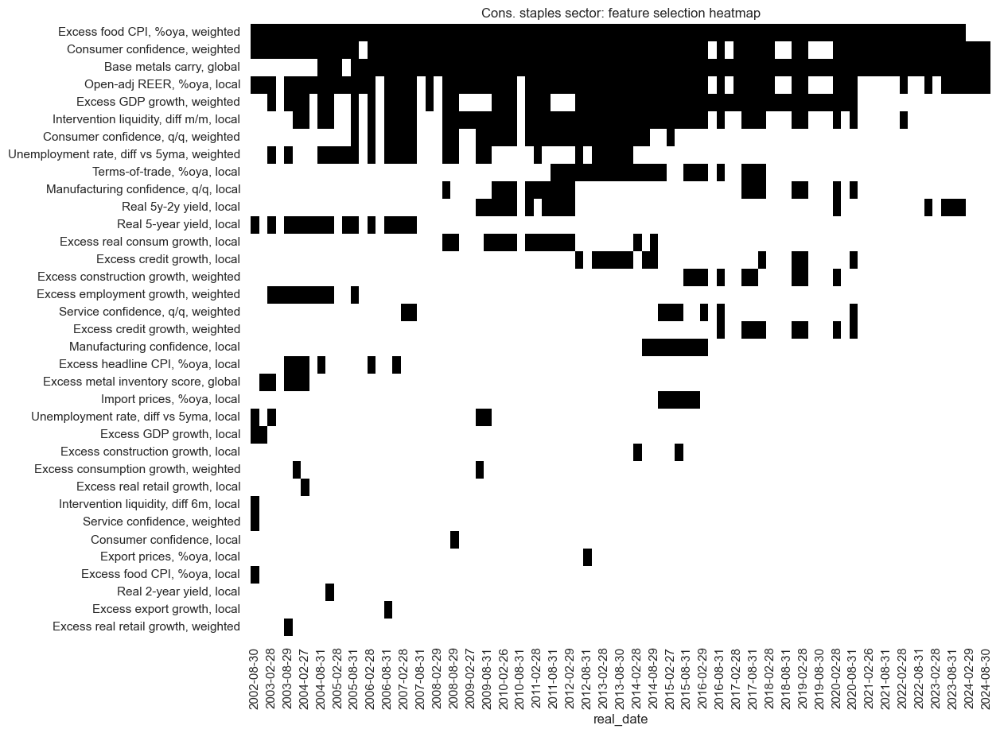

In [53]:
xcatx = cos_dict["signal_name"]
secname = cos_dict["sector_name"]

so_cos.feature_selection_heatmap(
    xcatx,
    remove_blanks=True,
    title=f"{secname} sector: feature selection heatmap",
    ftrs_renamed=cat_label_dict,
    figsize=(12, 10),
)

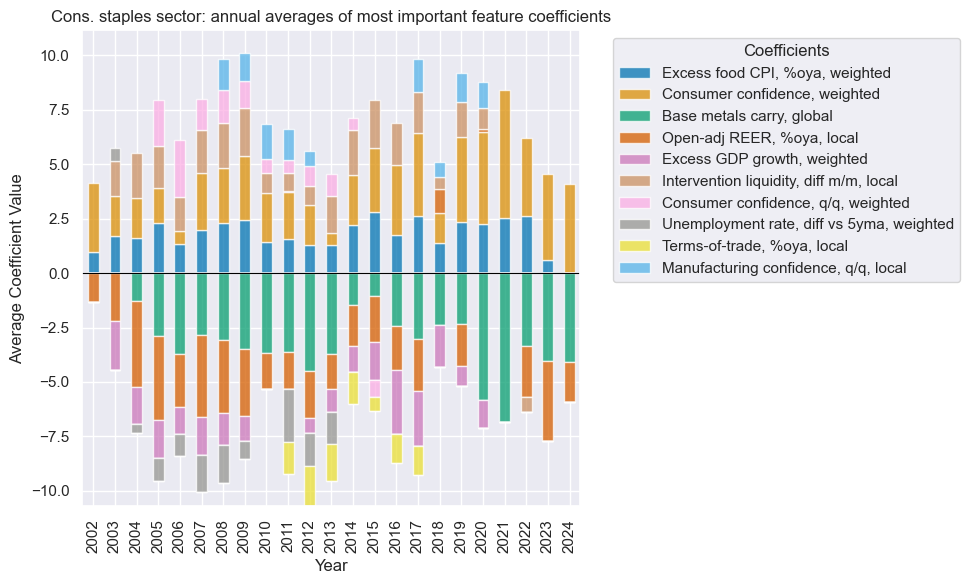

In [54]:
xcatx = cos_dict["signal_name"]
secname = cos_dict["sector_name"]

so_cos.coefs_stackedbarplot(
    name=xcatx,
    ftrs_renamed=cat_label_dict,
    title=f"{secname} sector: annual averages of most important feature coefficients",
)

#### Signal quality check

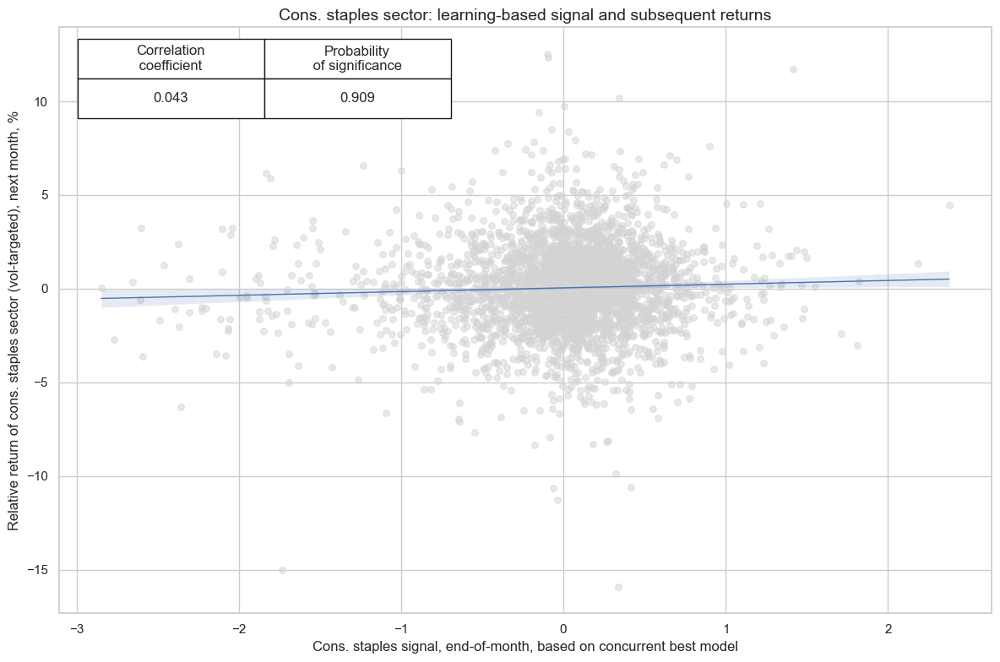

In [55]:
xcatx = [cos_dict["signal_name"], cos_dict["ret"]]
cidx = cos_dict["cidx"]
secname = cos_dict["sector_name"]

cr_cos = msp.CategoryRelations(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    freq=cos_dict["freq"],
    blacklist = cos_dict["black"],
    lag=1,
    xcat_aggs=["last", "sum"],
    slip=1,
)

cr_cos.reg_scatter(
    title=f"{secname} sector: learning-based signal and subsequent returns",
    labels=False,
    prob_est="map",
    xlab=f"{secname} signal, end-of-month, based on concurrent best model",
    ylab=f"Relative return of {secname.lower()} sector (vol-targeted), next month, %",
    coef_box="upper left",
    size=(12, 8),
)

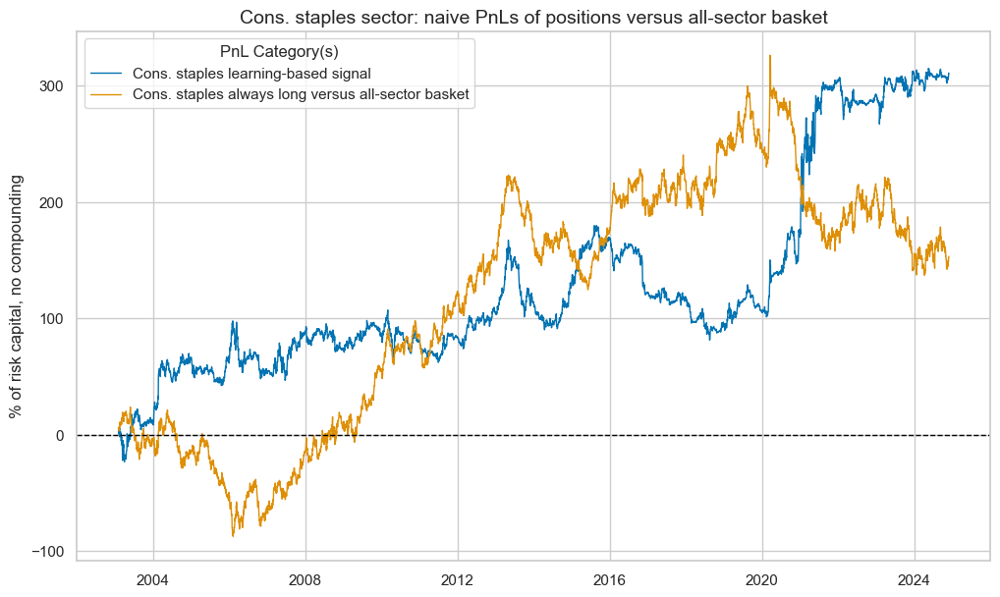

xcat,Cons. staples learning-based signal,Cons. staples always long versus all-sector basket
Return %,14.219914,7.023877
St. Dev. %,33.631262,37.543193
Sharpe Ratio,0.422818,0.187088
Sortino Ratio,0.620258,0.268016
Max 21-Day Draw %,-48.463479,-33.681565
Max 6-Month Draw %,-53.161616,-93.828486
Peak to Trough Draw %,-98.285987,-188.904199
Top 5% Monthly PnL Share,1.25132,2.446341
USD_EQXR_NSA correl,-0.012331,-0.13535
Traded Months,263,263


In [56]:
xcatx = [cos_dict["signal_name"]]
cidx = cos_dict["cidx"]
secname = cos_dict["sector_name"]
signal_name = cos_dict["signal_name"]
pnl_name = cos_dict["pnl_name"]

pnl_cos = msn.NaivePnL(
    df=dfx,
    ret=cos_dict["ret"],
    sigs=xcatx,
    cids=cidx,
    start=default_start_date,
    blacklist = cos_dict["black"],
    bms=["USD_EQXR_NSA"],
)

for xcat in xcatx:
    pnl_cos.make_pnl(
        sig=xcat,
        sig_op="zn_score_pan",
        rebal_freq="monthly",
        neutral="zero",
        rebal_slip=1,
        vol_scale = None,
        thresh=3,
        pnl_name=pnl_name,
    )
pnl_cos.make_long_pnl(
    vol_scale=None, label=f"{secname} always long versus all-sector basket"
)

pnl_cos.plot_pnls(
    pnl_cats=pnl_cos.pnl_names, 
    title=f"{secname} sector: naive PnLs of positions versus all-sector basket",
    title_fontsize=14
)

cos_dict["pnls"] = pnl_cos
pnl_cos.evaluate_pnls(pnl_cats=pnl_cos.pnl_names)

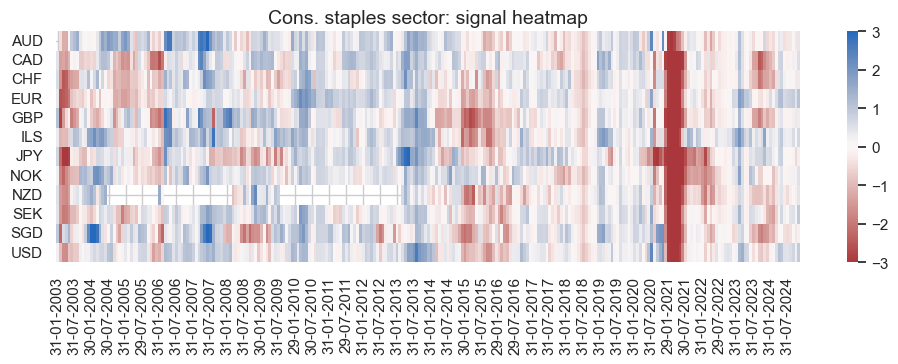

In [57]:
pnl_name = cos_dict["pnl_name"]
secname = cos_dict["sector_name"]

pnl_cos.signal_heatmap(
    pnl_name=pnl_name,
    figsize=(12, 3),
    title=f"{secname} sector: signal heatmap",
)

### Healthcare

#### Factor selection and signal generation

In [58]:
sector = "HLC"

hlc_dict = {
    "sector_name": sector_labels[sector],
    "signal_name": f"{sector}SOL",
    "pnl_name": f"{sector_labels[sector]} learning-based signal",
    "xcatx": macroz,
    "cidx": cids_eq,
    "ret": f"EQC{sector}{default_target_type}",
    "freq": "M",
    "black": sector_blacklist[sector],
    "srr": None,
    "pnls": None,
}

In [59]:
xcatx = hlc_dict["xcatx"] + [hlc_dict["ret"]]
cidx = hlc_dict["cidx"]

so_hlc = msl.SignalOptimizer(
    df = dfx,
    xcats = xcatx,
    cids = cidx,
    blacklist = hlc_dict["black"],
    freq = hlc_dict["freq"],
    lag = 1,
    xcat_aggs=["last", "sum"],
)

  0%|          | 0/89 [00:00<?, ?it/s]

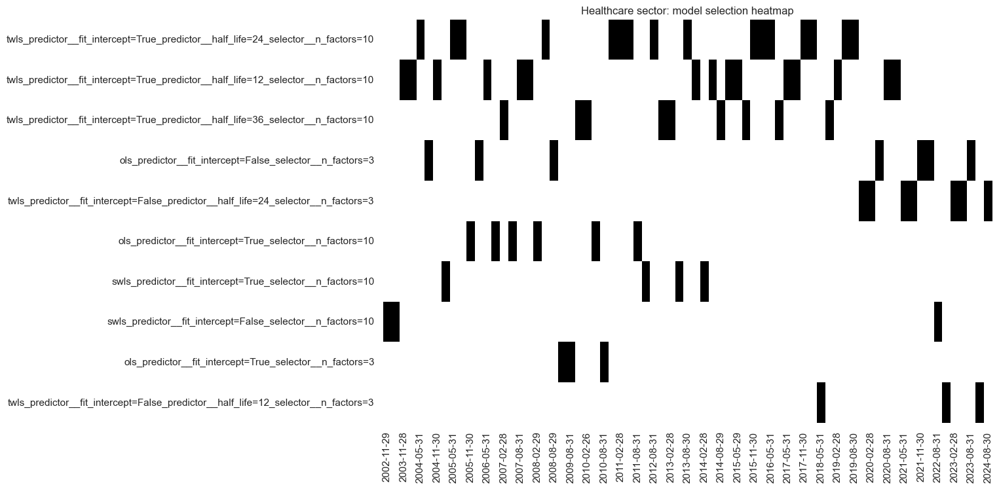

In [60]:
secname = hlc_dict["sector_name"]
signal_name = hlc_dict["signal_name"]


so_hlc.calculate_predictions(
    name=signal_name,
    models=default_models,
    scorers=default_metric,
    hyperparameters=default_hparam_grid,
    inner_splitters = default_splitter,
    test_size=default_test_size,
    min_cids=default_min_cids, 
    min_periods=default_min_periods,
    n_jobs_outer=-1,
    split_functions=default_split_functions,
)
so_hlc.models_heatmap(
    signal_name,
    cap=10,
    title=f"{secname} sector: model selection heatmap",
)

# Store signals
dfa = so_hlc.get_optimized_signals()
dfx = msm.update_df(dfx, dfa)

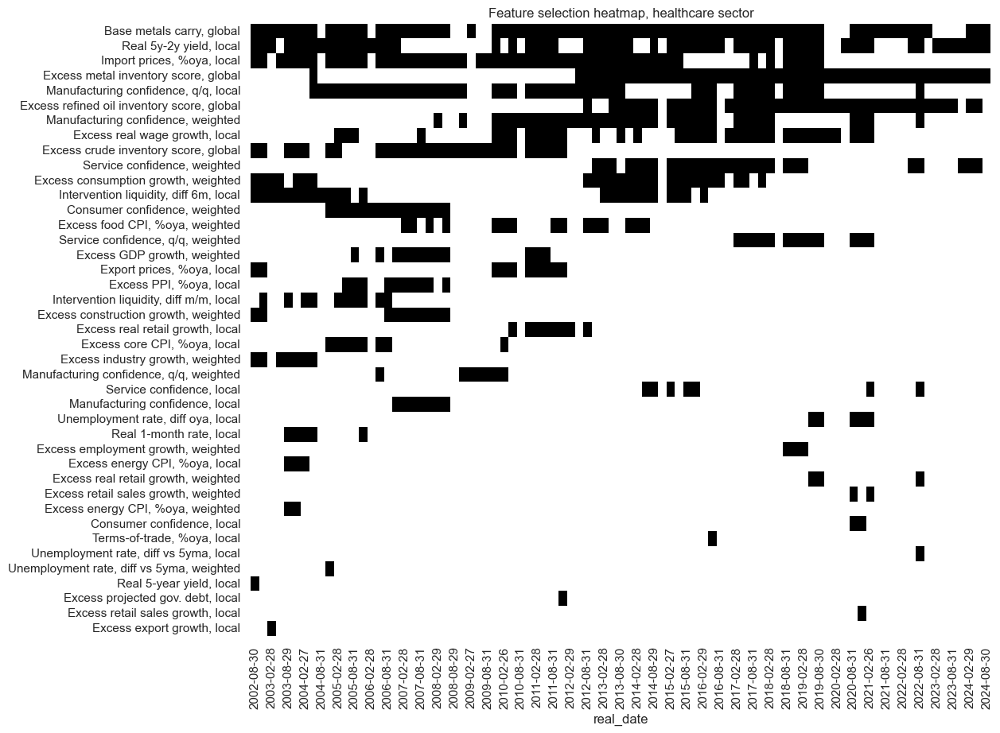

In [61]:
xcatx = hlc_dict["signal_name"]

so_hlc.feature_selection_heatmap(
    xcatx,
    remove_blanks=True,
    title="Feature selection heatmap, healthcare sector",
    ftrs_renamed=cat_label_dict,
    figsize=(12, 10),
)

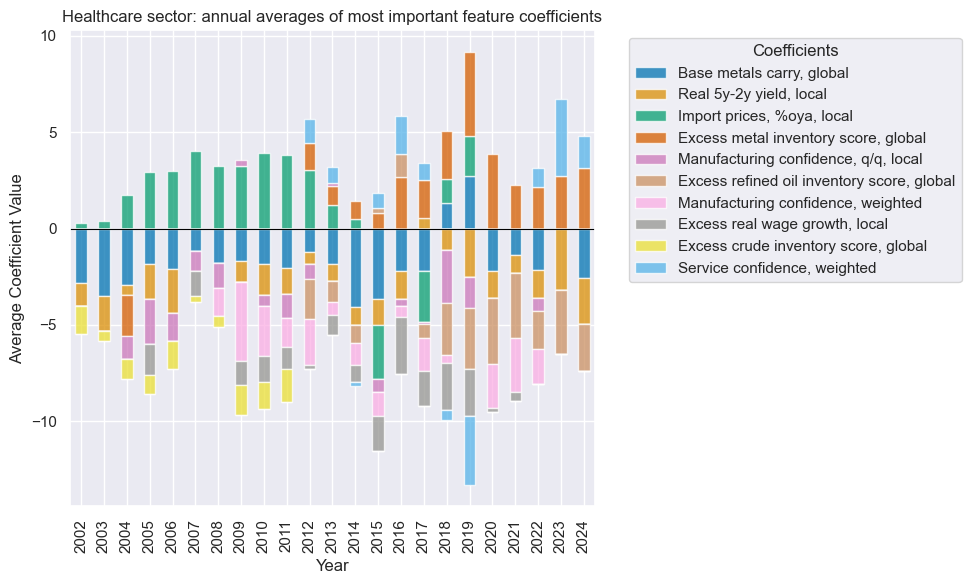

In [62]:
xcatx = hlc_dict["signal_name"]
signal_name = hlc_dict["signal_name"]

so_hlc.coefs_stackedbarplot(
    name=xcatx,
    ftrs_renamed=cat_label_dict,
    title=f"{secname} sector: annual averages of most important feature coefficients",
)

#### Signal quality check

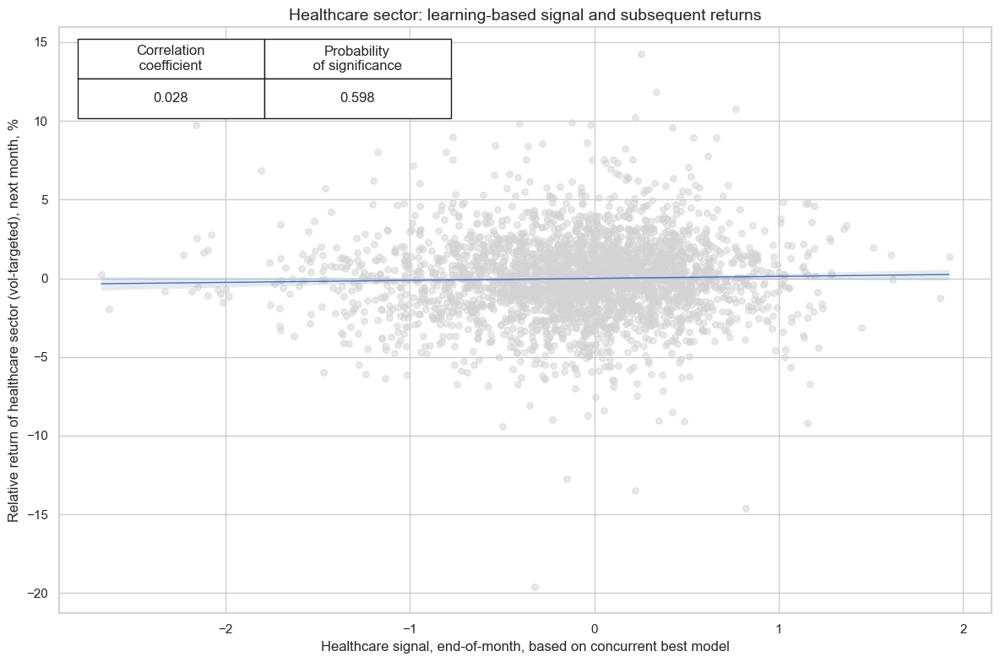

In [63]:
xcatx = [hlc_dict["signal_name"], hlc_dict["ret"]]
cidx = hlc_dict["cidx"]
secname = hlc_dict["sector_name"]

cr_hlc = msp.CategoryRelations(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    freq=hlc_dict["freq"],
    blacklist = hlc_dict["black"],
    lag=1,
    xcat_aggs=["last", "sum"],
    slip=1,
)

cr_hlc.reg_scatter(
    title=f"{secname} sector: learning-based signal and subsequent returns",
    labels=False,
    prob_est="map",
    xlab=f"{secname} signal, end-of-month, based on concurrent best model",
    ylab=f"Relative return of {secname.lower()} sector (vol-targeted), next month, %",
    coef_box="upper left",
    size=(12, 8),
)

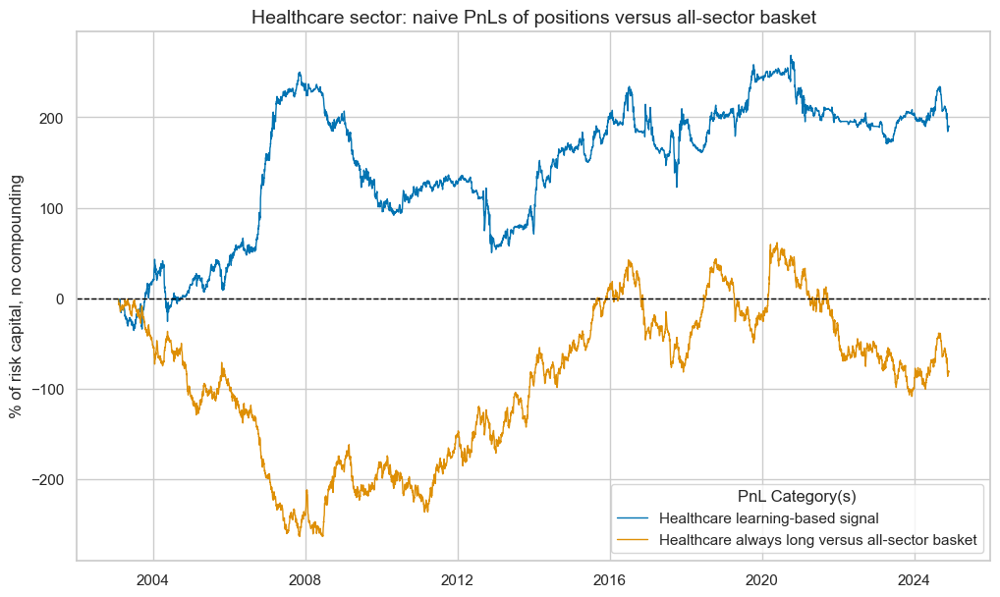

xcat,Healthcare learning-based signal,Healthcare always long versus all-sector basket
Return %,8.702954,-3.726952
St. Dev. %,35.605841,38.49197
Sharpe Ratio,0.244425,-0.096824
Sortino Ratio,0.35035,-0.13858
Max 21-Day Draw %,-54.683253,-47.409795
Max 6-Month Draw %,-74.21209,-93.207315
Peak to Trough Draw %,-199.7919,-262.724098
Top 5% Monthly PnL Share,2.050835,-4.570977
USD_EQXR_NSA correl,0.002254,-0.158846
Traded Months,263,263


In [64]:
xcatx = [hlc_dict["signal_name"]]
cidx = hlc_dict["cidx"]
secname = hlc_dict["sector_name"]
signal_name = hlc_dict["signal_name"]
pnl_name = hlc_dict["pnl_name"]

pnl_hlc = msn.NaivePnL(
    df=dfx,
    ret=hlc_dict["ret"],
    sigs=xcatx,
    cids=cidx,
    start=default_start_date,
    blacklist = hlc_dict["black"],
    bms=["USD_EQXR_NSA"],
)

for xcat in xcatx:
    pnl_hlc.make_pnl(
        sig=xcat,
        sig_op="zn_score_pan",
        rebal_freq="monthly",
        neutral="zero",
        rebal_slip=1,
        vol_scale = None,
        thresh=3,
        pnl_name=pnl_name,
    )
pnl_hlc.make_long_pnl(
    vol_scale=None, label=f"{secname} always long versus all-sector basket"
)

pnl_hlc.plot_pnls(
    pnl_cats=pnl_hlc.pnl_names,
    title=f"{secname} sector: naive PnLs of positions versus all-sector basket",
    title_fontsize=14
)

hlc_dict["pnls"] = pnl_hlc
pnl_hlc.evaluate_pnls(pnl_cats=pnl_hlc.pnl_names)

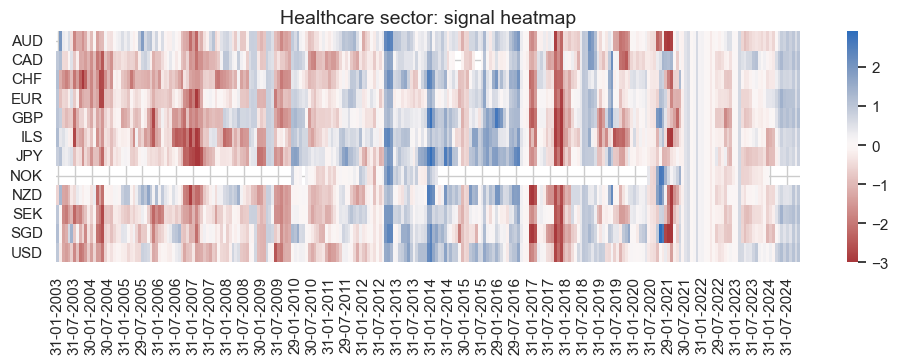

In [65]:
pnl_name = hlc_dict["pnl_name"]
secname = hlc_dict["sector_name"]

pnl_hlc.signal_heatmap(
    pnl_name=pnl_name,
    figsize=(12, 3),
    title=f"{secname} sector: signal heatmap",
)

### Financials

#### Factor selection and signal generation

In [66]:
sector = "FIN"

fin_dict = {
    "sector_name": sector_labels[sector],
    "signal_name": f"{sector}SOL",
    "pnl_name": f"{sector_labels[sector]} learning-based signal",
    "xcatx": macroz,
    "cidx": cids_eq,
    "ret": f"EQC{sector}{default_target_type}",
    "freq": "M",
    "black": sector_blacklist[sector],
    "srr": None,
    "pnls": None,
}

In [67]:
xcatx = fin_dict["xcatx"] + [fin_dict["ret"]]
cidx = fin_dict["cidx"]

so_fin = msl.SignalOptimizer(
    df = dfx,
    xcats = xcatx,
    cids = cidx,
    blacklist = fin_dict["black"],
    freq = fin_dict["freq"],
    lag = 1,
    xcat_aggs=["last", "sum"],
)

  0%|          | 0/89 [00:00<?, ?it/s]

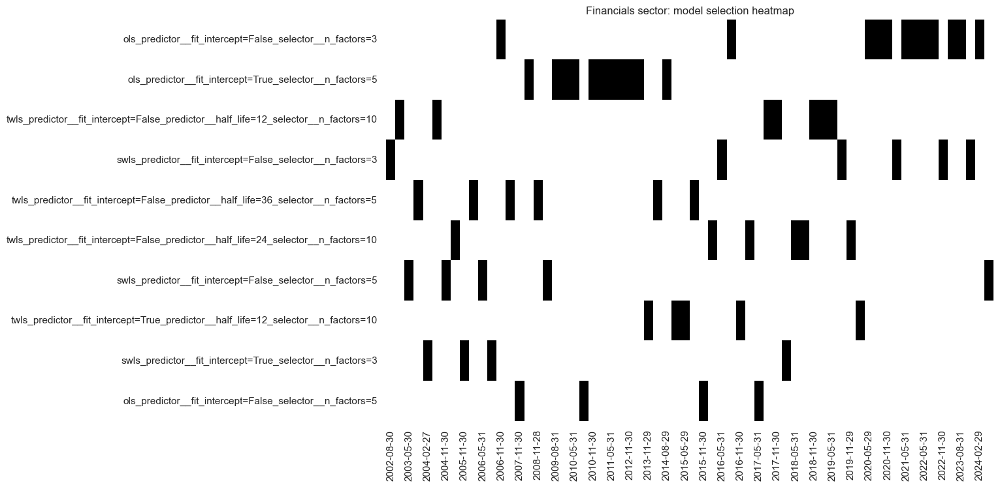

In [68]:
secname = fin_dict["sector_name"]
signal_name = fin_dict["signal_name"]


so_fin.calculate_predictions(
    name=signal_name,
    models=default_models,
    scorers=default_metric,
    hyperparameters=default_hparam_grid,
    inner_splitters = default_splitter,
    test_size=default_test_size,
    min_cids=default_min_cids, 
    min_periods=default_min_periods,
    n_jobs_outer=-1,
    split_functions=default_split_functions,
)
so_fin.models_heatmap(
    signal_name,
    cap=10,
    title=f"{secname} sector: model selection heatmap",
)

# Store signals
dfa = so_fin.get_optimized_signals()
dfx = msm.update_df(dfx, dfa)

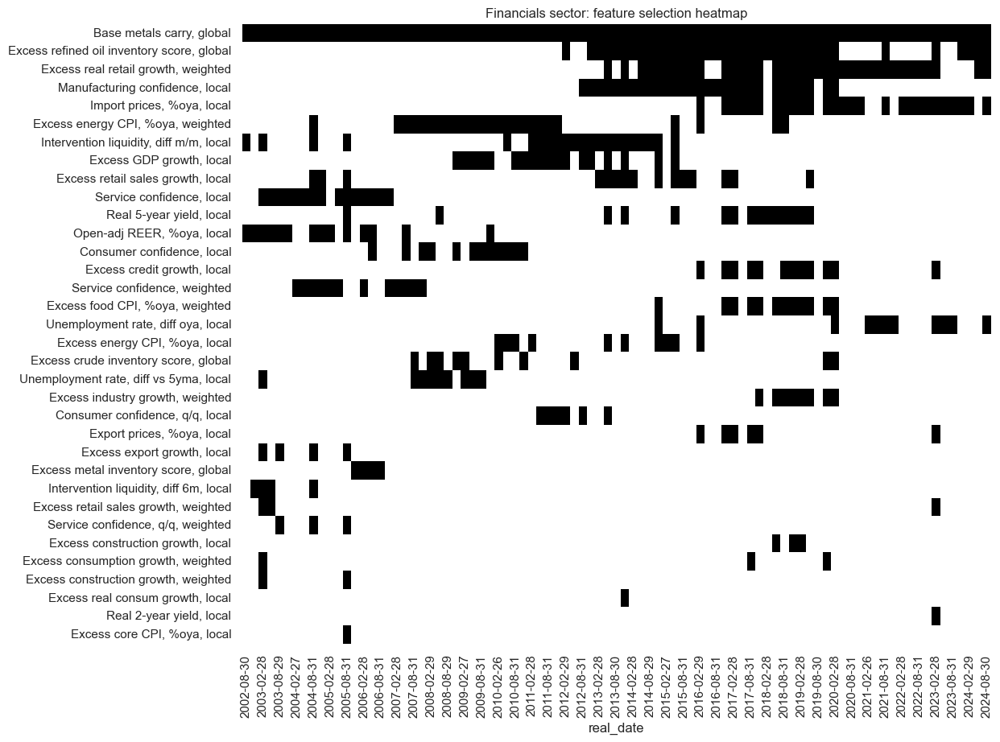

In [69]:
xcatx = fin_dict["signal_name"]
secname = fin_dict["sector_name"]

so_fin.feature_selection_heatmap(
    xcatx,
    remove_blanks=True,
    title=f"{secname} sector: feature selection heatmap",
    ftrs_renamed=cat_label_dict,
    figsize=(12, 10),
)

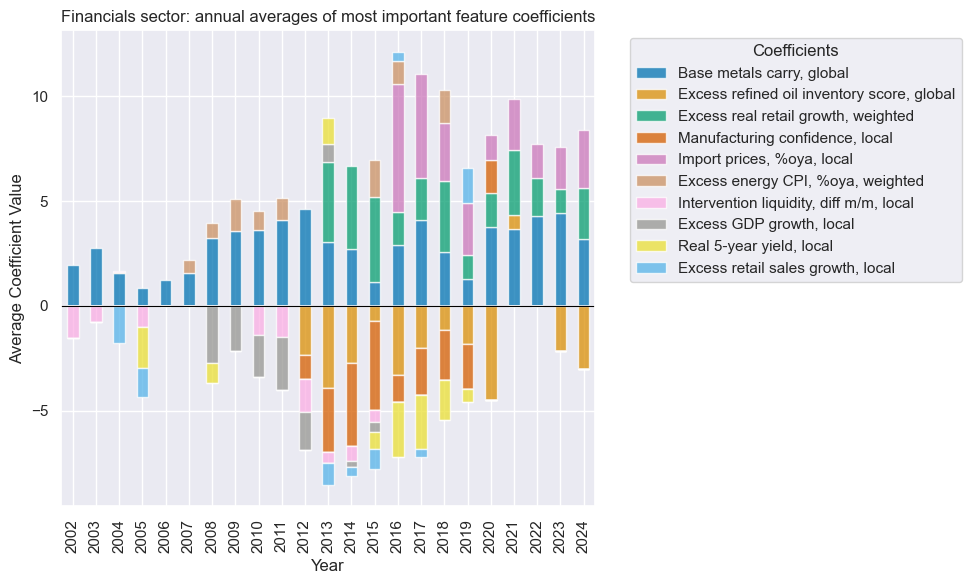

In [70]:
xcatx = fin_dict["signal_name"]
secname = fin_dict["sector_name"]

so_fin.coefs_stackedbarplot(
    name=xcatx,
    ftrs_renamed=cat_label_dict,
    title=f"{secname} sector: annual averages of most important feature coefficients",
)

#### Signal quality check

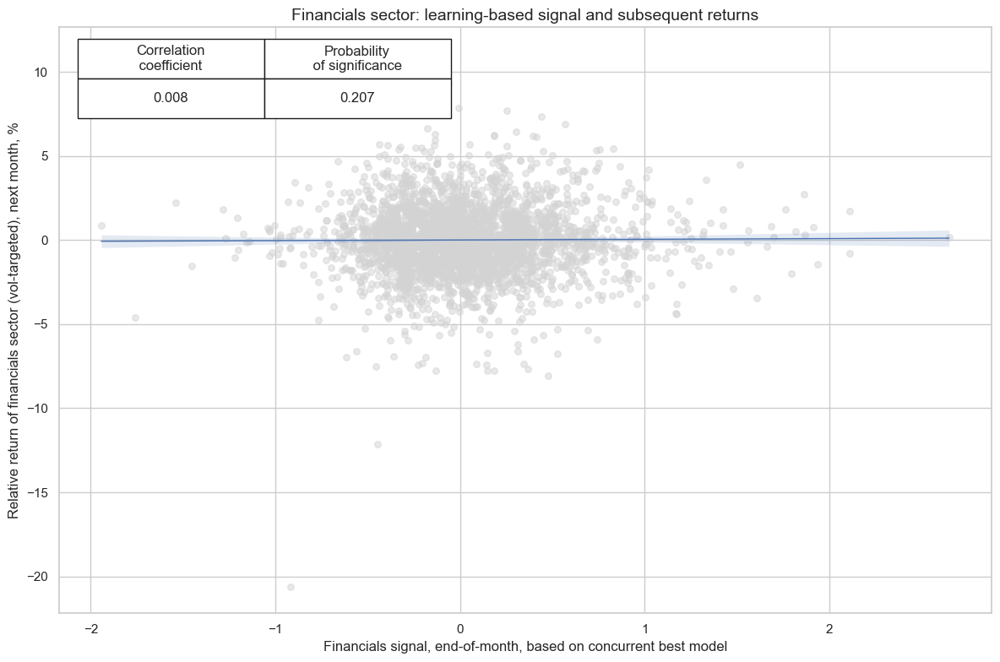

In [71]:
xcatx = [fin_dict["signal_name"], fin_dict["ret"]]
cidx = fin_dict["cidx"]
secname = fin_dict["sector_name"]

cr_fin = msp.CategoryRelations(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    freq=fin_dict["freq"],
    blacklist = fin_dict["black"],
    lag=1,
    xcat_aggs=["last", "sum"],
    slip=1,
)

cr_fin.reg_scatter(
    title=f"{secname} sector: learning-based signal and subsequent returns",
    labels=False,
    prob_est="map",
    xlab=f"{secname} signal, end-of-month, based on concurrent best model",
    ylab=f"Relative return of {secname.lower()} sector (vol-targeted), next month, %",
    coef_box="upper left",
    size=(12, 8),
)

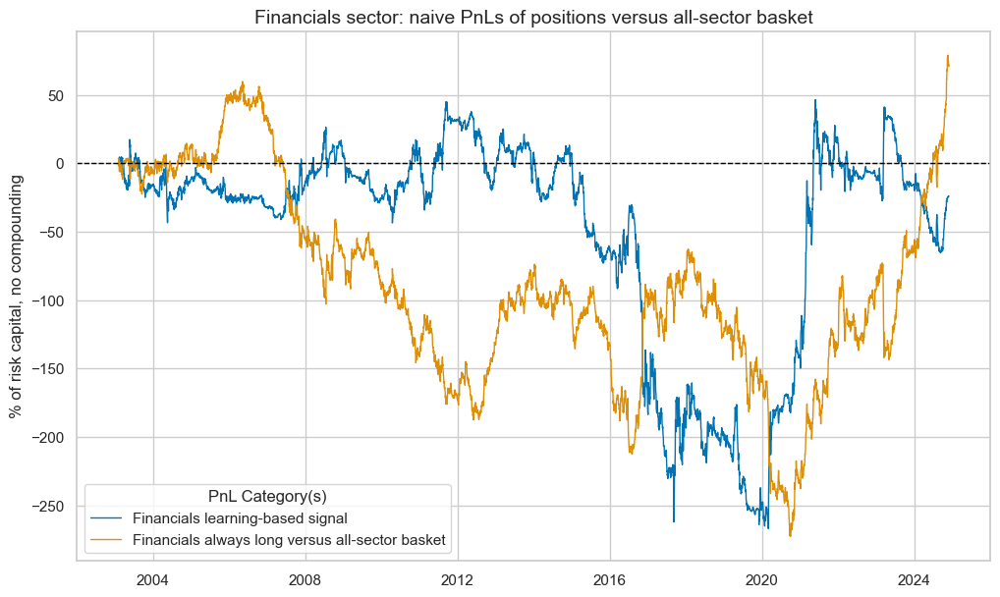

xcat,Financials learning-based signal,Financials always long versus all-sector basket
Return %,-1.090167,3.305202
St. Dev. %,43.639779,38.175851
Sharpe Ratio,-0.024981,0.086578
Sortino Ratio,-0.037477,0.126331
Max 21-Day Draw %,-86.769769,-76.126375
Max 6-Month Draw %,-152.897607,-96.122679
Peak to Trough Draw %,-312.039862,-332.744644
Top 5% Monthly PnL Share,-23.924655,5.982793
USD_EQXR_NSA correl,-0.042891,0.219152
Traded Months,263,263


In [72]:
xcatx = [fin_dict["signal_name"]]
cidx = fin_dict["cidx"]
secname = fin_dict["sector_name"]
signal_name = fin_dict["signal_name"]
pnl_name = fin_dict["pnl_name"]

pnl_fin = msn.NaivePnL(
    df=dfx,
    ret=fin_dict["ret"],
    sigs=xcatx,
    cids=cidx,
    start=default_start_date,
    blacklist = fin_dict["black"],
    bms=["USD_EQXR_NSA"],
)

for xcat in xcatx:
    pnl_fin.make_pnl(
        sig=xcat,
        sig_op="zn_score_pan",
        rebal_freq="monthly",
        neutral="zero",
        rebal_slip=1,
        vol_scale = None,
        thresh=3,
        pnl_name=pnl_name,
    )
pnl_fin.make_long_pnl(
    vol_scale=None, label=f"{secname} always long versus all-sector basket"
)

pnl_fin.plot_pnls(
    pnl_cats=pnl_fin.pnl_names,
    title=f"{secname} sector: naive PnLs of positions versus all-sector basket",
    title_fontsize=14
)

fin_dict["pnls"] = pnl_fin
pnl_fin.evaluate_pnls(pnl_cats=pnl_fin.pnl_names)

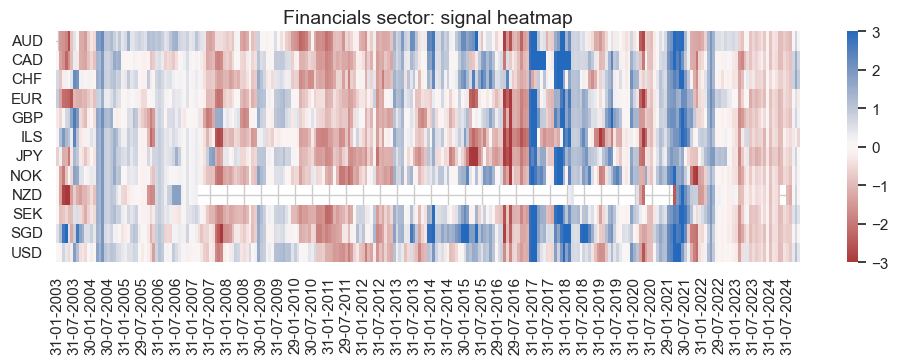

In [73]:
xcatx = fin_dict["signal_name"]
pnl_name = fin_dict["pnl_name"]
secname = fin_dict["sector_name"]

pnl_fin.signal_heatmap(
    pnl_name=pnl_name,
    figsize=(12, 3),
    title=f"{secname} sector: signal heatmap",
)

### Technology

#### Factor selection and signal generation

In [74]:
sector = "ITE"

ite_dict = {
    "sector_name": sector_labels[sector],
    "signal_name": f"{sector}SOL",
    "pnl_name": f"{sector_labels[sector]} learning-based signal",
    "xcatx": macroz,
    "cidx": cids_eq,
    "ret": f"EQC{sector}{default_target_type}",
    "freq": "M",
    "black": sector_blacklist[sector],
    "srr": None,
    "pnls": None,
}

In [75]:
xcatx = ite_dict["xcatx"] + [ite_dict["ret"]]
cidx = ite_dict["cidx"]

so_ite = msl.SignalOptimizer(
    df = dfx,
    xcats = xcatx,
    cids = cidx,
    blacklist = ite_dict["black"],
    freq = ite_dict["freq"],
    lag = 1,
    xcat_aggs=["last", "sum"],
)

  0%|          | 0/89 [00:00<?, ?it/s]

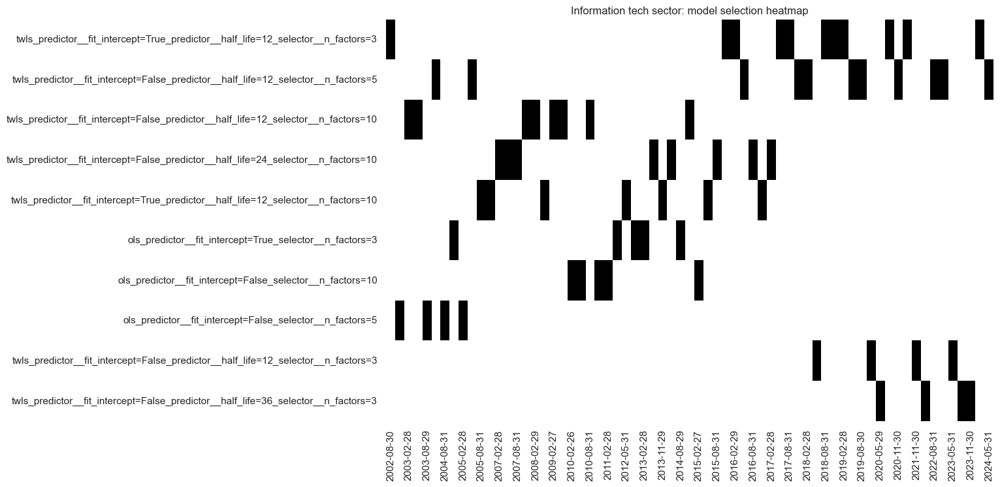

In [76]:
secname = ite_dict["sector_name"]
signal_name = ite_dict["signal_name"]


so_ite.calculate_predictions(
    name=signal_name,
    models=default_models,
    scorers=default_metric,
    hyperparameters=default_hparam_grid,
    inner_splitters = default_splitter,
    test_size=default_test_size,
    min_cids=default_min_cids, 
    min_periods=default_min_periods,
    n_jobs_outer=-1,
    split_functions=default_split_functions,
)
so_ite.models_heatmap(
    signal_name,
    cap=10,
    title=f"{secname} sector: model selection heatmap",
)

# Store signals
dfa = so_ite.get_optimized_signals()
dfx = msm.update_df(dfx, dfa)

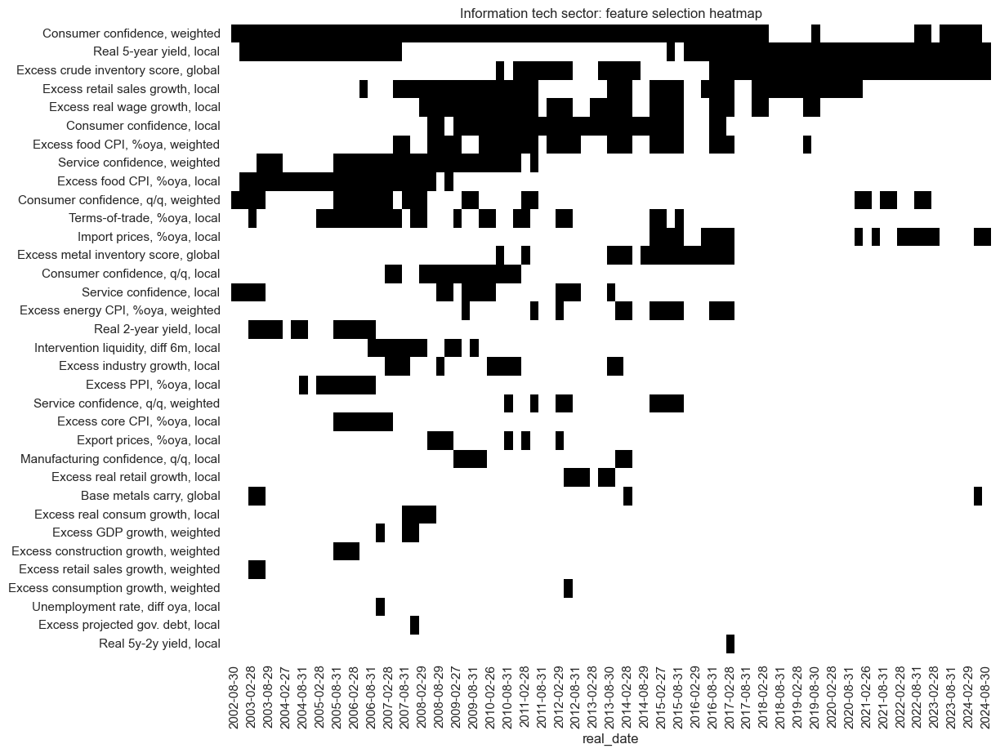

In [77]:
xcatx = ite_dict["signal_name"]
secname = ite_dict["sector_name"]

so_ite.feature_selection_heatmap(
    xcatx,
    remove_blanks=True,
    title=f"{secname} sector: feature selection heatmap",
    ftrs_renamed=cat_label_dict,
    figsize=(12, 10),
)

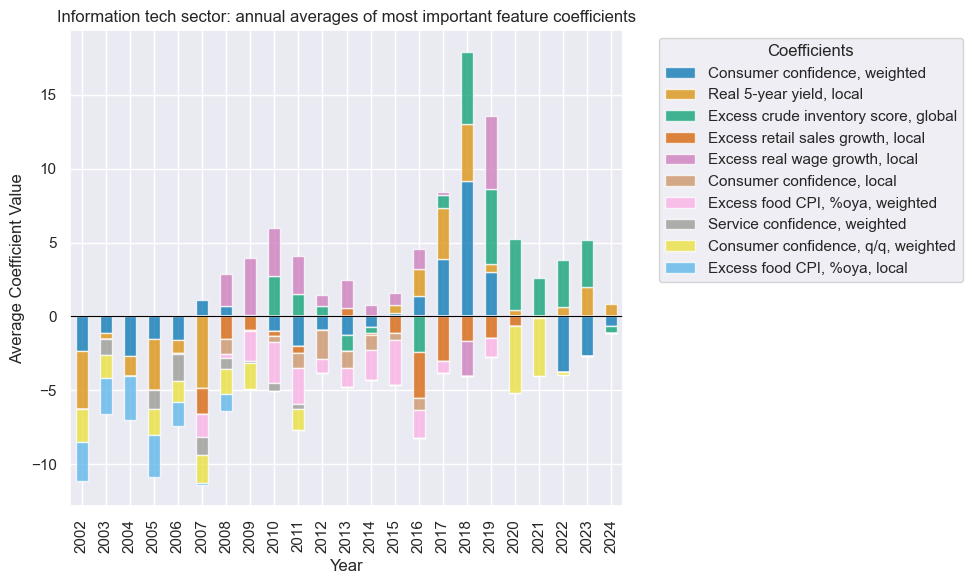

In [78]:
xcatx = ite_dict["signal_name"]
secname = ite_dict["sector_name"]

so_ite.coefs_stackedbarplot(
    name=xcatx,
    ftrs_renamed=cat_label_dict,
    title=f"{secname} sector: annual averages of most important feature coefficients",
)

#### Signal quality check

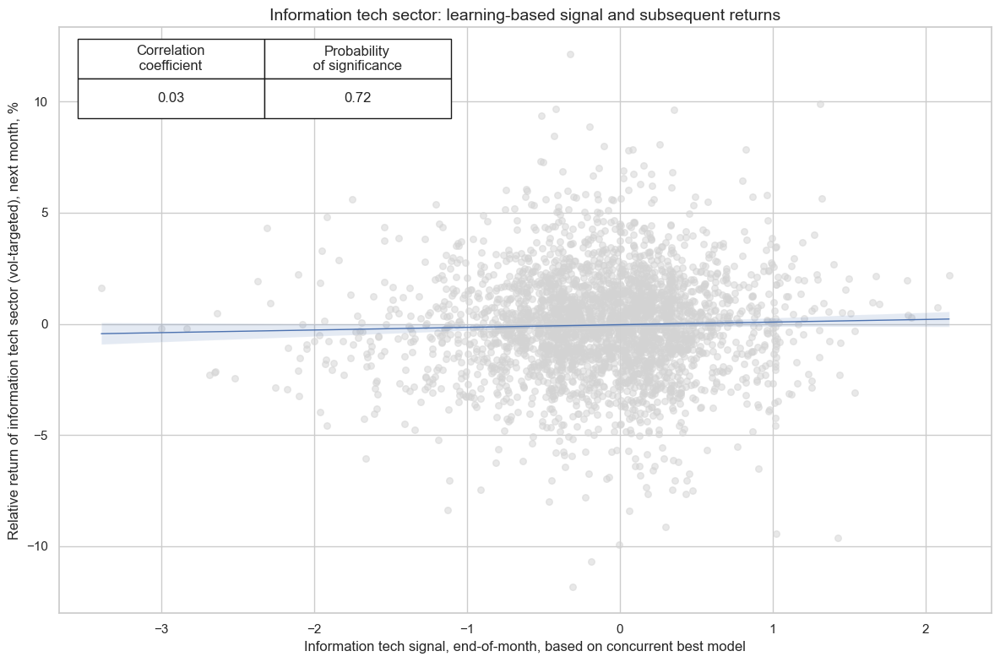

In [79]:
xcatx = [ite_dict["signal_name"], ite_dict["ret"]]
cidx = ite_dict["cidx"]
secname = ite_dict["sector_name"]

cr_ite = msp.CategoryRelations(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    freq=ite_dict["freq"],
    blacklist = ite_dict["black"],
    lag=1,
    xcat_aggs=["last", "sum"],
    slip=1,
)

cr_ite.reg_scatter(
    title=f"{secname} sector: learning-based signal and subsequent returns",
    labels=False,
    prob_est="map",
    xlab=f"{secname} signal, end-of-month, based on concurrent best model",
    ylab=f"Relative return of {secname.lower()} sector (vol-targeted), next month, %",
    coef_box="upper left",
    size=(12, 8),
)

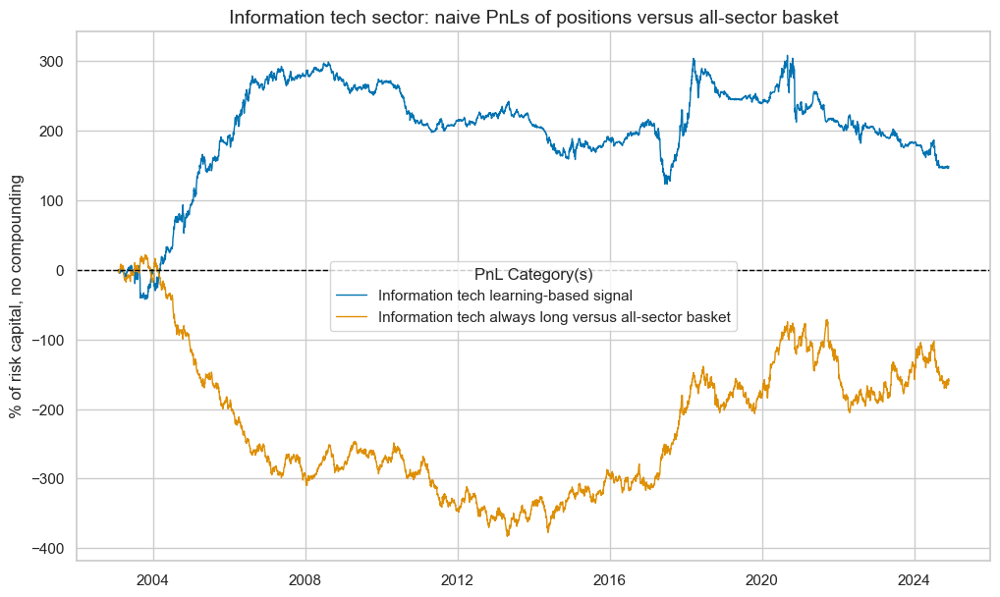

xcat,Information tech learning-based signal,Information tech always long versus all-sector basket
Return %,6.809801,-7.301641
St. Dev. %,33.917082,37.508259
Sharpe Ratio,0.200778,-0.194668
Sortino Ratio,0.269447,-0.269019
Max 21-Day Draw %,-84.295933,-43.579705
Max 6-Month Draw %,-88.795048,-116.166222
Peak to Trough Draw %,-175.534762,-404.663283
Top 5% Monthly PnL Share,2.774087,-2.273547
USD_EQXR_NSA correl,-0.003084,0.031326
Traded Months,263,263


In [80]:
xcatx = [ite_dict["signal_name"]]
cidx = ite_dict["cidx"]
secname = ite_dict["sector_name"]
signal_name = ite_dict["signal_name"]
pnl_name = ite_dict["pnl_name"]

pnl_ite = msn.NaivePnL(
    df=dfx,
    ret=ite_dict["ret"],
    sigs=xcatx,
    cids=cidx,
    start=default_start_date,
    blacklist=ite_dict["black"],
    bms=["USD_EQXR_NSA"],
)

for xcat in xcatx:
    pnl_ite.make_pnl(
        sig=xcat,
        sig_op="zn_score_pan",
        rebal_freq="monthly",
        neutral="zero",
        rebal_slip=1,
        vol_scale = None,
        thresh=3,
        pnl_name=pnl_name,
    )
pnl_ite.make_long_pnl(
    vol_scale=None, label=f"{secname} always long versus all-sector basket"
)

pnl_ite.plot_pnls(
    pnl_cats=pnl_ite.pnl_names,
    title=f"{secname} sector: naive PnLs of positions versus all-sector basket",
    title_fontsize=14,
)

ite_dict["pnls"] = pnl_ite
pnl_ite.evaluate_pnls(pnl_cats=pnl_ite.pnl_names)

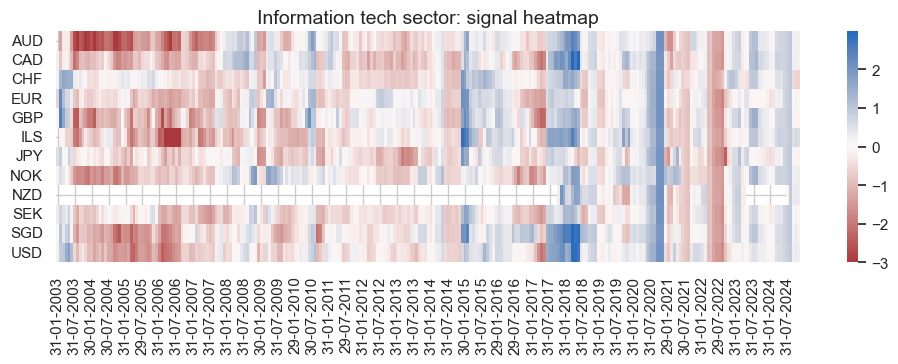

In [81]:
pnl_name = ite_dict["pnl_name"]
secname = ite_dict["sector_name"]

pnl_ite.signal_heatmap(
    pnl_name=pnl_name,
    figsize=(12, 3),
    title=f"{secname} sector: signal heatmap",
)

### Communication

#### Factor selection and signal generation

In [82]:
sector = "CSR"

csr_dict = {
    "sector_name": sector_labels[sector],
    "signal_name": f"{sector}SOL",
    "pnl_name": f"{sector_labels[sector]} learning-based signal",
    "xcatx": macroz,
    "cidx": cids_eq,
    "ret": f"EQC{sector}{default_target_type}",
    "freq": "M",
    "black": sector_blacklist[sector],
    "srr": None,
    "pnls": None,
}

In [83]:
xcatx = csr_dict["xcatx"] + [csr_dict["ret"]]
cidx = csr_dict["cidx"]

so_csr = msl.SignalOptimizer(
    df = dfx,
    xcats = xcatx,
    cids = cidx,
    blacklist = csr_dict["black"],
    freq = csr_dict["freq"],
    lag = 1,
    xcat_aggs=["last", "sum"],
)

  0%|          | 0/89 [00:00<?, ?it/s]

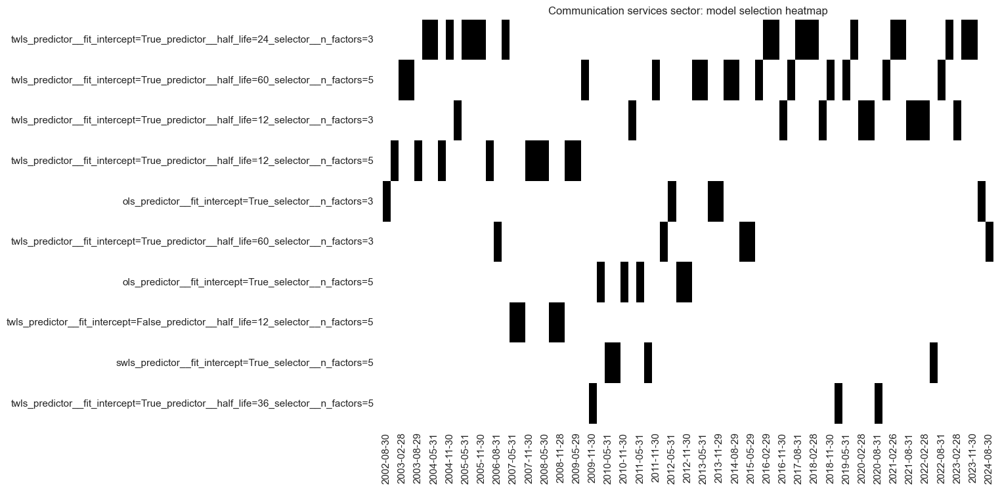

In [84]:
secname = csr_dict["sector_name"]
signal_name = csr_dict["signal_name"]


so_csr.calculate_predictions(
    name=signal_name,
    models=default_models,
    scorers=default_metric,
    hyperparameters=default_hparam_grid,
    inner_splitters = default_splitter,
    test_size=default_test_size,
    min_cids=default_min_cids, 
    min_periods=default_min_periods,
    n_jobs_outer=-1,
    split_functions=default_split_functions,
)
so_csr.models_heatmap(
    signal_name,
    cap=10,
    title=f"{secname} sector: model selection heatmap",
)

# Store signals
dfa = so_csr.get_optimized_signals()
dfx = msm.update_df(dfx, dfa)

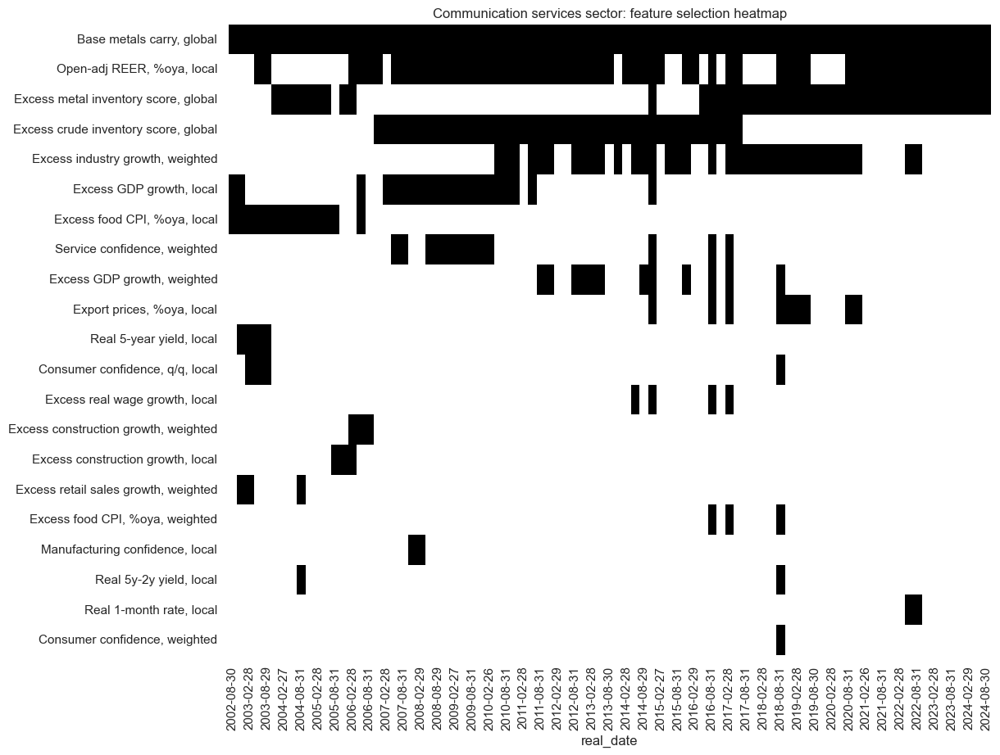

In [85]:
xcatx = csr_dict["signal_name"]
secname = csr_dict["sector_name"]

so_csr.feature_selection_heatmap(
    xcatx,
    remove_blanks=True,
    title=f"{secname} sector: feature selection heatmap",
    ftrs_renamed=cat_label_dict,
    figsize=(12, 10),
)

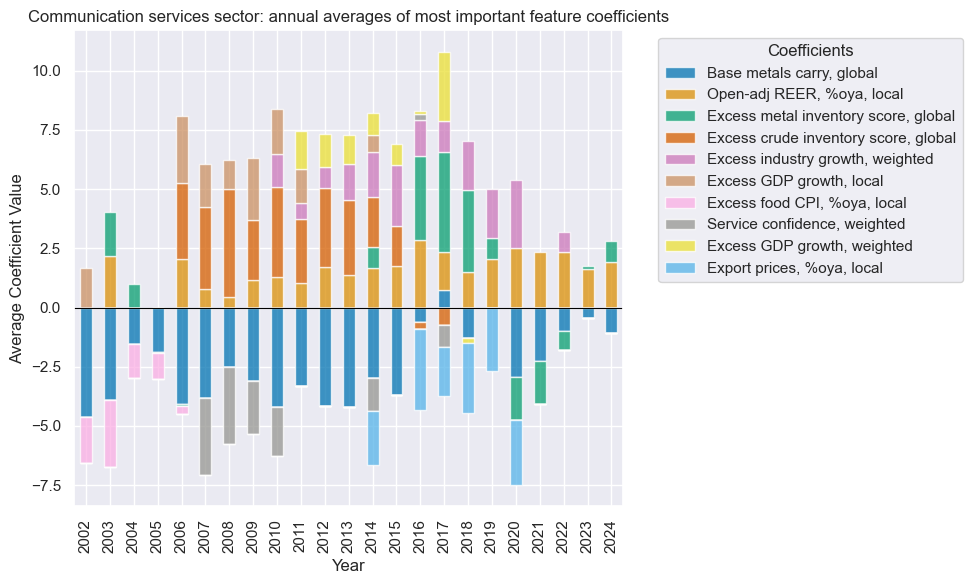

In [86]:
xcatx = csr_dict["signal_name"]
secname = csr_dict["sector_name"]

so_csr.coefs_stackedbarplot(
    name=xcatx,
    ftrs_renamed=cat_label_dict,
    title=f"{secname} sector: annual averages of most important feature coefficients",
)

#### Signal quality check

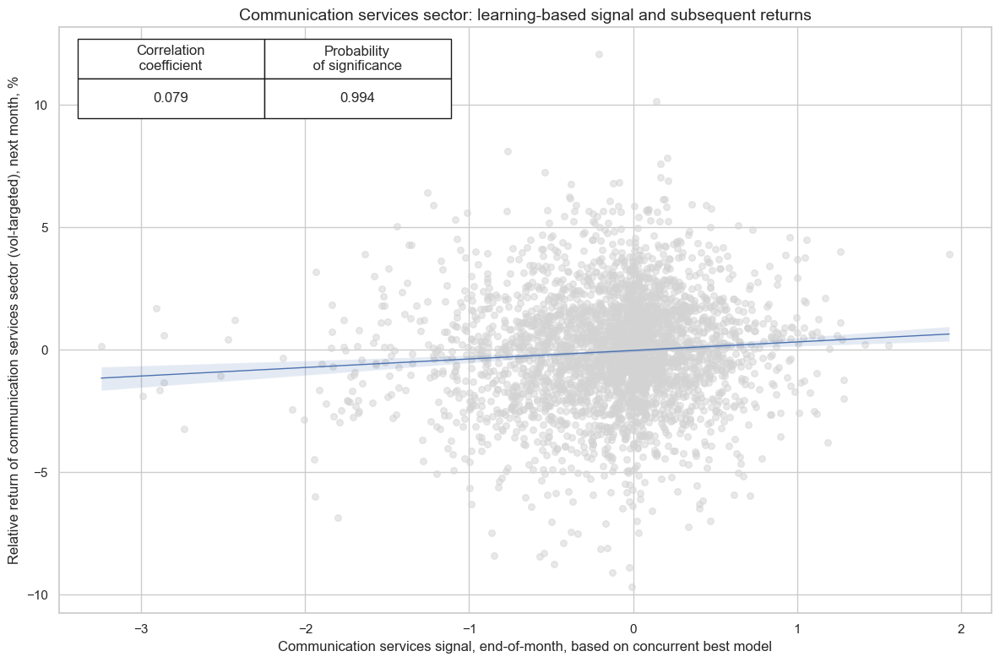

In [87]:
xcatx = [csr_dict["signal_name"], csr_dict["ret"]]
cidx = csr_dict["cidx"]
secname = csr_dict["sector_name"]

cr_csr = msp.CategoryRelations(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    freq=csr_dict["freq"],
    blacklist = csr_dict["black"],
    lag=1,
    xcat_aggs=["last", "sum"],
    slip=1,
)

cr_csr.reg_scatter(
    title=f"{secname} sector: learning-based signal and subsequent returns",
    labels=False,
    prob_est="map",
    xlab=f"{secname} signal, end-of-month, based on concurrent best model",
    ylab=f"Relative return of {secname.lower()} sector (vol-targeted), next month, %",
    coef_box="upper left",
    size=(12, 8),
)

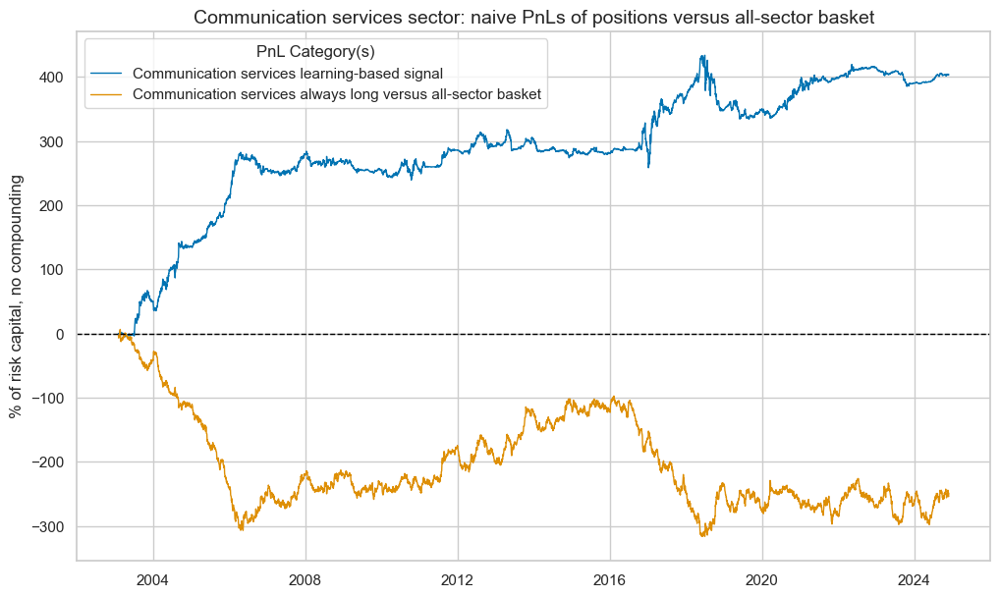

xcat,Communication services learning-based signal,Communication services always long versus all-sector basket
Return %,18.496164,-11.402601
St. Dev. %,29.464506,35.693288
Sharpe Ratio,0.627744,-0.319461
Sortino Ratio,0.913374,-0.452367
Max 21-Day Draw %,-58.825569,-41.34344
Max 6-Month Draw %,-86.419369,-110.518234
Peak to Trough Draw %,-99.632582,-322.629621
Top 5% Monthly PnL Share,0.918294,-1.31652
USD_EQXR_NSA correl,0.008472,-0.039535
Traded Months,263,263


In [88]:
xcatx = [csr_dict["signal_name"]]
cidx = csr_dict["cidx"]
secname = csr_dict["sector_name"]
signal_name = csr_dict["signal_name"]
pnl_name = csr_dict["pnl_name"]

pnl_csr = msn.NaivePnL(
    df=dfx,
    ret=csr_dict["ret"],
    sigs=xcatx,
    cids=cidx,
    start=default_start_date,
    blacklist = csr_dict["black"],
    bms=["USD_EQXR_NSA"],
)

for xcat in xcatx:
    pnl_csr.make_pnl(
        sig=xcat,
        sig_op="zn_score_pan",
        rebal_freq="monthly",
        neutral="zero",
        rebal_slip=1,
        vol_scale = None,
        thresh=3,
        pnl_name=pnl_name,
    )
pnl_csr.make_long_pnl(
    vol_scale=None, label=f"{secname} always long versus all-sector basket"
)

pnl_csr.plot_pnls(
    pnl_cats=pnl_csr.pnl_names,
    title=f"{secname} sector: naive PnLs of positions versus all-sector basket",
    title_fontsize=14
)

csr_dict["pnls"] = pnl_csr
pnl_csr.evaluate_pnls(pnl_cats=pnl_csr.pnl_names)

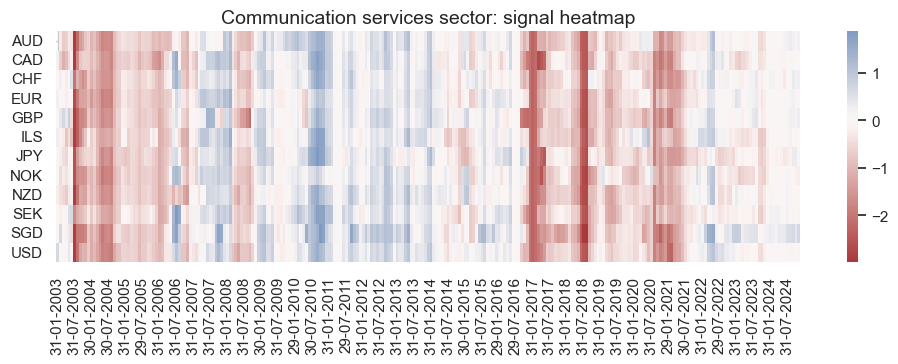

In [89]:
pnl_name = csr_dict["pnl_name"]
secname = csr_dict["sector_name"]

pnl_csr.signal_heatmap(
    pnl_name=pnl_name,
    figsize=(12, 3),
    title=f"{secname} sector: signal heatmap",
)

### Utilities

#### Factor selection and signal generation

In [90]:
sector = "UTL"

utl_dict = {
    "sector_name": sector_labels[sector],
    "signal_name": f"{sector}SOL",
    "pnl_name": f"{sector_labels[sector]} learning-based signal",
    "xcatx": macroz,
    "cidx": cids_eq,
    "ret": f"EQC{sector}{default_target_type}",
    "freq": "M",
    "black": sector_blacklist[sector],
    "srr": None,
    "pnls": None,
}

In [91]:
xcatx = utl_dict["xcatx"] + [utl_dict["ret"]]
cidx = utl_dict["cidx"]

so_utl = msl.SignalOptimizer(
    df = dfx,
    xcats = xcatx,
    cids = cidx,
    blacklist = utl_dict["black"],
    freq = utl_dict["freq"],
    lag = 1,
    xcat_aggs=["last", "sum"],
)

  0%|          | 0/89 [00:00<?, ?it/s]

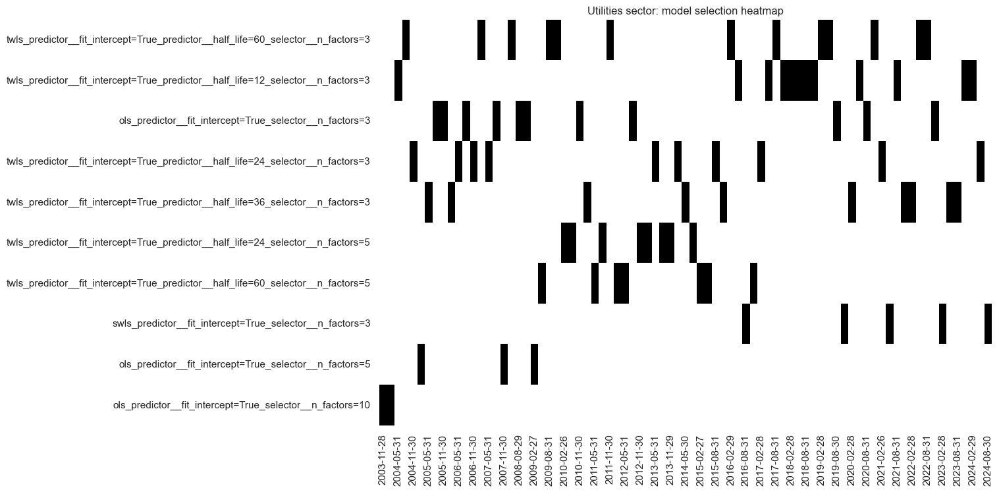

In [92]:
secname = utl_dict["sector_name"]
signal_name = utl_dict["signal_name"]

so_utl.calculate_predictions(
    name=signal_name,
    models=default_models,
    scorers=default_metric,
    hyperparameters=default_hparam_grid,
    inner_splitters = default_splitter,
    test_size=default_test_size,
    min_cids=default_min_cids, 
    min_periods=default_min_periods,
    n_jobs_outer=-1,
    split_functions=default_split_functions,
)
so_utl.models_heatmap(
    signal_name,
    cap=10,
    title=f"{secname} sector: model selection heatmap",
)

# Store signals
dfa = so_utl.get_optimized_signals()
dfx = msm.update_df(dfx, dfa)

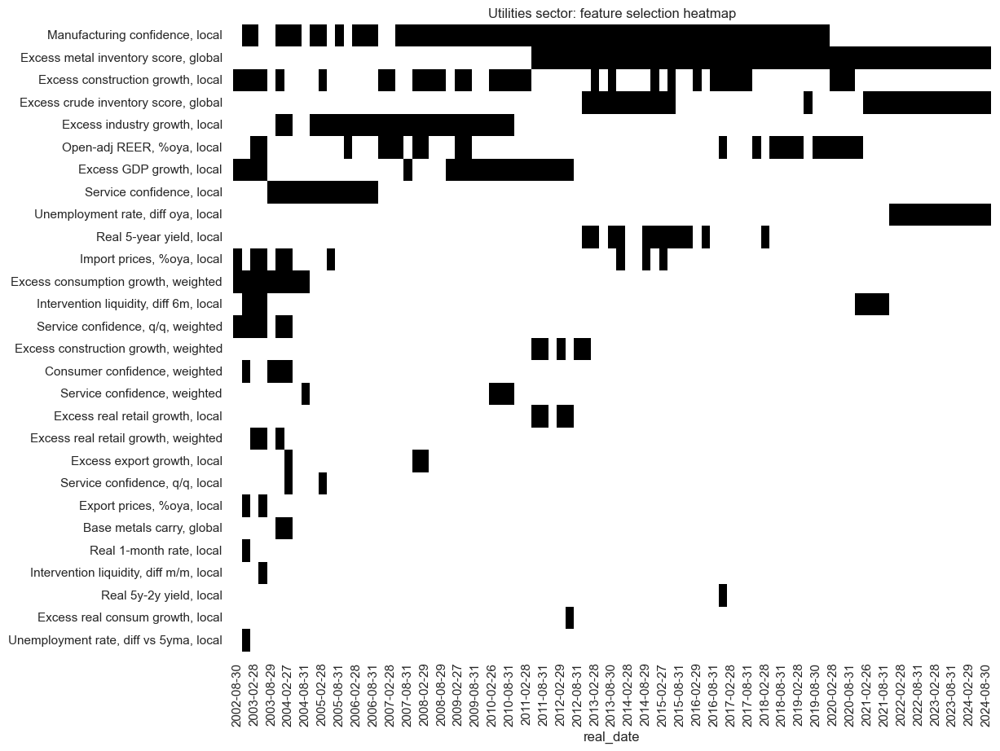

In [93]:
xcatx = utl_dict["signal_name"]
secname = utl_dict["sector_name"]

so_utl.feature_selection_heatmap(
    xcatx,
    remove_blanks=True,
    title=f"{secname} sector: feature selection heatmap",
    ftrs_renamed=cat_label_dict,
    figsize=(12, 10),
)

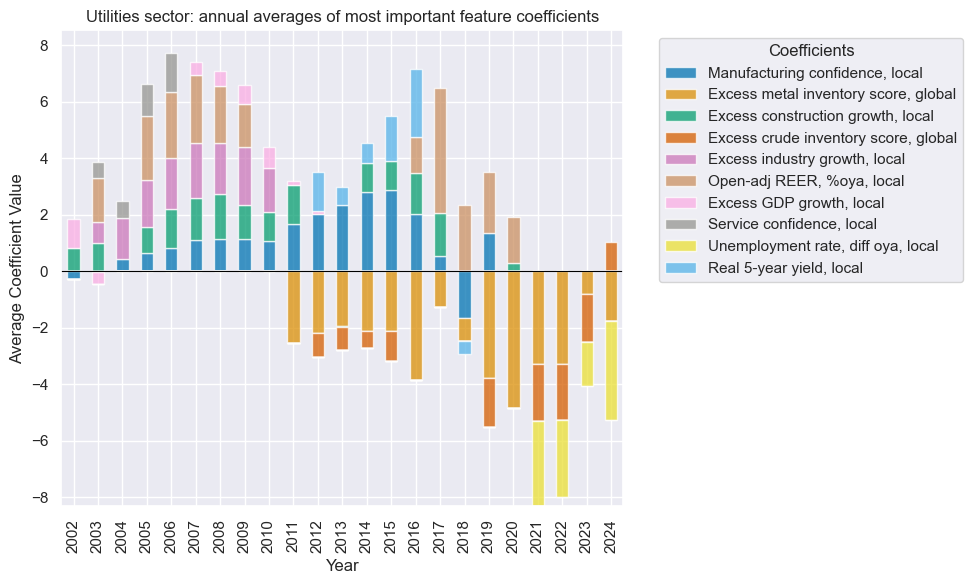

In [94]:
xcatx = utl_dict["signal_name"]
secname = utl_dict["sector_name"]

so_utl.coefs_stackedbarplot(
    name=xcatx,
    ftrs_renamed=cat_label_dict,
    title=f"{secname} sector: annual averages of most important feature coefficients",
)

#### Signal quality check

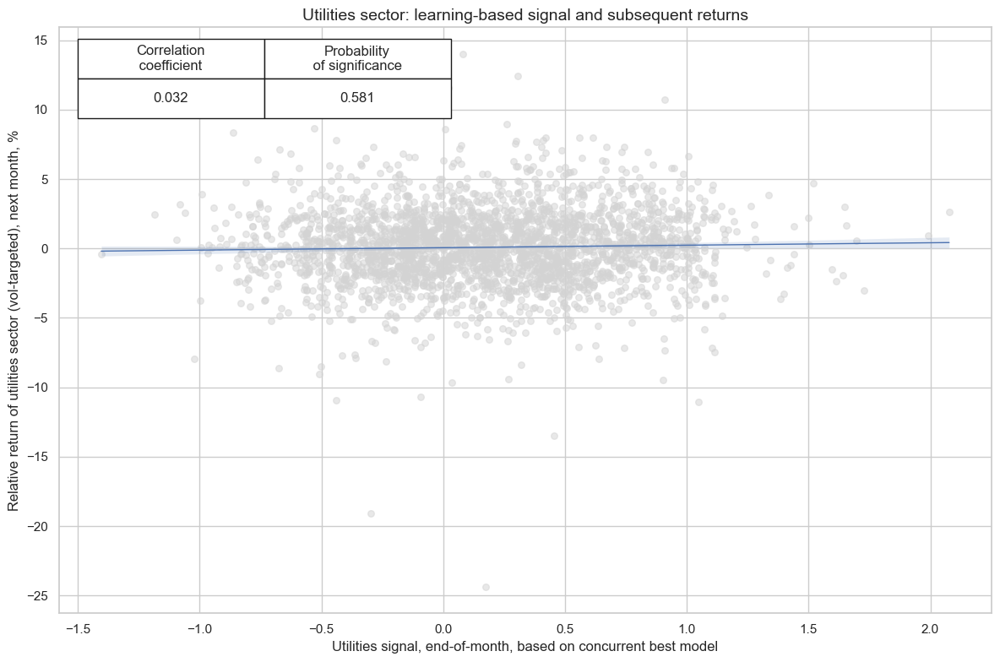

In [95]:
xcatx = [utl_dict["signal_name"], utl_dict["ret"]]
cidx = utl_dict["cidx"]
secname = utl_dict["sector_name"]

cr_utl = msp.CategoryRelations(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    freq=utl_dict["freq"],
    blacklist=utl_dict["black"],
    lag=1,
    xcat_aggs=["last", "sum"],
    slip=1,
)

cr_utl.reg_scatter(
    title=f"{secname} sector: learning-based signal and subsequent returns",
    labels=False,
    prob_est="map",
    xlab=f"{secname} signal, end-of-month, based on concurrent best model",
    ylab=f"Relative return of {secname.lower()} sector (vol-targeted), next month, %",
    coef_box="upper left",
    size=(12, 8),
)

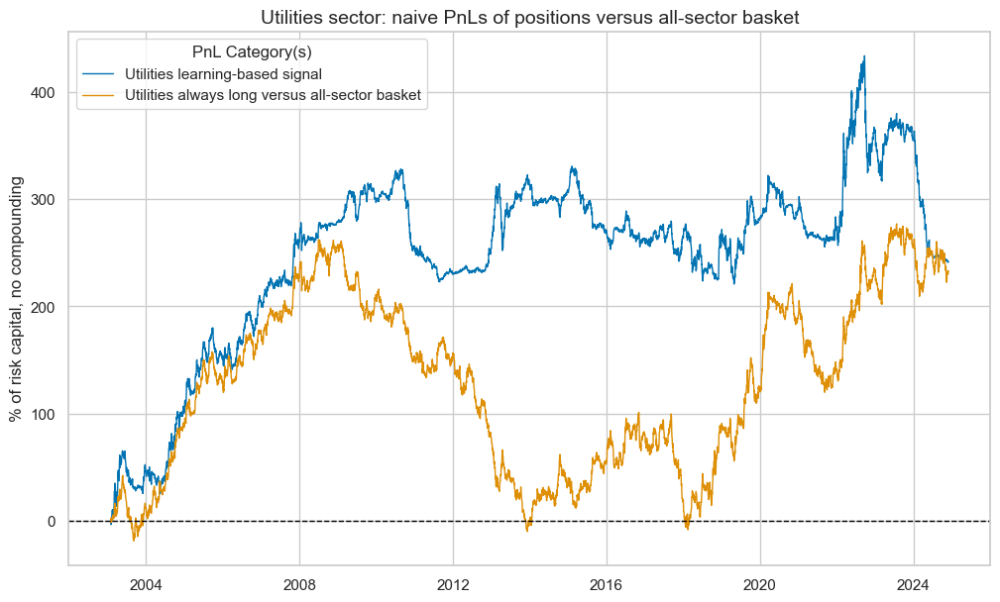

xcat,Utilities learning-based signal,Utilities always long versus all-sector basket
Return %,11.080234,10.700873
St. Dev. %,39.046812,39.466097
Sharpe Ratio,0.283768,0.271141
Sortino Ratio,0.410529,0.395969
Max 21-Day Draw %,-109.347992,-45.235513
Max 6-Month Draw %,-118.250706,-93.980448
Peak to Trough Draw %,-192.878245,-272.563373
Top 5% Monthly PnL Share,1.638451,1.788333
USD_EQXR_NSA correl,-0.051172,-0.197999
Traded Months,263,263


In [96]:
xcatx = [utl_dict["signal_name"]]
cidx = utl_dict["cidx"]
secname = utl_dict["sector_name"]
signal_name = utl_dict["signal_name"]
pnl_name = utl_dict["pnl_name"]

pnl_utl = msn.NaivePnL(
    df=dfx,
    ret=utl_dict["ret"],
    sigs=xcatx,
    cids=cidx,
    start=default_start_date,
    blacklist = utl_dict["black"],
    bms=["USD_EQXR_NSA"],
)

for xcat in xcatx:
    pnl_utl.make_pnl(
        sig=xcat,
        sig_op="zn_score_pan",
        rebal_freq="monthly",
        neutral="zero",
        rebal_slip=1,
        vol_scale = None,
        thresh=3,
        pnl_name=pnl_name,
    )
pnl_utl.make_long_pnl(
    vol_scale=None, label=f"{secname} always long versus all-sector basket"
)

pnl_utl.plot_pnls(
    pnl_cats=pnl_utl.pnl_names,
    title=f"{secname} sector: naive PnLs of positions versus all-sector basket",
    title_fontsize=14
)

utl_dict["pnls"] = pnl_utl
pnl_utl.evaluate_pnls(pnl_cats=pnl_utl.pnl_names)

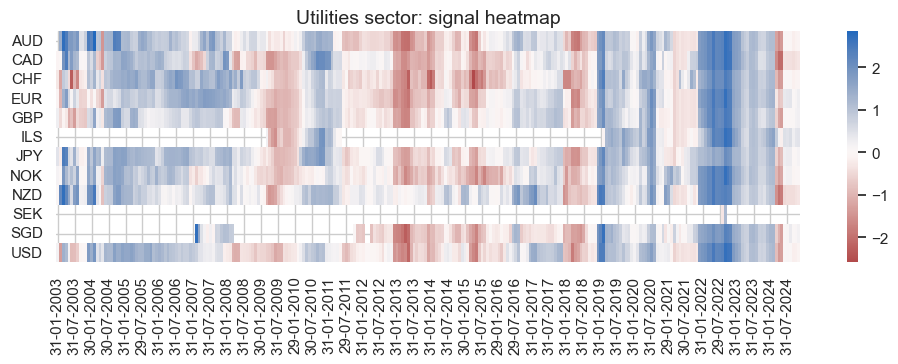

In [97]:
pnl_name = utl_dict["pnl_name"]
secname = utl_dict["sector_name"]

pnl_utl.signal_heatmap(
    pnl_name=pnl_name,
    figsize=(12, 3),
    title=f"{secname} sector: signal heatmap",
)

### Real estate

#### Factor selection and signal generation

In [98]:
sector = "REL"

rel_dict = {
    "sector_name": sector_labels[sector],
    "signal_name": f"{sector}SOL",
    "pnl_name": f"{sector_labels[sector]} learning-based signal",
    "xcatx": macroz,
    "cidx": cids_eq,
    "ret": f"EQC{sector}{default_target_type}",
    "freq": "M",
    "black": sector_blacklist[sector],
    "srr": None,
    "pnls": None,
}

In [99]:
xcatx = rel_dict["xcatx"] + [rel_dict["ret"]]
cidx = rel_dict["cidx"]

so_rel = msl.SignalOptimizer(
    df = dfx,
    xcats = xcatx,
    cids = cidx,
    blacklist = rel_dict["black"],
    freq = rel_dict["freq"],
    lag = 1,
    xcat_aggs=["last", "sum"],
)

  0%|          | 0/89 [00:00<?, ?it/s]

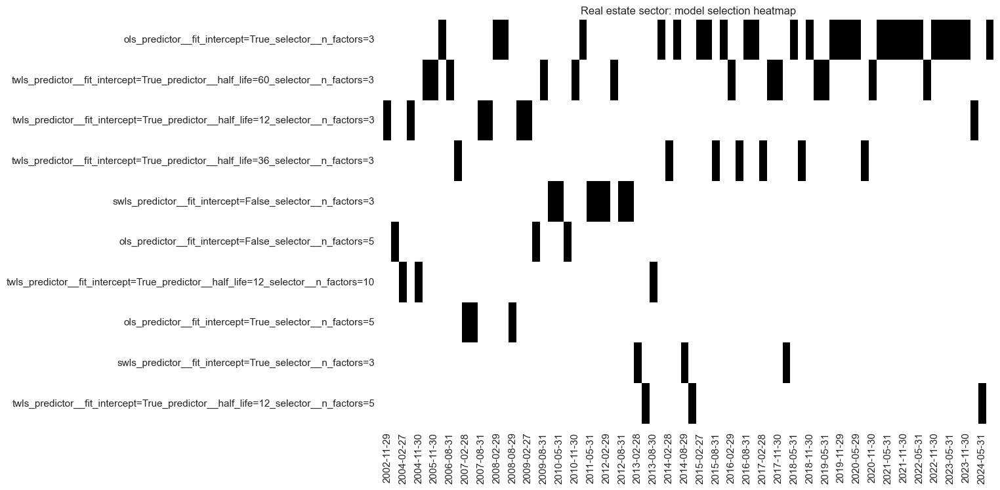

In [100]:
secname = rel_dict["sector_name"]
signal_name = rel_dict["signal_name"]


so_rel.calculate_predictions(
    name=signal_name,
    models=default_models,
    scorers=default_metric,
    hyperparameters=default_hparam_grid,
    inner_splitters = default_splitter,
    test_size=default_test_size,
    min_cids=default_min_cids, 
    min_periods=default_min_periods,
    n_jobs_outer=-1,
    split_functions=default_split_functions,
)
so_rel.models_heatmap(
    signal_name,
    cap=10,
    title=f"{secname} sector: model selection heatmap",
)

# Store signals
dfa = so_rel.get_optimized_signals()
dfx = msm.update_df(dfx, dfa)

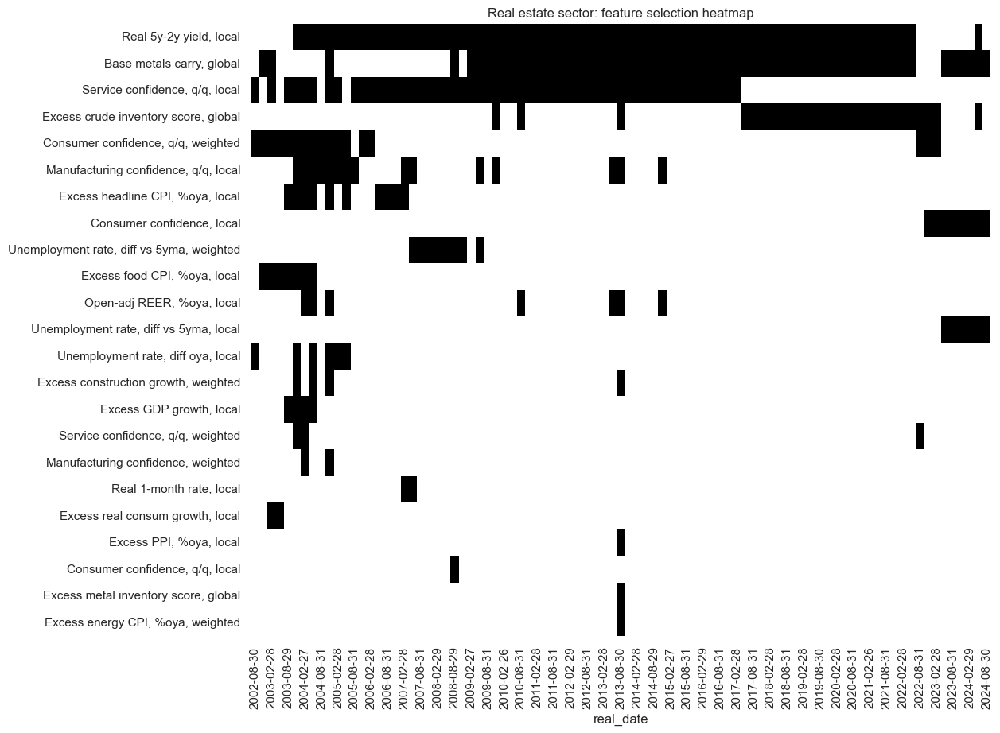

In [101]:
xcatx = rel_dict["signal_name"]
secname = rel_dict["sector_name"]

so_rel.feature_selection_heatmap(
    xcatx,
    remove_blanks=True,
    title=f"{secname} sector: feature selection heatmap",
    ftrs_renamed=cat_label_dict,
    figsize=(12, 10),
)

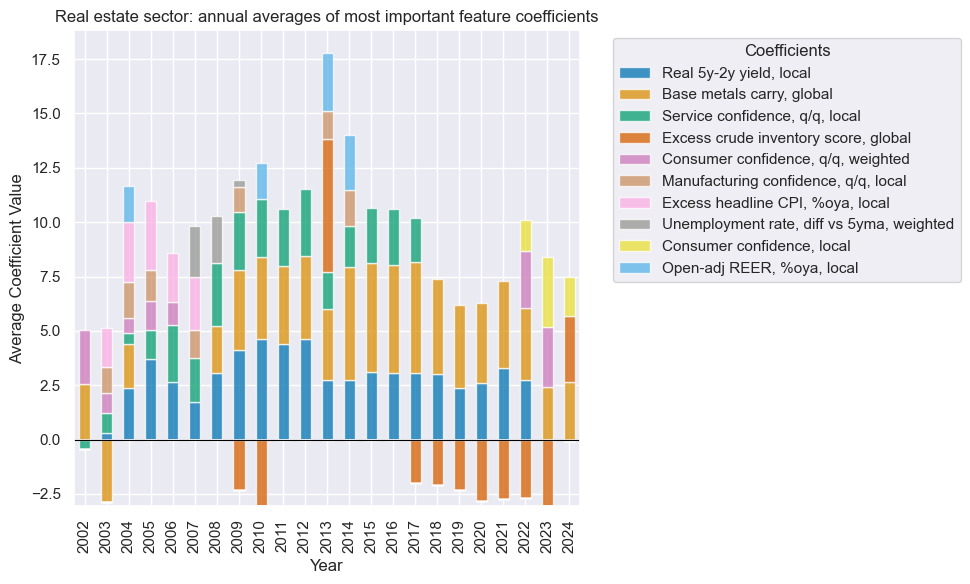

In [102]:
xcatx = rel_dict["signal_name"]
secname = rel_dict["sector_name"]

so_rel.coefs_stackedbarplot(
    name=xcatx,
    ftrs_renamed=cat_label_dict,
    title=f"{secname} sector: annual averages of most important feature coefficients",
)

#### Signal quality check

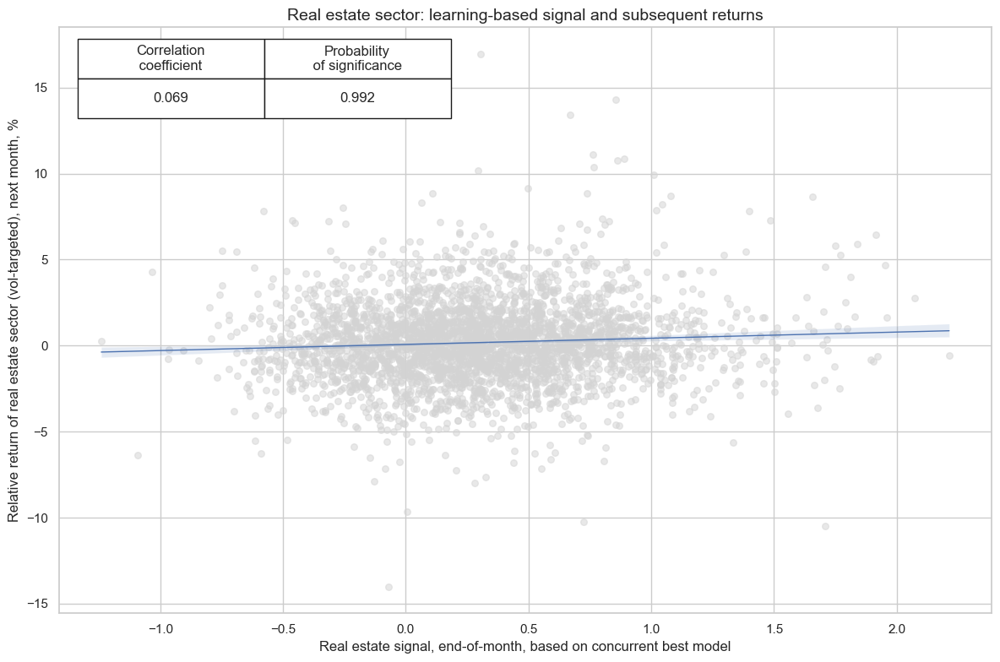

In [103]:
xcatx = [rel_dict["signal_name"], rel_dict["ret"]]
cidx = rel_dict["cidx"]
secname = rel_dict["sector_name"]

cr_rel = msp.CategoryRelations(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    freq=rel_dict["freq"],
    blacklist=rel_dict["black"],
    lag=1,
    xcat_aggs=["last", "sum"],
    slip=1,
)

cr_rel.reg_scatter(
    title=f"{secname} sector: learning-based signal and subsequent returns",
    labels=False,
    prob_est="map",
    xlab=f"{secname} signal, end-of-month, based on concurrent best model",
    ylab=f"Relative return of {secname.lower()} sector (vol-targeted), next month, %",
    coef_box="upper left",
    size=(12, 8),
)


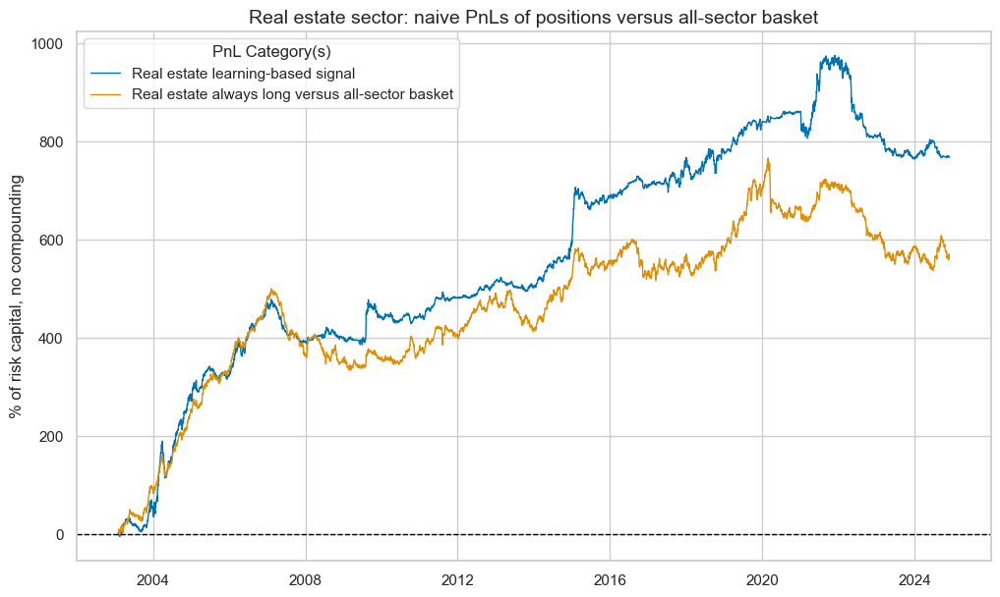

xcat,Real estate learning-based signal,Real estate always long versus all-sector basket
Return %,35.146641,26.023118
St. Dev. %,40.79298,42.63276
Sharpe Ratio,0.861586,0.610402
Sortino Ratio,1.298488,0.871942
Max 21-Day Draw %,-78.103799,-107.121602
Max 6-Month Draw %,-138.261811,-123.928869
Peak to Trough Draw %,-210.994384,-228.650391
Top 5% Monthly PnL Share,0.83304,0.896213
USD_EQXR_NSA correl,-0.044871,-0.057001
Traded Months,263,263


In [104]:
xcatx = [rel_dict["signal_name"]]
cidx = rel_dict["cidx"]
secname = rel_dict["sector_name"]
signal_name = rel_dict["signal_name"]
pnl_name = rel_dict["pnl_name"]

pnl_rel = msn.NaivePnL(
    df=dfx,
    ret=rel_dict["ret"],
    sigs=xcatx,
    cids=cidx,
    start=default_start_date,
    blacklist = rel_dict["black"],
    bms=["USD_EQXR_NSA"],
)

for xcat in xcatx:
    pnl_rel.make_pnl(
        sig=xcat,
        sig_op="zn_score_pan",
        rebal_freq="monthly",
        neutral="zero",
        rebal_slip=1,
        vol_scale = None,
        thresh=3,
        pnl_name=pnl_name,
    )
pnl_rel.make_long_pnl(vol_scale=None, label=f"{secname} always long versus all-sector basket")

pnl_rel.plot_pnls(
    pnl_cats=pnl_rel.pnl_names, 
    title=f"{secname} sector: naive PnLs of positions versus all-sector basket",
    title_fontsize=14
)

rel_dict["pnls"] = pnl_rel
pnl_rel.evaluate_pnls(pnl_cats=pnl_rel.pnl_names)

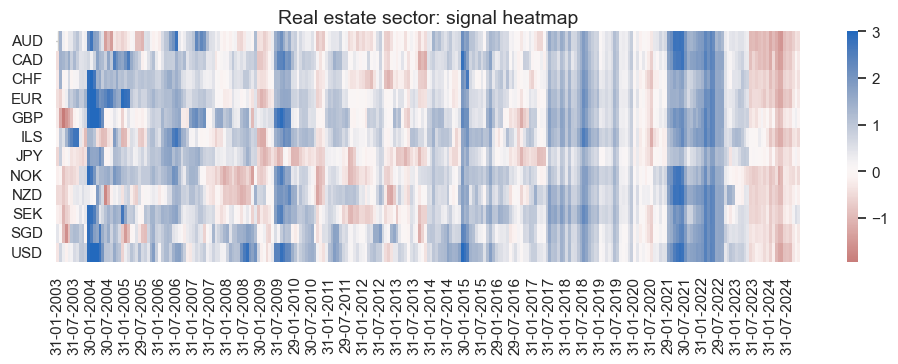

In [105]:
pnl_name = rel_dict["pnl_name"]
secname = rel_dict["sector_name"]

pnl_rel.signal_heatmap(
    pnl_name=pnl_name,
    figsize=(12, 3),
    title=f"{secname} sector: signal heatmap",
)

### Summary

### Sector-specific signals and returns

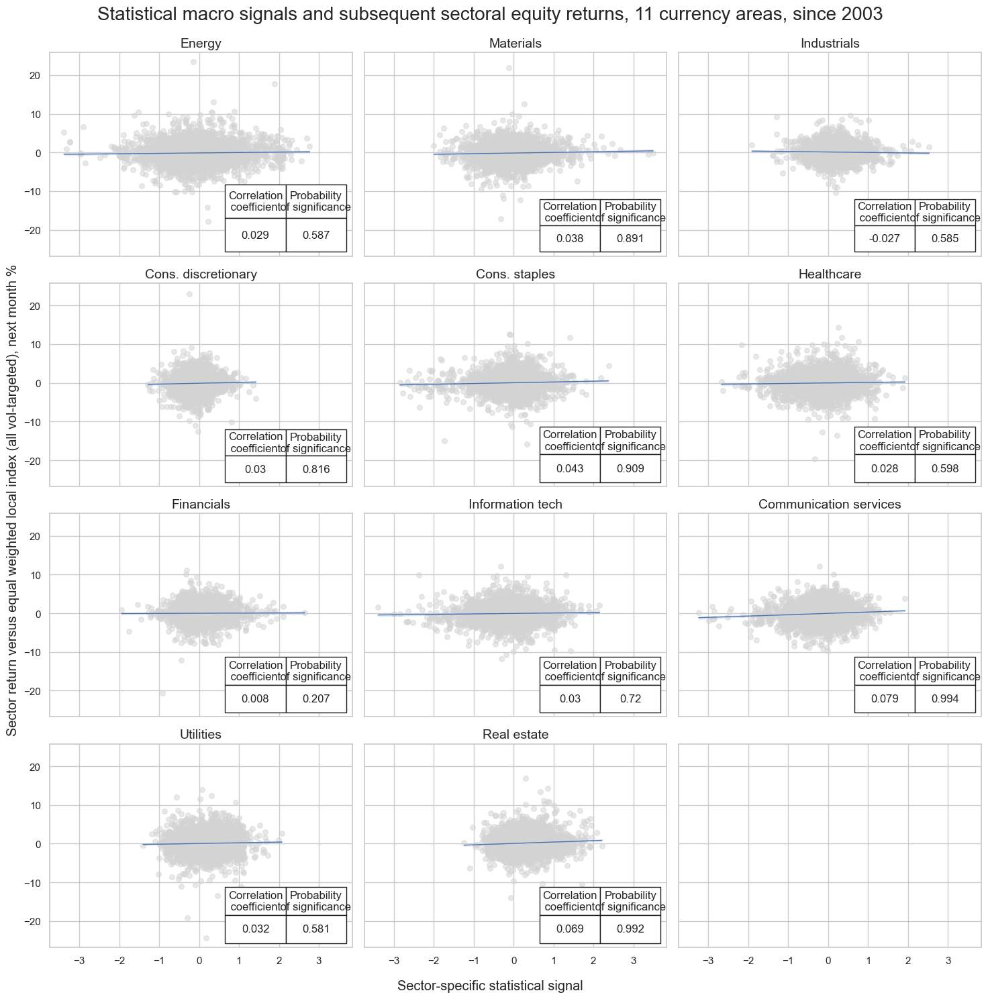

In [106]:
sec_catregs = {
    "enr": cr_enr,
    "mat": cr_mat,
    "ind": cr_ind,
    "cod": cr_cod, 
    "cos": cr_cos,
    "hlc": cr_hlc,
    "fin": cr_fin,
    "ite": cr_ite, 
    "csr": cr_csr,
    "utl": cr_utl, 
    "rel": cr_rel,
}


msv.multiple_reg_scatter(
    cat_rels=list(sec_catregs.values()),
    ncol=3,
    nrow=4,
    figsize=(15, 15),
    title="Statistical macro signals and subsequent sectoral equity returns, 11 currency areas, since 2003",
    title_xadj=0.5,
    title_yadj=0.99,
    title_fontsize=20,
    xlab="Sector-specific statistical signal",
    ylab="Sector return versus equal weighted local index (all vol-targeted), next month %",
    coef_box="lower right",
    prob_est="map",
    single_chart=True,
    subplot_titles=[sector_labels[sector.upper()] for sector in sec_catregs.keys()],
)

### Combined cross-sector trading PnL

In [107]:
sec_pnls = {
    "enr": pnl_enr,
    "mat": pnl_mat,
    "ind": pnl_ind,
    "cod": pnl_cod, 
    "cos": pnl_cos,
    "hlc": pnl_hlc,
    "fin": pnl_fin,
    "ite": pnl_ite, 
    "csr": pnl_csr,
    "utl": pnl_utl, 
    "rel": pnl_rel,
}

ma_pnl = msn.MultiPnL()
for sec, pnl in sec_pnls.items():
    ma_pnl.add_pnl(pnl, pnl_xcats=[f"{sector_labels[sec.upper()]} learning-based signal"])

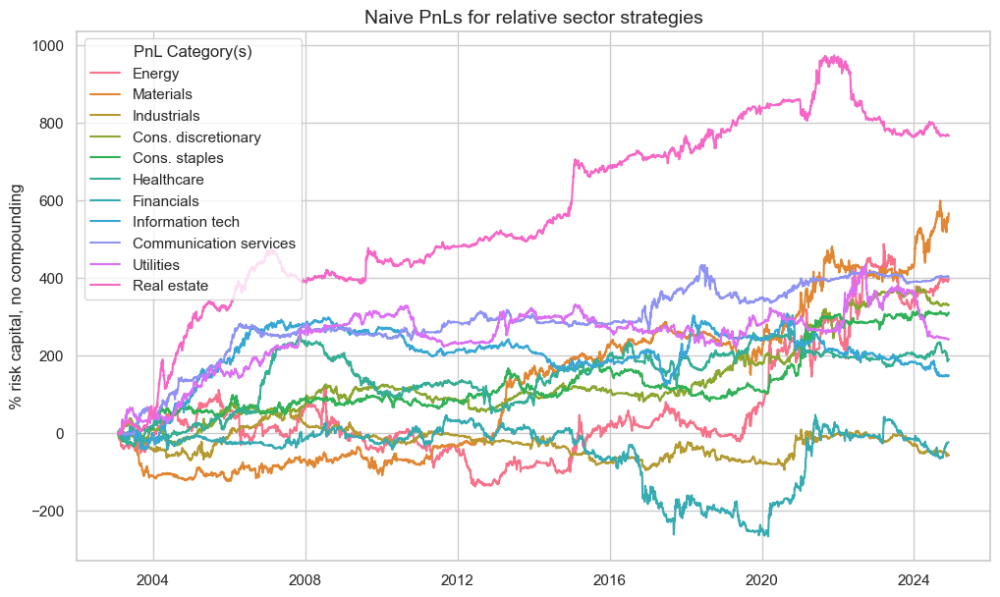

In [108]:
ma_pnl.plot_pnls(
    pnl_xcats=[
        f"{sector_labels[sec.upper()]} learning-based signal" for sec in sec_pnls.keys()
    ],
    title="Naive PnLs for relative sector strategies",
    xcat_labels=[sector_labels[sec.upper()] for sec in sec_pnls.keys()],
)

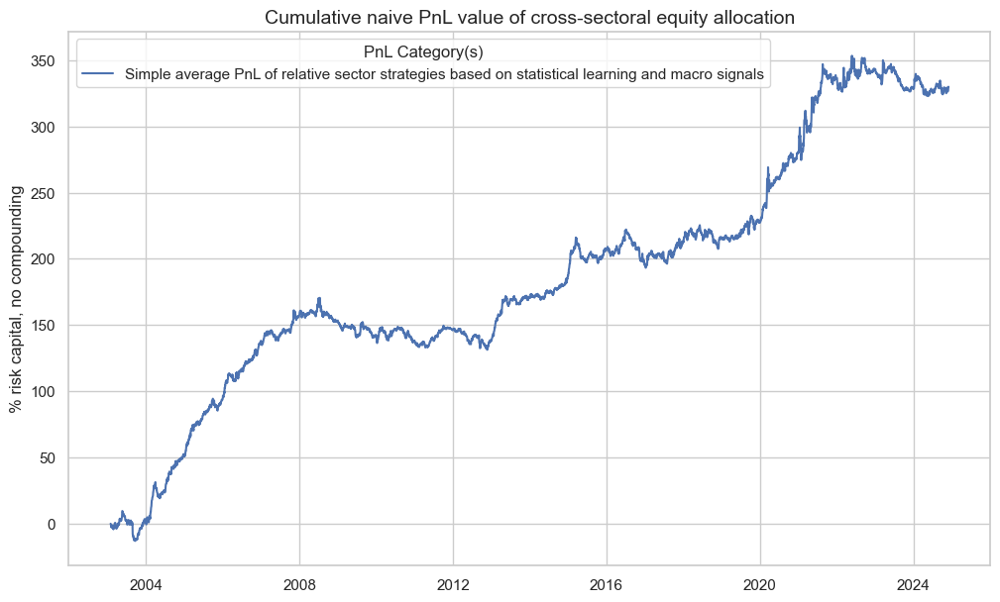

In [109]:
cpname = "Simple average PnL of relative sector strategies based on statistical learning and macro signals"

macro_sector_pnl = ma_pnl.combine_pnls(
    pnl_xcats=[f"{sector_labels[sec.upper()]} learning-based signal" for sec in sec_pnls.keys()],
    composite_pnl_xcat=cpname,
    weights=None,
)
ma_pnl.plot_pnls(
    [cpname],
    title="Cumulative naive PnL value of cross-sectoral equity allocation",
)

In [110]:
tbr = ma_pnl.evaluate_pnls()
tbr = tbr.rename(columns={
    **{
        f"{sector_labels[sec.upper()]} learning-based signal/EQC{sec.upper()}R_VT10vALL": f"{sector_labels[sec.upper()]}" 
        for sec in sec_pnls.keys()
    }, 
    **{
        "Simple average PnL of relative sector strategies based on statistical learning and macro signals": "Simple average"
    }
})

selected_rows = ["Return %", "St. Dev. %", "Sharpe Ratio", "Sortino Ratio", "USD_EQXR_NSA correl"]
selected_columns = ["Simple average"] + [sector_labels[sec.upper()] for sec in sec_pnls.keys()] 
selected_pnl_stats = tbr.loc[selected_rows, selected_columns].T

In [111]:

display(selected_pnl_stats.style.format("{:.2f}"))

,Return %,St. Dev. %,Sharpe Ratio,Sortino Ratio,USD_EQXR_NSA correl
Simple average,15.12,15.10,1.00,1.49,nan
Energy,18.19,67.73,0.27,0.39,-0.08
Materials,25.97,47.27,0.55,0.81,-0.02
Industrials,-2.62,28.24,-0.09,-0.13,0.01
Cons. discretionary,15.12,29.85,0.51,0.72,-0.02
Cons. staples,14.22,33.63,0.42,0.62,-0.01
Healthcare,8.70,35.61,0.24,0.35,0.00
Financials,-1.09,43.64,-0.02,-0.04,-0.04
Information tech,6.81,33.92,0.20,0.27,-0.00
Communication services,18.50,29.46,0.63,0.91,0.01


## Appendix

### Appendix 1 - Macro quantamental indicators description

In [112]:
# Convert the dictionary to an HTML table with custom inline CSS
html_table = cat_labels.to_html(index=True, table_id="custom_table")

# Inject CSS to align text to the left and reduce font size
css = """
<style>
#custom_table th, #custom_table td {
    text-align: left;
    font-size: 12px; /* Adjust the font size as needed */
}
</style>
"""

In [113]:
# Display the styled HTML table
HTML(css + html_table)